different solver, fixed parameters

<>:111: SyntaxWarning: invalid escape sequence '\m'
<>:111: SyntaxWarning: invalid escape sequence '\m'
<>:111: SyntaxWarning: invalid escape sequence '\m'
<>:111: SyntaxWarning: invalid escape sequence '\m'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/1385798730.py:111: SyntaxWarning: invalid escape sequence '\m'
  label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/1385798730.py:111: SyntaxWarning: invalid escape sequence '\m'
  label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$'


t=0.0, aRate=1.10e-05, total=1.1e+07, aMax=5.0e-03
t=0.0, aRate=1.10e-05, total=1.1e+07, aMax=5.0e-03
t=0.0, aRate=1.10e-05, total=1.1e+07, aMax=5.0e-03
t=0.0, aRate=1.10e-05, total=1.1e+07, aMax=5.0e-03
t=0.0, aRate=1.10e-05, total=1.1e+07, aMax=5.0e-03
t=0.0, aRate=1.10e-05, total=1.1e+07, aMax=5.0e-03
t=0.0, aRate=1.10e-05, total=1.1e+07, aMax=5.0e-03
t=0.0, aRate=1.10e-05, total=1.1e+07, aMax=5.0e-03
t=0.0, aRate=1.10e-05, total=1.1e+07, aMax=5.0e-03
t=0.0, aRate=1.10e-05, total=1.1e+07, aMax=5.0e-03
t=0.0, aRate=1.10e-05, total=1.1e+07, aMax=5.0e-03
t=0.0, aRate=1.10e-05, total=1.1e+07, aMax=5.0e-03
t=0.0, aRate=1.10e-05, total=1.1e+07, aMax=5.0e-03
t=0.0, aRate=1.10e-05, total=1.1e+07, aMax=5.0e-03
t=0.0, aRate=1.10e-05, total=1.1e+07, aMax=5.0e-03
t=0.0, aRate=1.10e-05, total=1.1e+07, aMax=5.0e-03
t=0.0, aRate=1.10e-05, total=1.1e+07, aMax=5.0e-03
t=0.0, aRate=1.10e-05, total=1.1e+07, aMax=5.0e-03
t=0.0, aRate=1.10e-05, total=1.1e+07, aMax=5.0e-03
t=0.0, aRate=1.10e-05, total=1.

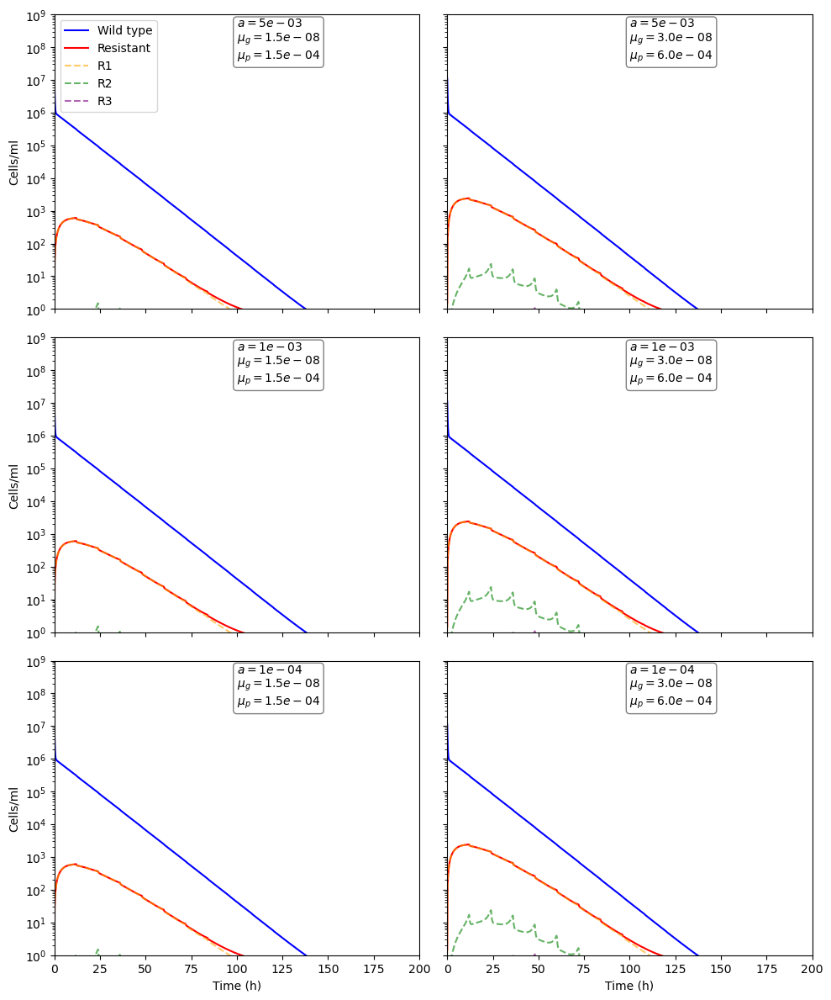

In [42]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt

def drug(t, decayRate, doseInterval, aPeak):
    dose_times = np.arange(0, t + 1, doseInterval)
    return np.sum([aPeak * np.exp(-decayRate * (t - d)) for d in dose_times if d <= t])

def growthRate(a, mic, gMax, gMin, kappa):
    ratio = a / mic
    return gMax - (gMax - gMin) * (ratio**kappa / (ratio**kappa + 1))

def mutationRate(g, m, tau, h):
    return m * g + tau * m * np.exp(-h * g) if g > 0 else 0

def system(t, y, p):
    nw, pw, nr1, pr1, nr2, pr2, nr3, pr3, e = y
    total = nw + pw + nr1 + pr1 + nr2 + pr2 + nr3 + pr3
    a = drug(t, p['decayRate'], p['doseInterval'], p['aPeak'])
    aRate = p['aMax'] * total / p['c']
    print(f't={t:.1f}, aRate={aRate:.2e}, total={total:.1e}, aMax={p["aMax"]:.1e}')
    b = p['b']

    gWt = growthRate(a, p['mic'][0], p['gMax'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR1 = growthRate(a, p['mic'][1], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR2 = growthRate(a, p['mic'][2], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR3 = growthRate(a, p['mic'][3], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])

    muW = mutationRate(gWt, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muR1 = mutationRate(gR1, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muR2 = mutationRate(gR2, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muP = p['muP'] if p['mutation'] else 0

    dNw = gWt * nw - aRate * nw + b * pw - muW * nw - p['jN'] * nw * e
    dPw = aRate * nw - b * pw - muP * pw - p['jP'] * pw * e
    dNr1 = gR1 * nr1 - aRate * nr1 + b * pr1 + muW * nw - muR1 * nr1 - p['jN'] * nr1 * e
    dPr1 = aRate * nr1 - b * pr1 + muP * pw - muP * pr1 - p['jP'] * pr1 * e
    dNr2 = gR2 * nr2 - aRate * nr2 + b * pr2 + muR1 * nr1 - muR2 * nr2 - p['jN'] * nr2 * e
    dPr2 = aRate * nr2 - b * pr2 + muP * pr1 - muP * pr2 - p['jP'] * pr2 * e
    dNr3 = gR3 * nr3 - aRate * nr3 + b * pr3 + muR2 * nr2 - p['jN'] * nr3 * e
    dPr3 = aRate * nr3 - b * pr3 + muP * pr2 - p['jP'] * pr3 * e
    dE = p['q'] * (p['emax'] - e) - p['l'] * e

    return [dNw, dPw, dNr1, dPr1, dNr2, dPr2, dNr3, dPr3, dE]

# Parameters from Supplement Table S6 and Methods
baseParams = {
    'mic': [1, 4, 20, 50],
    'gMax': 1.0,
    'gMaxR': 0.9,
    'gMin': -6.5,
    'kappa': 1,
    'c': 5e9,
    'b': 0.1,
    'tau': 2,
    'h': 5,
    'mutation': True,
    'aPeak': 25,
    'doseInterval': 12,
    'decayRate': np.log(2) / 2.5,
    'emax': 1e6,
    'l': 1e-3,
    'q': 3e-4,
    'jN': 5e-6,
    'jP': 5e-8
}

# Scenarios for 3 different persistence levels and 2 mutation rate settings
aVals = [5e-3, 1e-3, 1e-4]
mutationVals = [(1.5e-8, 1.5e-4), (3e-8, 6e-4)]

# Simulation parameters
tSpan = (0, 200)
tEval = np.linspace(*tSpan, 1000)
y0 = [1e7, 1e6, 1, 0, 0, 0, 0, 0, 0]  # include 10% persisters at t=0



fig, axs = plt.subplots(3, 2, figsize=(10, 12), sharex=True, sharey=True)
for i, aMax in enumerate(aVals):
    for j, (muG, muP) in enumerate(mutationVals):
        p = baseParams.copy()
        p['aMax'] = aMax
        p['m'] = muG
        p['muP'] = muP
        sol = solve_ivp(system, tSpan, y0, args=(p,), t_eval=tEval, method='BDF', atol=1e-12, rtol=1e-9)
        y = np.clip(sol.y, 1e-1, None)

        wt = y[0] + y[1]
        r1 = y[2] + y[3]
        r2 = y[4] + y[5]
        r3 = y[6] + y[7]
        rs = r1 + r2 + r3

        ax = axs[i, j]
        ax.plot(sol.t, wt, label='Wild type', color='blue')
        ax.plot(sol.t, rs, label='Resistant', color='red')
        ax.plot(sol.t, r1, '--', color='orange', alpha=0.6, label='R1' if i == 0 and j == 0 else None)
        ax.plot(sol.t, r2, '--', color='green', alpha=0.6, label='R2' if i == 0 and j == 0 else None)
        ax.plot(sol.t, r3, '--', color='purple', alpha=0.6, label='R3' if i == 0 and j == 0 else None)

        ax.set_yscale('log')
        ax.set_xlim(*tSpan)
        ax.set_ylim(1, 1e9)
        if i == 2:
            ax.set_xlabel('Time (h)')
        if j == 0:
            ax.set_ylabel('Cells/ml')
        if i == 0 and j == 0:
            ax.legend()
        label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$'
        ax.text(0.5, 0.85, label, transform=ax.transAxes,
                bbox=dict(facecolor='white', edgecolor='gray', boxstyle='round'))

plt.tight_layout()
plt.show()


fix mutation path logic for persister-derived resistance

<>:109: SyntaxWarning: invalid escape sequence '\m'
<>:109: SyntaxWarning: invalid escape sequence '\m'
<>:111: SyntaxWarning: invalid escape sequence '\m'
<>:111: SyntaxWarning: invalid escape sequence '\m'
<>:109: SyntaxWarning: invalid escape sequence '\m'
<>:109: SyntaxWarning: invalid escape sequence '\m'
<>:111: SyntaxWarning: invalid escape sequence '\m'
<>:111: SyntaxWarning: invalid escape sequence '\m'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/3831150335.py:109: SyntaxWarning: invalid escape sequence '\m'
  label_text = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nTakeover at {takeover_time:.0f}h'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/3831150335.py:109: SyntaxWarning: invalid escape sequence '\m'
  label_text = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nTakeover at {takeover_time:.0f}h'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/3831150335.py:111: SyntaxWarning: invalid escape sequenc

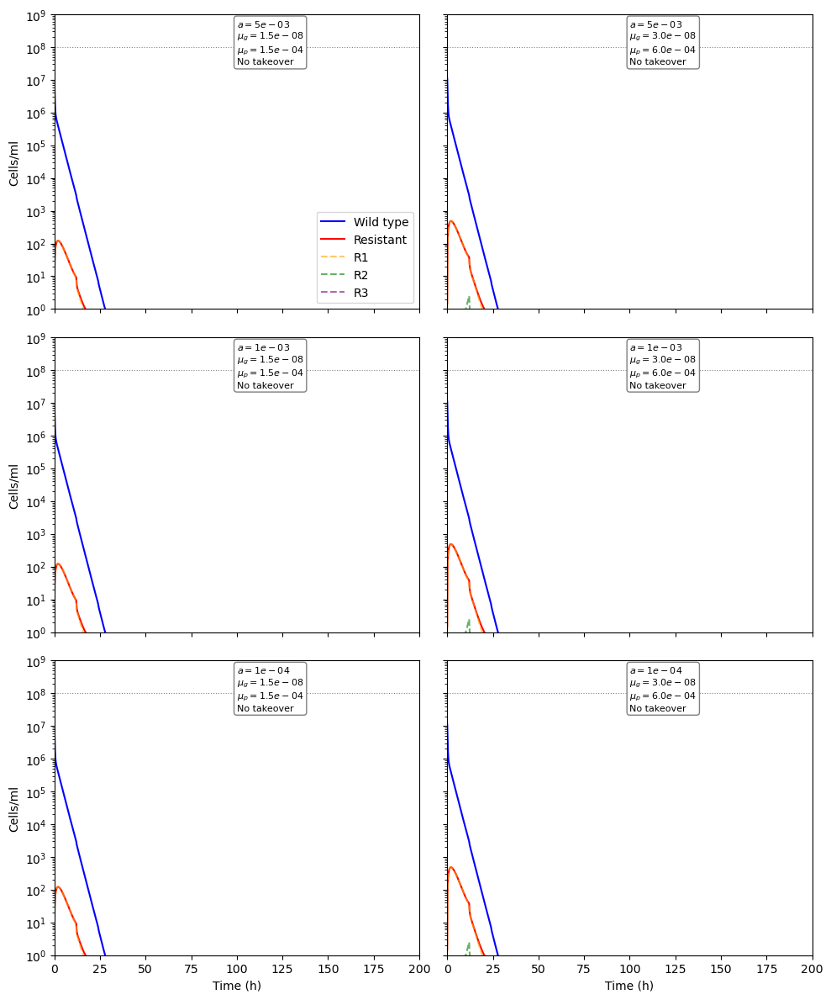

In [ ]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt

def drug(t, decayRate, doseInterval, aPeak):
    dose_times = np.arange(0, t + 1, doseInterval)
    return np.sum([aPeak * np.exp(-decayRate * (t - d)) for d in dose_times if d <= t])

def growthRate(a, mic, gMax, gMin, kappa):
    ratio = a / mic
    return gMax - (gMax - gMin) * (ratio**kappa / (ratio**kappa + 1))

def mutationRate(g, m, tau, h):
    return m * g + tau * m * np.exp(-h * g) if g > 0 else 0

def system(t, y, p):
    nw, pw, nr1, pr1, nr2, pr2, nr3, pr3, e = y
    total = nw + pw + nr1 + pr1 + nr2 + pr2 + nr3 + pr3
    a = drug(t, p['decayRate'], p['doseInterval'], p['aPeak'])
    aRate = p['aMax'] * total / p['c']
    b = p['b']

    gWt = growthRate(a, p['mic'][0], p['gMax'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR1 = growthRate(a, p['mic'][1], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR2 = growthRate(a, p['mic'][2], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR3 = growthRate(a, p['mic'][3], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])

    muW = mutationRate(gWt, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muR1 = mutationRate(gR1, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muR2 = mutationRate(gR2, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muP = p['muP'] if p['mutation'] else 0

    dNw = gWt * nw - aRate * nw + b * pw - muW * nw - p['jN'] * nw * e
    dPw = aRate * nw - b * pw - muP * pw - p['jP'] * pw * e
    dNr1 = gR1 * nr1 - aRate * nr1 + b * pr1 + muW * nw - muR1 * nr1 - p['jN'] * nr1 * e
    dPr1 = aRate * nr1 - b * pr1 - p['jP'] * pr1 * e
    dNr2 = gR2 * nr2 - aRate * nr2 + b * pr2 + muR1 * nr1 - muR2 * nr2 - p['jN'] * nr2 * e
    dPr2 = aRate * nr2 - b * pr2 - p['jP'] * pr2 * e
    dNr3 = gR3 * nr3 - aRate * nr3 + b * pr3 + muR2 * nr2 - p['jN'] * nr3 * e
    dPr3 = aRate * nr3 - b * pr3 - p['jP'] * pr3 * e
    dE = p['q'] * (p['emax'] - e) - p['l'] * e

    # Correct mutation logic: only forward mutations between persisters
    dPr1 += muP * pw
    dPr2 += muP * pr1
    dPr3 += muP * pr2

    return [dNw, dPw, dNr1, dPr1, dNr2, dPr2, dNr3, dPr3, dE]

# Parameters from the Supplement
baseParams = {
    'mic': [1, 4, 20, 50],
    'gMax': 1.0,
    'gMaxR': 0.95,  # slightly increased for better takeover in R3
    'gMin': -6.5,
    'kappa': 1,
    'c': 5e9,
    'b': 0.1,
    'tau': 2,
    'h': 5,
    'mutation': True,
    'aPeak': 25,
    'doseInterval': 12,
    'decayRate': np.log(2) / 2.5,
    'emax': 1e6,
    'l': 1e-3,
    'q': 3e-4,
    'jN': 5e-6,
    'jP': 5e-8
}

# Parameter sweeps
aVals = [5e-3, 1e-3, 1e-4]
mutationVals = [(1.5e-8, 1.5e-4), (3e-8, 6e-4)]

tSpan = (0, 200)
tEval = np.linspace(*tSpan, 1000)
y0 = [1e7, 1e6, 1, 0, 0, 0, 0, 0, 0]  # includes 1 initial resistant cell

fig, axs = plt.subplots(3, 2, figsize=(10, 12), sharex=True, sharey=True)
for i, aMax in enumerate(aVals):
    for j, (muG, muP) in enumerate(mutationVals):
        p = baseParams.copy()
        p['aMax'] = aMax
        p['m'] = muG
        p['muP'] = muP
        sol = solve_ivp(system, tSpan, y0, args=(p,), t_eval=tEval, method='BDF', atol=1e-12, rtol=1e-9)
        y = np.clip(sol.y, 1e-1, None)

        wt = y[0] + y[1]
        r1 = y[2] + y[3]
        r2 = y[4] + y[5]
        r3 = y[6] + y[7]
        rs = r1 + r2 + r3

        ax = axs[i, j]
        ax.plot(sol.t, wt, label='Wild type', color='blue')
        ax.plot(sol.t, rs, label='Resistant', color='red')
        ax.plot(sol.t, r1, '--', color='orange', alpha=0.6, label='R1' if i == 0 and j == 0 else None)
        ax.plot(sol.t, r2, '--', color='green', alpha=0.6, label='R2' if i == 0 and j == 0 else None)
        ax.plot(sol.t, r3, '--', color='purple', alpha=0.6, label='R3' if i == 0 and j == 0 else None)

        # Annotate resistance threshold
        ax.axhline(1e8, color='gray', linestyle=':', lw=0.8)

        # Annotate takeover
        if np.any(rs > 1e8):
            takeover_time = sol.t[np.argmax(rs > 1e8)]
            label_text = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nTakeover at {takeover_time:.0f}h'
        else:
            label_text = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nNo takeover'

        ax.text(0.5, 0.83, label_text, transform=ax.transAxes,
                bbox=dict(facecolor='white', edgecolor='gray', boxstyle='round'), fontsize=8)

        ax.set_yscale('log')
        ax.set_xlim(*tSpan)
        ax.set_ylim(1, 1e9)
        if i == 2:
            ax.set_xlabel('Time (h)')
        if j == 0:
            ax.set_ylabel('Cells/ml')
        if i == 0 and j == 0:
            ax.legend()

plt.tight_layout()
plt.show()


<>:135: SyntaxWarning: invalid escape sequence '\m'
<>:135: SyntaxWarning: invalid escape sequence '\m'
<>:137: SyntaxWarning: invalid escape sequence '\m'
<>:137: SyntaxWarning: invalid escape sequence '\m'
<>:135: SyntaxWarning: invalid escape sequence '\m'
<>:135: SyntaxWarning: invalid escape sequence '\m'
<>:137: SyntaxWarning: invalid escape sequence '\m'
<>:137: SyntaxWarning: invalid escape sequence '\m'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/4207864413.py:135: SyntaxWarning: invalid escape sequence '\m'
  label_text = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nTakeover at {takeover_time:.0f}h'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/4207864413.py:135: SyntaxWarning: invalid escape sequence '\m'
  label_text = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nTakeover at {takeover_time:.0f}h'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/4207864413.py:137: SyntaxWarning: invalid escape sequenc

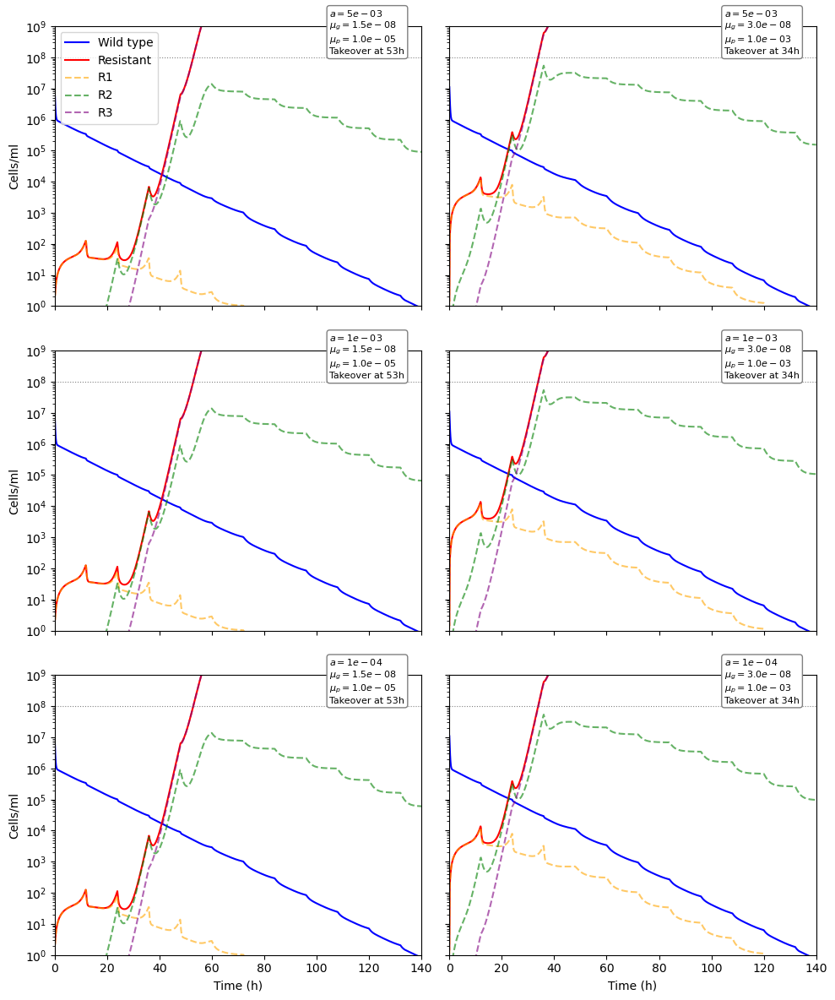

In [41]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt

def drug(t, decayRate, doseInterval, aPeak):
    dose_times = np.arange(0, t + 1, doseInterval)
    return np.sum([aPeak * np.exp(-decayRate * (t - d)) for d in dose_times if d <= t])

def growthRate(a, mic, gMax, gMin, kappa):
    ratio = a / mic
    return gMax - (gMax - gMin) * (ratio**kappa / (ratio**kappa + 1))

def mutationRate(g, m, tau, h):
    return m * g + tau * m * np.exp(-h * g) if g > 0 else 0

def system(t, y, p):
    nw, pw, nr1, pr1, nr2, pr2, nr3, pr3, e = y
    total = nw + pw + nr1 + pr1 + nr2 + pr2 + nr3 + pr3
    a = drug(t, p['decayRate'], p['doseInterval'], p['aPeak'])
    aRate = p['aMax'] * total / p['c']
    b = p['b']

    gWt = growthRate(a, p['mic'][0], p['gMax'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR1 = growthRate(a, p['mic'][1], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR2 = growthRate(a, p['mic'][2], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR3 = growthRate(a, p['mic'][3], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])

    muW = mutationRate(gWt, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muR1 = mutationRate(gR1, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muR2 = mutationRate(gR2, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muP = p['muP'] if p['mutation'] else 0

    # Wild type
    dNw = gWt * nw - aRate * nw - muW * nw - p['jN'] * nw * e
    dPw = aRate * nw - b * pw - muP * pw - p['jP'] * pw * e

    # Resistant 1
    dNr1 = gR1 * nr1 - aRate * nr1 - muR1 * nr1 - p['jN'] * nr1 * e
    dPr1 = aRate * nr1 - b * pr1 - p['jP'] * pr1 * e

    # Resistant 2
    dNr2 = gR2 * nr2 - aRate * nr2 - muR2 * nr2 - p['jN'] * nr2 * e
    dPr2 = aRate * nr2 - b * pr2 - p['jP'] * pr2 * e

    # Resistant 3
    dNr3 = gR3 * nr3 - aRate * nr3 - p['jN'] * nr3 * e
    dPr3 = aRate * nr3 - b * pr3 - p['jP'] * pr3 * e

    # Persister → next persister mutation flow
    dPr1 += muP * pw
    dPr2 += muP * pr1
    dPr3 += muP * pr2

    # Normal → resistant mutation flow
    dNr1 += muW * nw
    dNr2 += muR1 * nr1
    dNr3 += muR2 * nr2

    # Switching back from persisters to normals (critical fix!)
    dNw += b * pw
    dNr1 += b * pr1
    dNr2 += b * pr2
    dNr3 += b * pr3

    # Effector dynamics
    dE = p['q'] * (p['emax'] - e) - p['l'] * e

    return [dNw, dPw, dNr1, dPr1, dNr2, dPr2, dNr3, dPr3, dE]


# Parameters from the Supplement
baseParams = {
    'mic': [1, 4, 20, 50],
    'gMax': 1.0,
    'gMaxR': 0.95,  # slightly increased for better takeover in R3
    'gMin': -6.5,
    'kappa': 1.5,
    'c': 5e9,
    'b': 0.1,
    'tau': 10,
    'h': 5,
    'mutation': True,
    'aPeak': 25,
    'doseInterval': 12,
    'decayRate': np.log(2) / 2.5,
    'emax': 1e6,
    'l': 1e-3,
    'q': 3e-4,
    'jN': 5e-6,
    'jP': 5e-8
}
baseParams['aPeak'] = 10
# baseParams['mic'] = [1, 10, 40, 100]
# baseParams['gMin'] = -3.5


# Parameter sweeps
aVals = [5e-3, 1e-3, 1e-4]
mutationVals = (1.5e-8, 1e-5), (3e-8, 1e-3)


tSpan = (0, 140)
tEval = np.linspace(*tSpan, 1000)
y0 = [1e7, 1e6, 1, 0, 0, 0, 0, 0, 0]  # includes 1 initial resistant cell

fig, axs = plt.subplots(3, 2, figsize=(10, 12), sharex=True, sharey=True)
for i, aMax in enumerate(aVals):
    for j, (muG, muP) in enumerate(mutationVals):
        p = baseParams.copy()
        p['aMax'] = aMax
        p['m'] = muG
        p['muP'] = muP
        sol = solve_ivp(system, tSpan, y0, args=(p,), t_eval=tEval, method='BDF', atol=1e-12, rtol=1e-9)
        y = np.clip(sol.y, 1e-1, None)

        wt = y[0] + y[1]
        r1 = y[2] + y[3]
        r2 = y[4] + y[5]
        r3 = y[6] + y[7]
        rs = r1 + r2 + r3

        ax = axs[i, j]
        ax.plot(sol.t, wt, label='Wild type', color='blue')
        ax.plot(sol.t, rs, label='Resistant', color='red')
        ax.plot(sol.t, r1, '--', color='orange', alpha=0.6, label='R1' if i == 0 and j == 0 else None)
        ax.plot(sol.t, r2, '--', color='green', alpha=0.6, label='R2' if i == 0 and j == 0 else None)
        ax.plot(sol.t, r3, '--', color='purple', alpha=0.6, label='R3' if i == 0 and j == 0 else None)

        # Annotate resistance threshold
        ax.axhline(1e8, color='gray', linestyle=':', lw=0.8)

        # Annotate takeover
        if np.any(rs > 1e8):
            takeover_time = sol.t[np.argmax(rs > 1e8)]
            label_text = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nTakeover at {takeover_time:.0f}h'
        else:
            label_text = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nNo takeover'

        ax.text(0.75, 0.9, label_text, transform=ax.transAxes,
                bbox=dict(facecolor='white', edgecolor='gray', boxstyle='round'), fontsize=8)

        ax.set_yscale('log')
        ax.set_xlim(*tSpan)
        ax.set_ylim(1, 1e9)
        if i == 2:
            ax.set_xlabel('Time (h)')
        if j == 0:
            ax.set_ylabel('Cells/ml')
        if i == 0 and j == 0:
            ax.legend()

plt.tight_layout()
plt.show()


<>:138: SyntaxWarning: invalid escape sequence '\m'
<>:138: SyntaxWarning: invalid escape sequence '\m'
<>:140: SyntaxWarning: invalid escape sequence '\m'
<>:140: SyntaxWarning: invalid escape sequence '\m'
<>:138: SyntaxWarning: invalid escape sequence '\m'
<>:138: SyntaxWarning: invalid escape sequence '\m'
<>:140: SyntaxWarning: invalid escape sequence '\m'
<>:140: SyntaxWarning: invalid escape sequence '\m'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/3138655937.py:138: SyntaxWarning: invalid escape sequence '\m'
  label_text = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nTakeover at {takeover_time:.0f}h'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/3138655937.py:138: SyntaxWarning: invalid escape sequence '\m'
  label_text = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nTakeover at {takeover_time:.0f}h'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/3138655937.py:140: SyntaxWarning: invalid escape sequenc

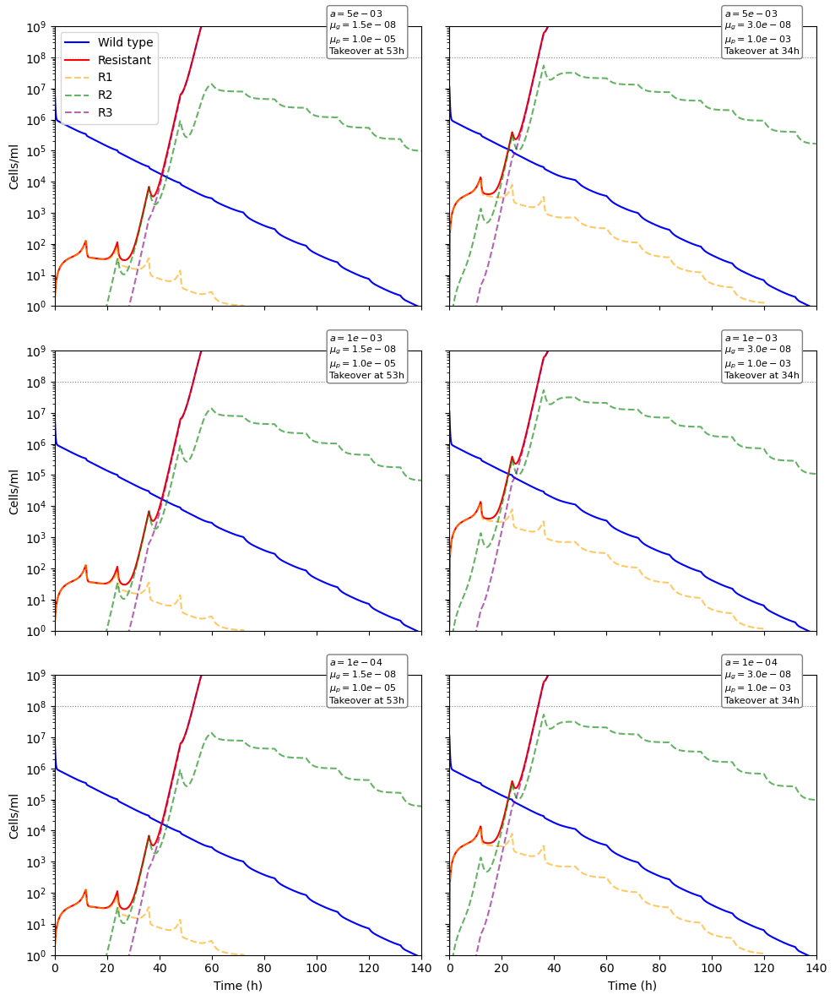

In [85]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt

def drug(t, decayRate, doseInterval, aPeak):
    dose_times = np.arange(0, t + 1, doseInterval)
    return np.sum([aPeak * np.exp(-decayRate * (t - d)) for d in dose_times if d <= t])

def growthRate(a, mic, gMax, gMin, kappa):
    ratio = a / mic
    return gMax - (gMax - gMin) * (ratio**kappa / (ratio**kappa + 1))

def mutationRate(g, m, tau, h):
    return m * g + tau * m * np.exp(-h * g) if g > 0 else 0

def system(t, y, p):
    nw, pw, nr1, pr1, nr2, pr2, nr3, pr3, e = y
    total = nw + pw + nr1 + pr1 + nr2 + pr2 + nr3 + pr3
    a = drug(t, p['decayRate'], p['doseInterval'], p['aPeak'])
    switching_k = 4
    switching_half = 0.2 * p['c']
    aRate = p['aMax'] * (total ** switching_k / (total ** switching_k + switching_half ** switching_k))

    b = p['b']

    gWt = growthRate(a, p['mic'][0], p['gMax'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR1 = growthRate(a, p['mic'][1], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR2 = growthRate(a, p['mic'][2], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR3 = growthRate(a, p['mic'][3], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])

    muW = mutationRate(gWt, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muR1 = mutationRate(gR1, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muR2 = mutationRate(gR2, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muP = p['muP'] if p['mutation'] else 0

    # Wild type
    dNw = gWt * nw - aRate * nw - muW * nw - p['jN'] * nw * e
    dPw = aRate * nw - b * pw - muP * pw - p['jP'] * pw * e

    # Resistant 1
    dNr1 = gR1 * nr1 - aRate * nr1 - muR1 * nr1 - p['jN'] * nr1 * e
    dPr1 = aRate * nr1 - b * pr1 - p['jP'] * pr1 * e

    # Resistant 2
    dNr2 = gR2 * nr2 - aRate * nr2 - muR2 * nr2 - p['jN'] * nr2 * e
    dPr2 = aRate * nr2 - b * pr2 - p['jP'] * pr2 * e

    # Resistant 3
    dNr3 = gR3 * nr3 - aRate * nr3 - p['jN'] * nr3 * e
    dPr3 = aRate * nr3 - b * pr3 - p['jP'] * pr3 * e

    # Persister → next persister mutation flow
    dPr1 += muP * pw
    dPr2 += muP * pr1
    dPr3 += muP * pr2

    # Normal → resistant mutation flow
    dNr1 += muW * nw
    dNr2 += muR1 * nr1
    dNr3 += muR2 * nr2

    # Switching back from persisters to normals (critical fix!)
    dNw += b * pw
    dNr1 += b * pr1
    dNr2 += b * pr2
    dNr3 += b * pr3

    # Effector dynamics
    dE = p['q'] * (p['emax'] - e) - p['l'] * e

    return [dNw, dPw, dNr1, dPr1, dNr2, dPr2, dNr3, dPr3, dE]


# Parameters from the Supplement
baseParams = {
    'mic': [1, 4, 20, 50],
    'gMax': 1.0,
    'gMaxR': 0.95,  # slightly increased for better takeover in R3
    'gMin': -6.5,
    'kappa': 1.5,
    'c': 5e9,
    'b': 0.1,
    'tau': 10,
    'h': 5,
    'mutation': True,
    'aPeak': 25,
    'doseInterval': 12,
    'decayRate': np.log(2) / 2.5,
    'emax': 1e6,
    'l': 1e-3,
    'q': 3e-4,
    'jN': 5e-6,
    'jP': 5e-8
}
baseParams['aPeak'] = 10
# baseParams['mic'] = [1, 10, 40, 100]
# baseParams['gMin'] = -3.5


# Parameter sweeps
aVals = [5e-3, 1e-3, 1e-4]
mutationVals = (1.5e-8, 1e-5), (3e-8, 1e-3)


tSpan = (0, 140)
tEval = np.linspace(*tSpan, 1000)
y0 = [1e7, 1e6, 1, 0, 0, 0, 0, 0, 0]  # includes 1 initial resistant cell

fig, axs = plt.subplots(3, 2, figsize=(10, 12), sharex=True, sharey=True)
for i, aMax in enumerate(aVals):
    for j, (muG, muP) in enumerate(mutationVals):
        p = baseParams.copy()
        p['aMax'] = aMax
        p['m'] = muG
        p['muP'] = muP
        sol = solve_ivp(system, tSpan, y0, args=(p,), t_eval=tEval, method='BDF', atol=1e-12, rtol=1e-9)
        y = np.clip(sol.y, 1e-1, None)

        wt = y[0] + y[1]
        r1 = y[2] + y[3]
        r2 = y[4] + y[5]
        r3 = y[6] + y[7]
        rs = r1 + r2 + r3

        ax = axs[i, j]
        ax.plot(sol.t, wt, label='Wild type', color='blue')
        ax.plot(sol.t, rs, label='Resistant', color='red')
        ax.plot(sol.t, r1, '--', color='orange', alpha=0.6, label='R1' if i == 0 and j == 0 else None)
        ax.plot(sol.t, r2, '--', color='green', alpha=0.6, label='R2' if i == 0 and j == 0 else None)
        ax.plot(sol.t, r3, '--', color='purple', alpha=0.6, label='R3' if i == 0 and j == 0 else None)

        # Annotate resistance threshold
        ax.axhline(1e8, color='gray', linestyle=':', lw=0.8)

        # Annotate takeover
        if np.any(rs > 1e8):
            takeover_time = sol.t[np.argmax(rs > 1e8)]
            label_text = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nTakeover at {takeover_time:.0f}h'
        else:
            label_text = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nNo takeover'

        ax.text(0.75, 0.9, label_text, transform=ax.transAxes,
                bbox=dict(facecolor='white', edgecolor='gray', boxstyle='round'), fontsize=8)

        ax.set_yscale('log')
        ax.set_xlim(*tSpan)
        ax.set_ylim(1, 1e9)
        if i == 2:
            ax.set_xlabel('Time (h)')
        if j == 0:
            ax.set_ylabel('Cells/ml')
        if i == 0 and j == 0:
            ax.legend()

plt.tight_layout()
plt.show()


fix init conditions

<>:132: SyntaxWarning: invalid escape sequence '\m'
<>:132: SyntaxWarning: invalid escape sequence '\m'
<>:134: SyntaxWarning: invalid escape sequence '\m'
<>:134: SyntaxWarning: invalid escape sequence '\m'
<>:132: SyntaxWarning: invalid escape sequence '\m'
<>:132: SyntaxWarning: invalid escape sequence '\m'
<>:134: SyntaxWarning: invalid escape sequence '\m'
<>:134: SyntaxWarning: invalid escape sequence '\m'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/3797628587.py:132: SyntaxWarning: invalid escape sequence '\m'
  label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nTakeover at {takeover_time:.0f}h'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/3797628587.py:132: SyntaxWarning: invalid escape sequence '\m'
  label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nTakeover at {takeover_time:.0f}h'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/3797628587.py:134: SyntaxWarning: invalid escape sequence '\m'
  l

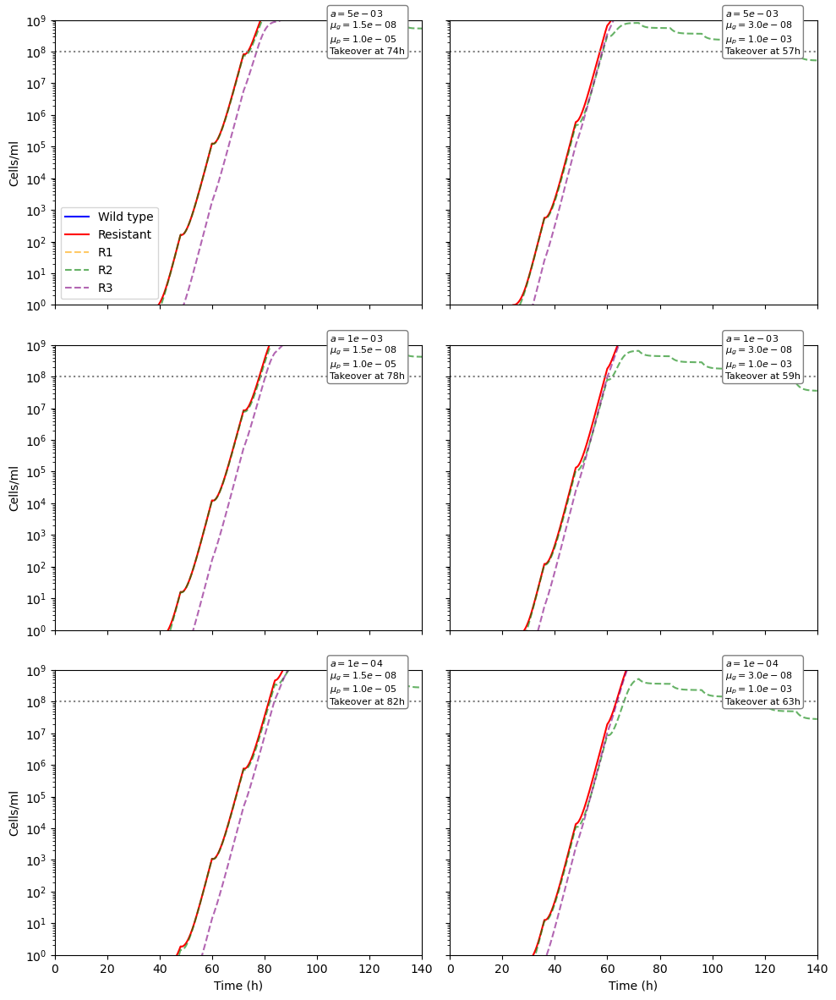

In [86]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt

def drug(t, decayRate, doseInterval, aPeak):
    dose_times = np.arange(0, t + 1, doseInterval)
    return np.sum([aPeak * np.exp(-decayRate * (t - d)) for d in dose_times if d <= t])

def growthRate(a, mic, gMax, gMin, kappa):
    ratio = a / mic
    return gMax - (gMax - gMin) * (ratio**kappa / (ratio**kappa + 1))

def mutationRate(g, m, tau, h):
    return m * g + tau * m * np.exp(-h * g) if g > 0 else 0

def system(t, y, p):
    nw, pw, nr1, pr1, nr2, pr2, nr3, pr3, e = y
    total = nw + pw + nr1 + pr1 + nr2 + pr2 + nr3 + pr3
    a = drug(t, p['decayRate'], p['doseInterval'], p['aPeak'])
    aRate = p['aMax']  # true per-cell rate
    dPw = aRate * nw
    b = p['b']

    gWt = growthRate(a, p['mic'][0], p['gMax'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR1 = growthRate(a, p['mic'][1], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR2 = growthRate(a, p['mic'][2], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR3 = growthRate(a, p['mic'][3], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])

    muW = mutationRate(gWt, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muR1 = mutationRate(gR1, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muR2 = mutationRate(gR2, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muP = p['muP'] if p['mutation'] else 0

    dNw = gWt * nw - aRate * nw - muW * nw - p['jN'] * nw * e
    dPw = aRate * nw - b * pw - muP * pw - p['jP'] * pw * e

    dNr1 = gR1 * nr1 - aRate * nr1 - muR1 * nr1 - p['jN'] * nr1 * e
    dPr1 = aRate * nr1 - b * pr1 - p['jP'] * pr1 * e

    dNr2 = gR2 * nr2 - aRate * nr2 - muR2 * nr2 - p['jN'] * nr2 * e
    dPr2 = aRate * nr2 - b * pr2 - p['jP'] * pr2 * e

    dNr3 = gR3 * nr3 - aRate * nr3 - p['jN'] * nr3 * e
    dPr3 = aRate * nr3 - b * pr3 - p['jP'] * pr3 * e

    dPr1 += muP * pw
    dPr2 += muP * pr1
    dPr3 += muP * pr2

    dNr1 += muW * nw
    dNr2 += muR1 * nr1
    dNr3 += muR2 * nr2

    dNw += b * pw
    dNr1 += b * pr1
    dNr2 += b * pr2
    dNr3 += b * pr3

    dE = p['q'] * (p['emax'] - e) - p['l'] * e

    return [dNw, dPw, dNr1, dPr1, dNr2, dPr2, dNr3, dPr3, dE]

# Base parameters
baseParams = {
    'mic': [1, 10, 40, 100],
    'gMax': 1.0,
    'gMaxR': 0.95,
    'gMin': -6.5,
    'kappa': 1.5,
    'c': 5e9,
    'b': 0.1,
    'tau': 100,
    'h': 5,
    'mutation': True,
    'aPeak': 10,
    'doseInterval': 12,
    'decayRate': np.log(2) / 2.5,
    'emax': 1e6,
    'l': 1e-3,
    'q': 3e-4,
    'jN': 5e-6,
    'jP': 5e-8
}

# Sweep ranges
aVals = [5e-3, 1e-3, 1e-4]
mutationVals = [(1.5e-8, 1e-5), (3e-8, 1e-3)]

# Timing
t_pre = (0, 100)
t_main = (0, 140)
tEval = np.linspace(*t_main, 1000)

# Initial conditions: WT + 1 R1 seed
y0_init = [1e7, 0, 1, 0, 0, 0, 0, 0, 0]

fig, axs = plt.subplots(3, 2, figsize=(10, 12), sharex=True, sharey=True)

for i, aMax in enumerate(aVals):
    for j, (muG, muP) in enumerate(mutationVals):
        p = baseParams.copy()
        p['aMax'] = aMax
        p['m'] = muG
        p['muP'] = muP

        # 1. Pre-equilibrate with mutation OFF
        p['mutation'] = False
        sol_pre = solve_ivp(system, t_pre, y0_init, args=(p,), method='BDF')
        y_ss = sol_pre.y[:, -1]

        # 2. Rerun with mutation ON
        p['mutation'] = True
        sol = solve_ivp(system, t_main, y_ss, args=(p,), t_eval=tEval, method='BDF', atol=1e-12, rtol=1e-9)
        y = np.clip(sol.y, 1e-1, None)

        wt = y[0] + y[1]
        r1 = y[2] + y[3]
        r2 = y[4] + y[5]
        r3 = y[6] + y[7]
        rs = r1 + r2 + r3

        ax = axs[i, j]
        ax.plot(sol.t, wt, label='Wild type', color='blue')
        ax.plot(sol.t, rs, label='Resistant', color='red')
        ax.plot(sol.t, r1, '--', color='orange', alpha=0.6, label='R1' if i == 0 and j == 0 else None)
        ax.plot(sol.t, r2, '--', color='green', alpha=0.6, label='R2' if i == 0 and j == 0 else None)
        ax.plot(sol.t, r3, '--', color='purple', alpha=0.6, label='R3' if i == 0 and j == 0 else None)
        ax.axhline(1e8, linestyle=':', color='gray')

        if np.any(rs > 1e8):
            takeover_time = sol.t[np.argmax(rs > 1e8)]
            label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nTakeover at {takeover_time:.0f}h'
        else:
            label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nNo takeover'

        ax.text(0.75, 0.88, label, transform=ax.transAxes,
                bbox=dict(facecolor='white', edgecolor='gray', boxstyle='round'), fontsize=8)

        ax.set_yscale('log')
        ax.set_xlim(*t_main)
        ax.set_ylim(1, 1e9)
        if i == 2:
            ax.set_xlabel('Time (h)')
        if j == 0:
            ax.set_ylabel('Cells/ml')
        if i == 0 and j == 0:
            ax.legend()

plt.tight_layout()
plt.show()


<>:135: SyntaxWarning: invalid escape sequence '\m'
<>:135: SyntaxWarning: invalid escape sequence '\m'
<>:137: SyntaxWarning: invalid escape sequence '\m'
<>:137: SyntaxWarning: invalid escape sequence '\m'
<>:135: SyntaxWarning: invalid escape sequence '\m'
<>:135: SyntaxWarning: invalid escape sequence '\m'
<>:137: SyntaxWarning: invalid escape sequence '\m'
<>:137: SyntaxWarning: invalid escape sequence '\m'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/492053066.py:135: SyntaxWarning: invalid escape sequence '\m'
  label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nTakeover at {takeover_time:.0f}h'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/492053066.py:135: SyntaxWarning: invalid escape sequence '\m'
  label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nTakeover at {takeover_time:.0f}h'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/492053066.py:137: SyntaxWarning: invalid escape sequence '\m'
  labe

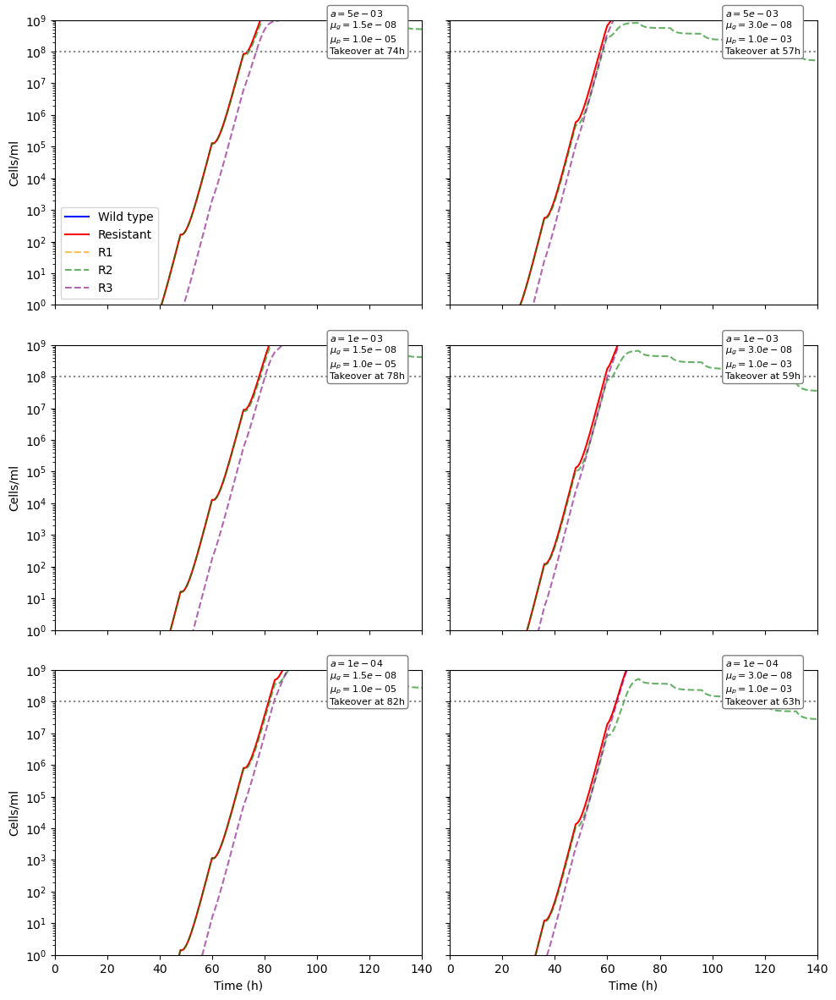

In [87]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt

def drug(t, decayRate, doseInterval, aPeak):
    dose_times = np.arange(0, t + 1, doseInterval)
    return np.sum([aPeak * np.exp(-decayRate * (t - d)) for d in dose_times if d <= t])

def growthRate(a, mic, gMax, gMin, kappa):
    ratio = a / mic
    return gMax - (gMax - gMin) * (ratio**kappa / (ratio**kappa + 1))

def mutationRate(g, m, tau, h):
    return m * g + tau * m * np.exp(-h * g) if g > 0 else 0

def system(t, y, p):
    nw, pw, nr1, pr1, nr2, pr2, nr3, pr3, e = y
    total = nw + pw + nr1 + pr1 + nr2 + pr2 + nr3 + pr3
    a = drug(t, p['decayRate'], p['doseInterval'], p['aPeak'])
    aRate = p['aMax']
    b = p['b']

    gWt = growthRate(a, p['mic'][0], p['gMax'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR1 = growthRate(a, p['mic'][1], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR2 = growthRate(a, p['mic'][2], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR3 = growthRate(a, p['mic'][3], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])

    muW = mutationRate(gWt, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muR1 = mutationRate(gR1, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muR2 = mutationRate(gR2, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muP = p['muP'] if p['mutation'] else 0

    dNw = gWt * nw - aRate * nw - muW * nw - p['jN'] * nw * e
    dPw = aRate * nw - b * pw - muP * pw - p['jP'] * pw * e

    dNr1 = gR1 * nr1 - aRate * nr1 - muR1 * nr1 - p['jN'] * nr1 * e
    dPr1 = aRate * nr1 - b * pr1 - p['jP'] * pr1 * e

    dNr2 = gR2 * nr2 - aRate * nr2 - muR2 * nr2 - p['jN'] * nr2 * e
    dPr2 = aRate * nr2 - b * pr2 - p['jP'] * pr2 * e

    dNr3 = gR3 * nr3 - aRate * nr3 - p['jN'] * nr3 * e
    dPr3 = aRate * nr3 - b * pr3 - p['jP'] * pr3 * e

    dPr1 += muP * pw
    dPr2 += muP * pr1
    dPr3 += muP * pr2
    
    dNr2 += muR1 * pr1
    dNr3 += muR2 * pr2

    dNr1 += muW * nw
    dNr2 += muR1 * nr1
    dNr3 += muR2 * nr2

    dNw += b * pw
    dNr1 += b * pr1
    dNr2 += b * pr2
    dNr3 += b * pr3

    dE = p['q'] * (p['emax'] - e) - p['l'] * e

    return [dNw, dPw, dNr1, dPr1, dNr2, dPr2, dNr3, dPr3, dE]

# Parameters
baseParams = {
    'mic': [1, 10, 40, 100],
    'gMax': 1.0,
    'gMaxR': 0.95,
    'gMin': -6.5,
    'kappa': 1.5,
    'c': 5e9,
    'b': 0.1,
    'tau': 100,
    'h': 5,
    'mutation': True,
    'aPeak': 10,
    'doseInterval': 12,
    'decayRate': np.log(2) / 2.5,
    'emax': 1e6,
    'l': 1e-3,
    'q': 3e-4,
    'jN': 5e-6,
    'jP': 5e-8
}

# Sweep ranges
aVals = [5e-3, 1e-3, 1e-4]
mutationVals = [(1.5e-8, 1e-5), (3e-8, 1e-3)]

# Timing
t_pre = (0, 100)
t_main = (0, 140)
tEval = np.linspace(*t_main, 1000)

# Initial conditions: WT + 1 R1 seed
y0_init = [1e7, 0, 1, 0, 0, 0, 0, 0, 0]

fig, axs = plt.subplots(3, 2, figsize=(10, 12), sharex=True, sharey=True)

for i, aMax in enumerate(aVals):
    for j, (muG, muP) in enumerate(mutationVals):
        p = baseParams.copy()
        p['aMax'] = aMax
        p['m'] = muG
        p['muP'] = muP

        # Pre-equilibration with mutation OFF
        p['mutation'] = False
        sol_pre = solve_ivp(system, t_pre, y0_init, args=(p,), method='BDF')
        y_ss = sol_pre.y[:, -1]

        # Rerun with mutation ON
        p['mutation'] = True
        sol = solve_ivp(system, t_main, y_ss, args=(p,), t_eval=tEval, method='BDF', atol=1e-12, rtol=1e-9)
        y = np.maximum(sol.y, 1e-3)  # or 1e-4 for even more detail

        wt = y[0] + y[1]
        r1 = y[2] + y[3]
        r2 = y[4] + y[5]
        r3 = y[6] + y[7]
        rs = r1 + r2 + r3

        ax = axs[i, j]
        ax.plot(sol.t, wt, label='Wild type', color='blue')  # PLOT WT FIRST
        ax.plot(sol.t, rs, label='Resistant', color='red')
        ax.plot(sol.t, r1, '--', color='orange', alpha=0.7, label='R1' if i == 0 and j == 0 else None)
        ax.plot(sol.t, r2, '--', color='green', alpha=0.6, label='R2' if i == 0 and j == 0 else None)
        ax.plot(sol.t, r3, '--', color='purple', alpha=0.6, label='R3' if i == 0 and j == 0 else None)
        ax.axhline(1e8, linestyle=':', color='gray')


        if np.any(rs > 1e8):
            takeover_time = sol.t[np.argmax(rs > 1e8)]
            label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nTakeover at {takeover_time:.0f}h'
        else:
            label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nNo takeover'

        ax.text(0.75, 0.88, label, transform=ax.transAxes,
                bbox=dict(facecolor='white', edgecolor='gray', boxstyle='round'), fontsize=8)

        ax.set_yscale('log')
        ax.set_xlim(*t_main)
        ax.set_ylim(1, 1e9)
        if i == 2:
            ax.set_xlabel('Time (h)')
        if j == 0:
            ax.set_ylabel('Cells/ml')
        if i == 0 and j == 0:
            ax.legend()

plt.tight_layout()
plt.show()


<>:133: SyntaxWarning: invalid escape sequence '\m'
<>:133: SyntaxWarning: invalid escape sequence '\m'
<>:135: SyntaxWarning: invalid escape sequence '\m'
<>:135: SyntaxWarning: invalid escape sequence '\m'
<>:133: SyntaxWarning: invalid escape sequence '\m'
<>:133: SyntaxWarning: invalid escape sequence '\m'
<>:135: SyntaxWarning: invalid escape sequence '\m'
<>:135: SyntaxWarning: invalid escape sequence '\m'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/3868582335.py:133: SyntaxWarning: invalid escape sequence '\m'
  label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nTakeover at {takeover_time:.0f}h'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/3868582335.py:133: SyntaxWarning: invalid escape sequence '\m'
  label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nTakeover at {takeover_time:.0f}h'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/3868582335.py:135: SyntaxWarning: invalid escape sequence '\m'
  l

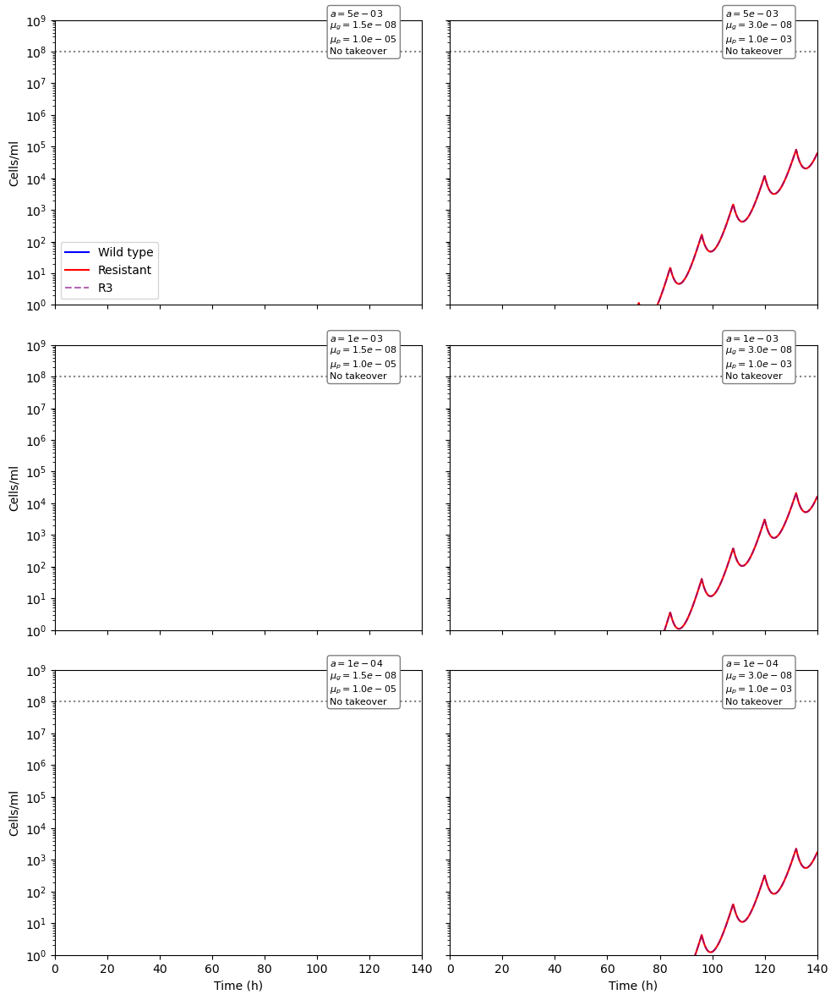

In [57]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt

def drug(t, decayRate, doseInterval, aPeak):
    dose_times = np.arange(0, t + 1, doseInterval)
    return np.sum([aPeak * np.exp(-decayRate * (t - d)) for d in dose_times if d <= t])

def growthRate(a, mic, gMax, gMin, kappa):
    ratio = a / mic
    return gMax - (gMax - gMin) * (ratio**kappa / (ratio**kappa + 1))

def mutationRate(g, m, tau, h):
    return m * g + tau * m * np.exp(-h * g) if g > 0 else 0

def system(t, y, p):
    nw, pw, nr1, pr1, nr2, pr2, nr3, pr3, e = y
    total = nw + pw + nr1 + pr1 + nr2 + pr2 + nr3 + pr3
    a = drug(t, p['decayRate'], p['doseInterval'], p['aPeak'])
    aRate = p['aMax']
    b = p['b']

    gWt = growthRate(a, p['mic'][0], p['gMax'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR1 = growthRate(a, p['mic'][1], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR2 = growthRate(a, p['mic'][2], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR3 = growthRate(a, p['mic'][3], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])

    muW = mutationRate(gWt, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muR1 = mutationRate(gR1, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muR2 = mutationRate(gR2, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muP = p['muP'] if p['mutation'] else 0

    dNw = gWt * nw - aRate * nw - muW * nw - p['jN'] * nw * e
    dPw = aRate * nw - b * pw - muP * pw - p['jP'] * pw * e

    dNr1 = gR1 * nr1 - aRate * nr1 - muR1 * nr1 - p['jN'] * nr1 * e
    dPr1 = aRate * nr1 - b * pr1 - p['jP'] * pr1 * e

    dNr2 = gR2 * nr2 - aRate * nr2 - muR2 * nr2 - p['jN'] * nr2 * e
    dPr2 = aRate * nr2 - b * pr2 - p['jP'] * pr2 * e

    dNr3 = gR3 * nr3 - aRate * nr3 - p['jN'] * nr3 * e
    dPr3 = aRate * nr3 - b * pr3 - p['jP'] * pr3 * e

    dPr1 += muP * pw
    dPr2 += muP * pr1
    dPr3 += muP * pr2
    
    dNr2 += muR1 * pr1
    dNr3 += muR2 * pr2

    dNr1 += muW * nw
    dNr2 += muR1 * nr1
    dNr3 += muR2 * nr2

    dNw += b * pw
    dNr1 += b * pr1
    dNr2 += b * pr2
    dNr3 += b * pr3

    dE = p['q'] * (p['emax'] - e) - p['l'] * e

    return [dNw, dPw, dNr1, dPr1, dNr2, dPr2, dNr3, dPr3, dE]

# Parameters
baseParams = {
    'mic': [1, 10, 40, 100],
    'gMax': 1.0,
    'gMaxR': 0.95,
    'gMin': -6.5,
    'kappa': 1.0,
    'c': 5e9,
    'b': 0.1,
    'tau': 2,
    'h': 5,
    'mutation': True,
    'aPeak': 25,
    'doseInterval': 12,
    'decayRate': np.log(2) / 2.5,
    'emax': 1e6,
    'l': 1e-3,
    'q': 3e-4,
    'jN': 5e-6,
    'jP': 5e-8
}

# Sweep ranges
aVals = [5e-3, 1e-3, 1e-4]
mutationVals = [(1.5e-8, 1e-5), (3e-8, 1e-3)]

# Timing
t_pre = (0, 100)
t_main = (0, 140)
tEval = np.linspace(*t_main, 1000)

# Initial conditions: WT + 1 R1 seed
y0_init = [1e7, 0, 1, 0, 0, 0, 0, 0, 0]

fig, axs = plt.subplots(3, 2, figsize=(10, 12), sharex=True, sharey=True)

for i, aMax in enumerate(aVals):
    for j, (muG, muP) in enumerate(mutationVals):
        p = baseParams.copy()
        p['aMax'] = aMax
        p['m'] = muG
        p['muP'] = muP

        # Pre-equilibration with mutation OFF
        p['mutation'] = False
        sol_pre = solve_ivp(system, t_pre, y0_init, args=(p,), method='BDF')
        y_ss = sol_pre.y[:, -1]

        # Rerun with mutation ON
        p['mutation'] = True
        sol = solve_ivp(system, t_main, y_ss, args=(p,), t_eval=tEval, method='BDF', atol=1e-12, rtol=1e-9)
        y = np.maximum(sol.y, 1e-3)  # or 1e-4 for even more detail

        wt = y[0] + y[1]
        r1 = y[2] + y[3]
        r2 = y[4] + y[5]
        r3 = y[6] + y[7]
        rs = r1 + r2 + r3

        ax = axs[i, j]
        ax.plot(sol.t, r1, linestyle='--', linewidth=1.5, color='orange', alpha=0.8)
        ax.plot(sol.t, wt, label='Wild type', color='blue')
        ax.plot(sol.t, rs, label='Resistant', color='red')
        ax.plot(sol.t, r3, '--', color='purple', alpha=0.6, label='R3' if i == 0 and j == 0 else None)
        ax.axhline(1e8, linestyle=':', color='gray')

        if np.any(rs > 1e8):
            takeover_time = sol.t[np.argmax(rs > 1e8)]
            label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nTakeover at {takeover_time:.0f}h'
        else:
            label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nNo takeover'

        ax.text(0.75, 0.88, label, transform=ax.transAxes,
                bbox=dict(facecolor='white', edgecolor='gray', boxstyle='round'), fontsize=8)

        ax.set_yscale('log')
        ax.set_xlim(*t_main)
        ax.set_ylim(1, 1e9)
        if i == 2:
            ax.set_xlabel('Time (h)')
        if j == 0:
            ax.set_ylabel('Cells/ml')
        if i == 0 and j == 0:
            ax.legend()

plt.tight_layout()
plt.show()


<>:146: SyntaxWarning: invalid escape sequence '\m'
<>:146: SyntaxWarning: invalid escape sequence '\m'
<>:148: SyntaxWarning: invalid escape sequence '\m'
<>:148: SyntaxWarning: invalid escape sequence '\m'
<>:146: SyntaxWarning: invalid escape sequence '\m'
<>:146: SyntaxWarning: invalid escape sequence '\m'
<>:148: SyntaxWarning: invalid escape sequence '\m'
<>:148: SyntaxWarning: invalid escape sequence '\m'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/137167743.py:146: SyntaxWarning: invalid escape sequence '\m'
  label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nTakeover at {takeover_time:.0f}h'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/137167743.py:146: SyntaxWarning: invalid escape sequence '\m'
  label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nTakeover at {takeover_time:.0f}h'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/137167743.py:148: SyntaxWarning: invalid escape sequence '\m'
  labe

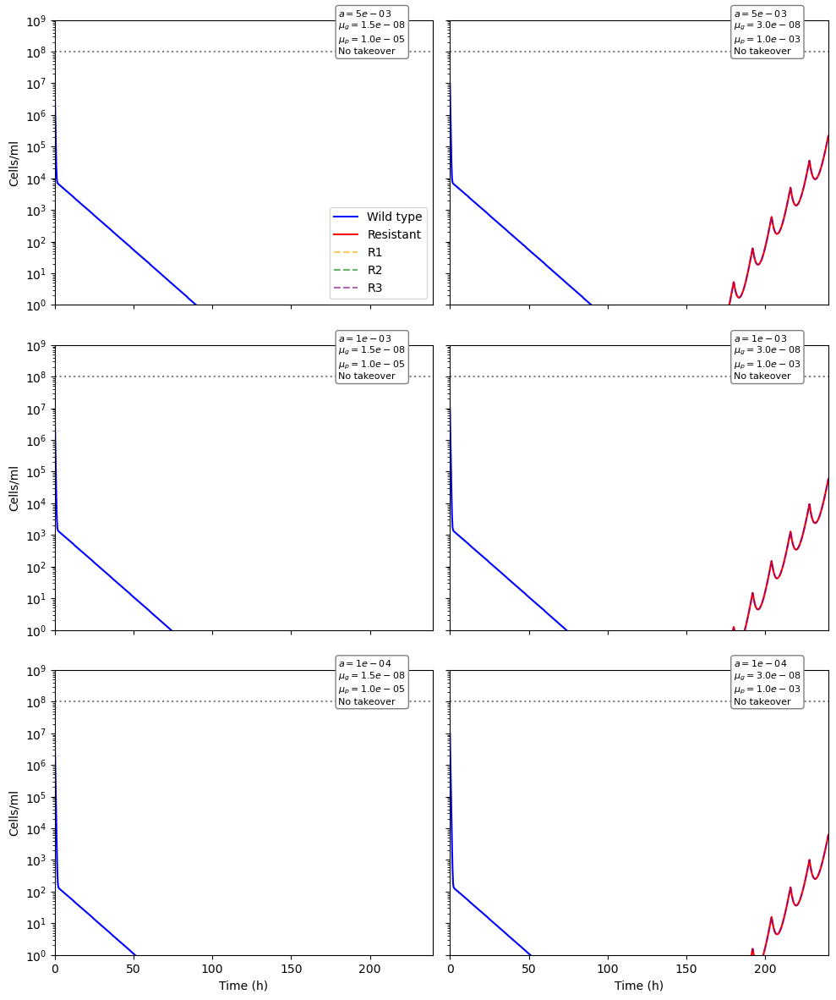

In [65]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt

def drug(t, decayRate, doseInterval, aPeak):
    dose_times = np.arange(0, t + 1, doseInterval)
    return np.sum([aPeak * np.exp(-decayRate * (t - d)) for d in dose_times if d <= t])

def growthRate(a, mic, gMax, gMin, kappa):
    ratio = a / mic
    return gMax - (gMax - gMin) * (ratio**kappa / (ratio**kappa + 1))

def mutationRate(g, m, tau, h):
    return m * g + tau * m * np.exp(-h * g) if g > 0 else 0

def system(t, y, p):
    nw, pw, nr1, pr1, nr2, pr2, nr3, pr3, e = y
    total = nw + pw + nr1 + pr1 + nr2 + pr2 + nr3 + pr3
    a = drug(t, p['decayRate'], p['doseInterval'], p['aPeak'])
    aRate = p['aMax']
    b = p['b']

    gWt = growthRate(a, p['mic'][0], p['gMax'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR1 = growthRate(a, p['mic'][1], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR2 = growthRate(a, p['mic'][2], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR3 = growthRate(a, p['mic'][3], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])

    muW = mutationRate(gWt, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muR1 = mutationRate(gR1, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muR2 = mutationRate(gR2, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muP = p['muP'] if p['mutation'] else 0

    dNw = gWt * nw - aRate * nw - muW * nw - p['jN'] * nw * e
    dPw = aRate * nw - b * pw - muP * pw - p['jP'] * pw * e

    dNr1 = gR1 * nr1 - aRate * nr1 - muR1 * nr1 - p['jN'] * nr1 * e
    dPr1 = aRate * nr1 - b * pr1 - p['jP'] * pr1 * e

    dNr2 = gR2 * nr2 - aRate * nr2 - muR2 * nr2 - p['jN'] * nr2 * e
    dPr2 = aRate * nr2 - b * pr2 - p['jP'] * pr2 * e

    dNr3 = gR3 * nr3 - aRate * nr3 - p['jN'] * nr3 * e
    dPr3 = aRate * nr3 - b * pr3 - p['jP'] * pr3 * e

    # Mutation from persisters
    dPr1 += muP * pw
    dPr2 += muP * pr1
    dPr3 += muP * pr2
    dNr2 += muR1 * pr1
    dNr3 += muR2 * pr2

    # Mutation from normal states
    dNr1 += muW * nw
    dNr2 += muR1 * nr1
    dNr3 += muR2 * nr2

    # Return from persister
    dNw += b * pw
    dNr1 += b * pr1
    dNr2 += b * pr2
    dNr3 += b * pr3

    # Immune effector dynamics
    dE = p['q'] * (p['emax'] - e) - p['l'] * e

    return [dNw, dPw, dNr1, dPr1, dNr2, dPr2, dNr3, dPr3, dE]

# Parameters
baseParams = {
    'mic': [1, 10, 40, 100],
    'gMax': 1.0,
    'gMaxR': 0.95,
    'gMin': -6.5,
    'kappa': 1.0,
    'c': 5e9,
    'b': 0.1,
    'tau': 2,
    'h': 5,
    'mutation': True,
    'aPeak': 25,
    'doseInterval': 12,
    'decayRate': np.log(2) / 2.5,
    'emax': 1e6,
    'l': 1e-3,
    'q': 3e-4,
    'jN': 5e-6,
    'jP': 5e-8
}

# Parameter sweep
aVals = [5e-3, 1e-3, 1e-4]
mutationVals = [(1.5e-8, 1e-5), (3e-8, 1e-3)]

# Time spans and plotting grid
t_pre_span = (0, 100)
t_main_span = (0, 140)

fig, axs = plt.subplots(3, 2, figsize=(10, 12), sharex=True, sharey=True)
y0_init = [1e7, 0, 1, 0, 0, 0, 0, 0, 0]

for i, aMax in enumerate(aVals):
    for j, (muG, muP) in enumerate(mutationVals):
        p = baseParams.copy()
        p['aMax'] = aMax
        p['m'] = muG
        p['muP'] = muP

        # Burn-in (no mutation)
        p['mutation'] = False
        t_pre_eval = np.linspace(*t_pre_span, 300)
        sol_pre = solve_ivp(system, t_pre_span, y0_init, t_eval=t_pre_eval, args=(p,), method='BDF')
        y_pre = sol_pre.y
        t_pre_values = sol_pre.t

        # Main simulation (mutation on) — offset to start after 100h
        p['mutation'] = True
        main_start = t_pre_span[1]
        main_end = main_start + t_main_span[1]
        t_main_eval = np.linspace(main_start, main_end, 700)
        sol_main = solve_ivp(system, (main_start, main_end), y_pre[:, -1], t_eval=t_main_eval, args=(p,), method='BDF', atol=1e-12, rtol=1e-9)
        y_main = sol_main.y
        t_main_values = sol_main.t


        # Combine time + state
        y_all = np.concatenate([y_pre, y_main], axis=1)
        t_all = np.concatenate([t_pre_values, t_main_values])
        y_all = np.maximum(y_all, 1e-3)

        wt = y_all[0] + y_all[1]
        r1 = y_all[2] + y_all[3]
        r2 = y_all[4] + y_all[5]
        r3 = y_all[6] + y_all[7]
        rs = r1 + r2 + r3

        ax = axs[i, j]
        ax.plot(t_all, wt, label='Wild type', color='blue')
        ax.plot(t_all, rs, label='Resistant', color='red')
        ax.plot(t_all, r1, '--', color='orange', alpha=0.6, label='R1' if i == 0 and j == 0 else None)
        ax.plot(t_all, r2, '--', color='green', alpha=0.6, label='R2' if i == 0 and j == 0 else None)
        ax.plot(t_all, r3, '--', color='purple', alpha=0.6, label='R3' if i == 0 and j == 0 else None)
        ax.axhline(1e8, linestyle=':', color='gray')

        if np.any(rs > 1e8):
            takeover_time = t_all[np.argmax(rs > 1e8)]
            label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nTakeover at {takeover_time:.0f}h'
        else:
            label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nNo takeover'

        ax.text(0.75, 0.88, label, transform=ax.transAxes,
                bbox=dict(facecolor='white', edgecolor='gray', boxstyle='round'), fontsize=8)

        ax.set_yscale('log')
        ax.set_xlim(0, t_all[-1])
        ax.set_ylim(1, 1e9)
        if i == 2:
            ax.set_xlabel('Time (h)')
        if j == 0:
            ax.set_ylabel('Cells/ml')
        if i == 0 and j == 0:
            ax.legend()

plt.tight_layout()
plt.show()


<>:139: SyntaxWarning: invalid escape sequence '\m'
<>:139: SyntaxWarning: invalid escape sequence '\m'
<>:141: SyntaxWarning: invalid escape sequence '\m'
<>:141: SyntaxWarning: invalid escape sequence '\m'
<>:139: SyntaxWarning: invalid escape sequence '\m'
<>:139: SyntaxWarning: invalid escape sequence '\m'
<>:141: SyntaxWarning: invalid escape sequence '\m'
<>:141: SyntaxWarning: invalid escape sequence '\m'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/2612834018.py:139: SyntaxWarning: invalid escape sequence '\m'
  label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nTakeover at {takeover_time:.0f}h'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/2612834018.py:139: SyntaxWarning: invalid escape sequence '\m'
  label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nTakeover at {takeover_time:.0f}h'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/2612834018.py:141: SyntaxWarning: invalid escape sequence '\m'
  l

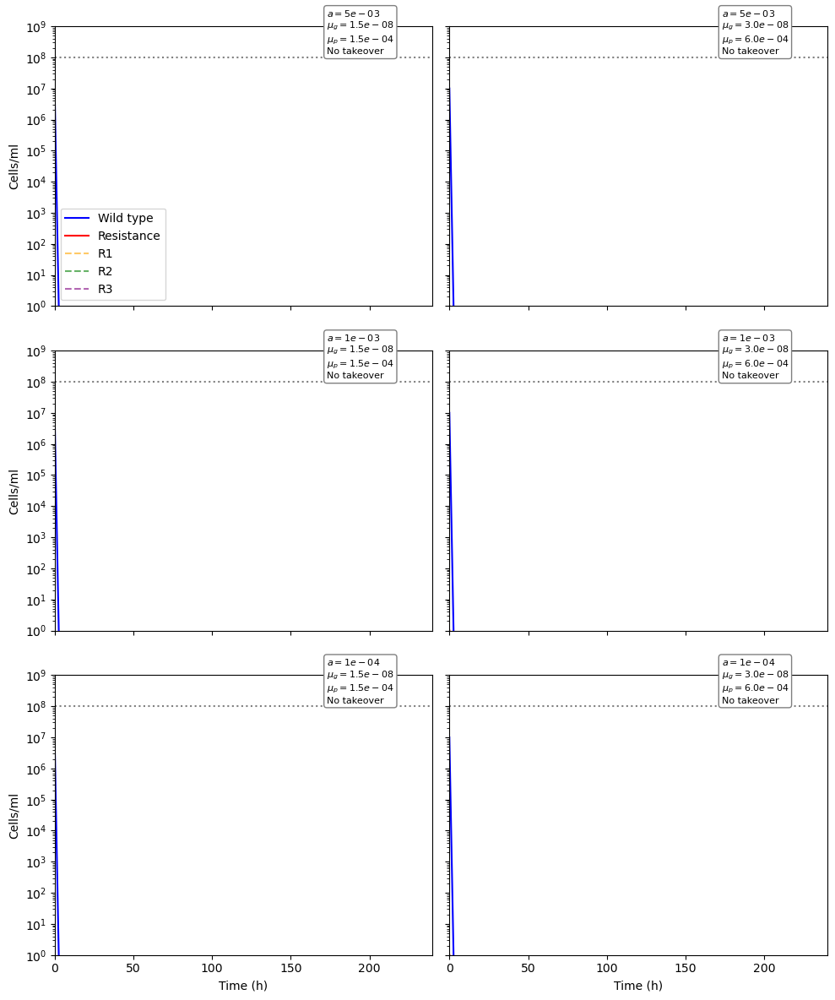

In [69]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt

def drug(t, decayRate, doseInterval, aPeak):
    dose_times = np.arange(0, t + 1, doseInterval)
    return np.sum([aPeak * np.exp(-decayRate * (t - d)) for d in dose_times if d <= t])

def growthRate(a, mic, gMax, gMin, kappa):
    ratio = a / mic
    return gMax - (gMax - gMin) * (ratio**kappa / (ratio**kappa + 1))

def mutationRate(g, m, tau, h):
    return m * g + tau * m * np.exp(-h * g) if g > 0 else 0

def system(t, y, p):
    nw, pw, nr1, pr1, nr2, pr2, nr3, pr3, e = y
    total = nw + pw + nr1 + pr1 + nr2 + pr2 + nr3 + pr3
    a = drug(t, p['decayRate'], p['doseInterval'], p['aPeak'])
    b = p['b']

    # Growth rates
    gWt = growthRate(a, p['mic'][0], p['gMax'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR1 = growthRate(a, p['mic'][1], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR2 = growthRate(a, p['mic'][2], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR3 = growthRate(a, p['mic'][3], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])

    muW = mutationRate(gWt, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muR1 = mutationRate(gR1, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muR2 = mutationRate(gR2, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muP = p['muP'] if p['mutation'] else 0

    # Dynamics
    dNw = gWt * nw - muW * nw - p['jN'] * nw * e
    dPw = - b * pw - muP * pw - p['jP'] * pw * e

    dNr1 = gR1 * nr1 - muR1 * nr1 - p['jN'] * nr1 * e
    dPr1 = - b * pr1 - p['jP'] * pr1 * e

    dNr2 = gR2 * nr2 - muR2 * nr2 - p['jN'] * nr2 * e
    dPr2 = - b * pr2 - p['jP'] * pr2 * e

    dNr3 = gR3 * nr3 - p['jN'] * nr3 * e
    dPr3 = - b * pr3 - p['jP'] * pr3 * e

    # Mutation: persisters
    dPr1 += muP * pw
    dPr2 += muP * pr1
    dPr3 += muP * pr2
    dNr2 += muR1 * pr1
    dNr3 += muR2 * pr2

    # Mutation: normal states
    dNr1 += muW * nw
    dNr2 += muR1 * nr1
    dNr3 += muR2 * nr2

    # Return from persister
    dNw += b * pw
    dNr1 += b * pr1
    dNr2 += b * pr2
    dNr3 += b * pr3

    # Effector dynamics
    dE = p['q'] * (p['emax'] - e) - p['l'] * e

    return [dNw, dPw, dNr1, dPr1, dNr2, dPr2, dNr3, dPr3, dE]

# Parameters
baseParams = {
    'mic': [1, 4, 20, 50],
    'gMax': 1.0,
    'gMaxR': 0.95,
    'gMin': -6.5,
    'kappa': 1.0,
    'c': 5e9,
    'b': 0.1,
    'tau': 2,
    'h': 5,
    'aPeak': 25,
    'doseInterval': 24,
    'decayRate': np.log(2) / 2.5,
    'emax': 1e6,
    'l': 1e-3,
    'q': 3e-4,
    'jN': 5e-6,
    'jP': 5e-8
}

aVals = [5e-3, 1e-3, 1e-4]
mutationVals = [(1.5e-8, 1.5e-4), (3e-8, 6e-4)]  # Match paper's grid

t_pre_span = (0, 100)
t_main_span = (0, 140)

fig, axs = plt.subplots(3, 2, figsize=(10, 12), sharex=True, sharey=True)
y0_init = [1e7, 0, 1, 0, 0, 0, 0, 0, 0]

for i, aMax in enumerate(aVals):
    for j, (muG, muP) in enumerate(mutationVals):
        p = baseParams.copy()
        p['aMax'] = aMax
        p['m'] = muG
        p['muP'] = muP
        p['mutation'] = False

        t_pre_eval = np.linspace(*t_pre_span, 300)
        sol_pre = solve_ivp(system, t_pre_span, y0_init, t_eval=t_pre_eval, args=(p,), method='BDF')
        y_pre = sol_pre.y
        t_pre_values = sol_pre.t

        p['mutation'] = True
        main_start = t_pre_span[1]
        t_main_eval = np.linspace(main_start, main_start + t_main_span[1], 700)
        sol_main = solve_ivp(system, (main_start, main_start + t_main_span[1]), y_pre[:, -1],
                             t_eval=t_main_eval, args=(p,), method='BDF', atol=1e-12, rtol=1e-9)
        y_main = sol_main.y
        t_main_values = sol_main.t

        y_all = np.concatenate([y_pre, y_main], axis=1)
        t_all = np.concatenate([t_pre_values, t_main_values])
        y_all = np.maximum(y_all, 1e-3)

        wt = y_all[0] + y_all[1]
        r1 = y_all[2] + y_all[3]
        r2 = y_all[4] + y_all[5]
        r3 = y_all[6] + y_all[7]

        ax = axs[i, j]
        ax.plot(t_all, wt, label='Wild type', color='blue')
        ax.plot(t_all, r1+r2+r3, label='Resistance', color='red')
        ax.plot(t_all, r1, '--', color='orange', alpha=0.6, label='R1' if i == 0 and j == 0 else None)
        ax.plot(t_all, r2, '--', color='green', alpha=0.6, label='R2' if i == 0 and j == 0 else None)
        ax.plot(t_all, r3, '--', color='purple', alpha=0.6, label='R3' if i == 0 and j == 0 else None)

        ax.axhline(1e8, linestyle=':', color='gray')
        if np.any(r1+r2+r3 > 1e8):
            takeover_time = t_all[np.argmax(r3 > 1e8)]
            label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nTakeover at {takeover_time:.0f}h'
        else:
            label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nNo takeover'

        ax.text(0.72, 0.9, label, transform=ax.transAxes,
                bbox=dict(facecolor='white', edgecolor='gray', boxstyle='round'), fontsize=8)

        ax.set_yscale('log')
        ax.set_xlim(0, 240)
        ax.set_ylim(1, 1e9)
        if i == 2:
            ax.set_xlabel('Time (h)')
        if j == 0:
            ax.set_ylabel('Cells/ml')
        if i == 0 and j == 0:
            ax.legend()

plt.tight_layout()
plt.show()


<>:147: SyntaxWarning: invalid escape sequence '\m'
<>:147: SyntaxWarning: invalid escape sequence '\m'
<>:149: SyntaxWarning: invalid escape sequence '\m'
<>:149: SyntaxWarning: invalid escape sequence '\m'
<>:147: SyntaxWarning: invalid escape sequence '\m'
<>:147: SyntaxWarning: invalid escape sequence '\m'
<>:149: SyntaxWarning: invalid escape sequence '\m'
<>:149: SyntaxWarning: invalid escape sequence '\m'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/926810454.py:147: SyntaxWarning: invalid escape sequence '\m'
  label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nTakeover at {takeover_time:.0f}h'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/926810454.py:147: SyntaxWarning: invalid escape sequence '\m'
  label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nTakeover at {takeover_time:.0f}h'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/926810454.py:149: SyntaxWarning: invalid escape sequence '\m'
  labe

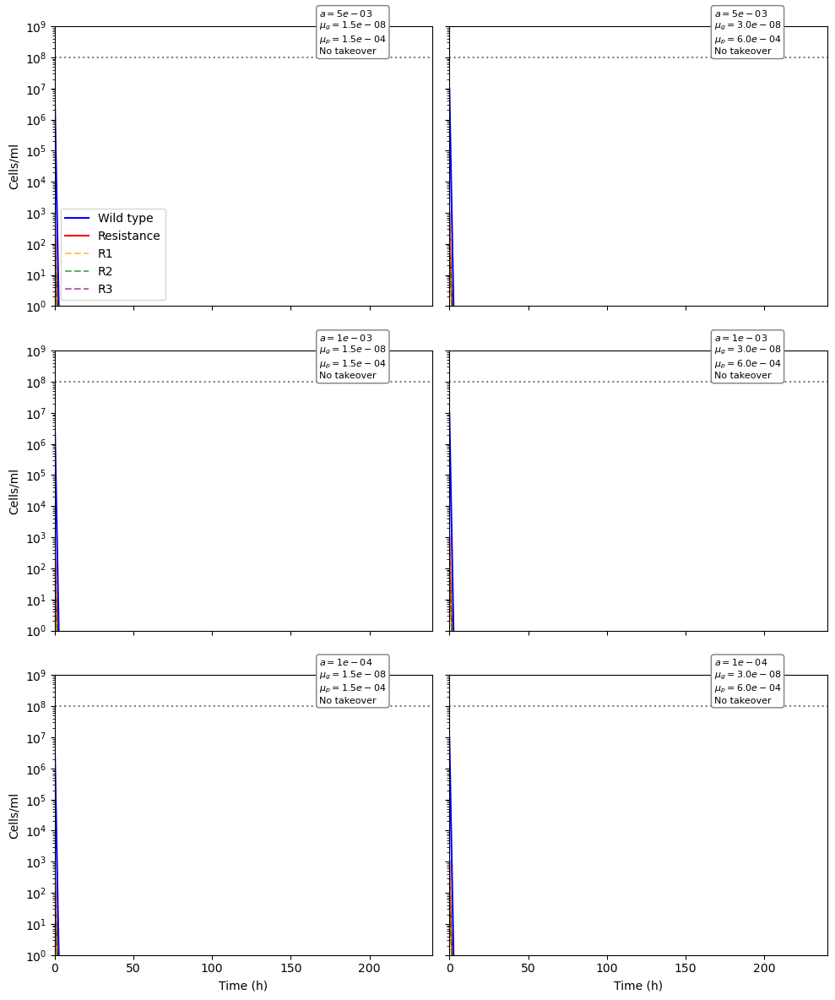

In [83]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt

# Drug concentration over time with decay
def drug(t, decayRate, doseInterval, aPeak):
    dose_times = np.arange(0, t + 1, doseInterval)
    return np.sum([aPeak * np.exp(-decayRate * (t - d)) for d in dose_times if d <= t])

# Hill-like growth rate suppression function
def growthRate(a, mic, gMax, gMin, kappa):
    ratio = a / mic
    g = gMax - (gMax - gMin) * (ratio ** kappa / (ratio ** kappa + 1))
    return max(g, gMin)

# Mutation rate from normal growth or stressed condition
def mutation_rate(g, m, tau, h):
    return m * g + tau * m * np.exp(-h * g) if g > 0 else 0

# Core ODE system
def system(t, y, p):
    nw, pw, nr1, pr1, nr2, pr2, nr3, pr3, e = y
    total = nw + pw + nr1 + pr1 + nr2 + pr2 + nr3 + pr3
    a = drug(t, p['decayRate'], p['doseInterval'], p['aPeak'])
    b = p['b']

    # Growth terms
    gWt = growth_rate(a, p['mic'][0], p['gMax'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR1 = growth_rate(a, p['mic'][1], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR2 = growth_rate(a, p['mic'][2], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR3 = growth_rate(a, p['mic'][3], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])

    # Mutation terms
    muW = mutation_rate(gWt, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muR1 = mutation_rate(gR1, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muR2 = mutation_rate(gR2, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muP = p['muP'] if p['mutation'] else 0

    # ODEs
    dNw = gWt * nw - muW * nw - p['jN'] * nw * e
    dPw = -b * pw - muP * pw - p['jP'] * pw * e

    dNr1 = gR1 * nr1 - muR1 * nr1 - p['jN'] * nr1 * e
    dPr1 = -b * pr1 - p['jP'] * pr1 * e

    dNr2 = gR2 * nr2 - muR2 * nr2 - p['jN'] * nr2 * e
    dPr2 = -b * pr2 - p['jP'] * pr2 * e

    dNr3 = gR3 * nr3 - p['jN'] * nr3 * e
    dPr3 = -b * pr3 - p['jP'] * pr3 * e

    # Mutation flows
    dPr1 += muP * pw
    dPr2 += muP * pr1
    dPr3 += muP * pr2
    dNr2 += muR1 * pr1
    dNr3 += muR2 * pr2

    dNr1 += muW * nw
    dNr2 += muR1 * nr1
    dNr3 += muR2 * nr2

    # Back conversion from persisters
    dNw += b * pw
    dNr1 += b * pr1
    dNr2 += b * pr2
    dNr3 += b * pr3

    # Immune effector
    dE = p['q'] * (p['emax'] - e) - p['l'] * e

    return [dNw, dPw, dNr1, dPr1, dNr2, dPr2, dNr3, dPr3, dE]

# --- Parameters ---
baseParams = {
    'mic': [1, 4, 20, 50],
    'gMax': 1.0,
    'gMaxR': 0.95,
    'gMin': -6.5,
    'kappa': 1.0,
    'c': 5e9,
    'b': 0.1,
    'tau': 2,
    'h': 5,
    'aPeak': 25,
    'doseInterval': 12,
    'decayRate': np.log(2) / 2.5,
    'emax': 1e6,
    'l': 1e-3,
    'q': 3e-4,
    'jN': 5e-6,
    'jP': 5e-8
}

aVals = [5e-3, 1e-3, 1e-4]
mutationVals = [(1.5e-8, 1.5e-4), (3e-8, 6e-4)]

t_pre_span = (0, 100)
t_main_span = (0, 140)

# --- Plotting setup ---
fig, axs = plt.subplots(3, 2, figsize=(10, 12), sharex=True, sharey=True)

# Initial condition: seed WT and small R1, R2
y0_init = [1e7, 0, 1e3, 0, 1e2, 0, 0, 0, 0]

for i, aMax in enumerate(aVals):
    for j, (muG, muP) in enumerate(mutationVals):
        p = baseParams.copy()
        p['aMax'] = aMax
        p['m'] = muG
        p['muP'] = muP
        p['mutation'] = False

        t_pre_eval = np.linspace(*t_pre_span, 300)
        sol_pre = solve_ivp(system, t_pre_span, y0_init, t_eval=t_pre_eval, args=(p,), method='BDF')
        y_pre, t_pre = sol_pre.y, sol_pre.t

        p['mutation'] = True
        main_start = t_pre_span[1]
        t_main_eval = np.linspace(main_start, main_start + t_main_span[1], 700)
        sol_main = solve_ivp(system, (main_start, main_start + t_main_span[1]), y_pre[:, -1],
                             t_eval=t_main_eval, args=(p,), method='BDF', atol=1e-12, rtol=1e-9)
        y_main, t_main = sol_main.y, sol_main.t

        y_all = np.concatenate([y_pre, y_main], axis=1)
        t_all = np.concatenate([t_pre, t_main])
        y_all = np.maximum(y_all, 1e-3)

        # Plotting
        wt = y_all[0] + y_all[1]
        r1 = y_all[2] + y_all[3]
        r2 = y_all[4] + y_all[5]
        r3 = y_all[6] + y_all[7]
        rs = r1 + r2 + r3

        ax = axs[i, j]
        ax.plot(t_all, wt, color='blue', label='Wild type')
        ax.plot(t_all, rs, color='red', label='Resistance')
        ax.plot(t_all, r1, '--', color='orange', alpha=0.6, label='R1' if i == 0 and j == 0 else None)
        ax.plot(t_all, r2, '--', color='green', alpha=0.6, label='R2' if i == 0 and j == 0 else None)
        ax.plot(t_all, r3, '--', color='purple', alpha=0.6, label='R3' if i == 0 and j == 0 else None)

        ax.axhline(1e8, linestyle=':', color='gray')
        if np.any(rs > 1e8):
            takeover_time = t_all[np.argmax(rs > 1e8)]
            label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nTakeover at {takeover_time:.0f}h'
        else:
            label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nNo takeover'

        ax.text(0.70, 0.9, label, transform=ax.transAxes,
                bbox=dict(facecolor='white', edgecolor='gray', boxstyle='round'), fontsize=8)

        ax.set_yscale('log')
        ax.set_xlim(0, 240)
        ax.set_ylim(1, 1e9)
        if i == 2: ax.set_xlabel('Time (h)')
        if j == 0: ax.set_ylabel('Cells/ml')
        if i == 0 and j == 0: ax.legend()

plt.tight_layout()
plt.show()


from sams

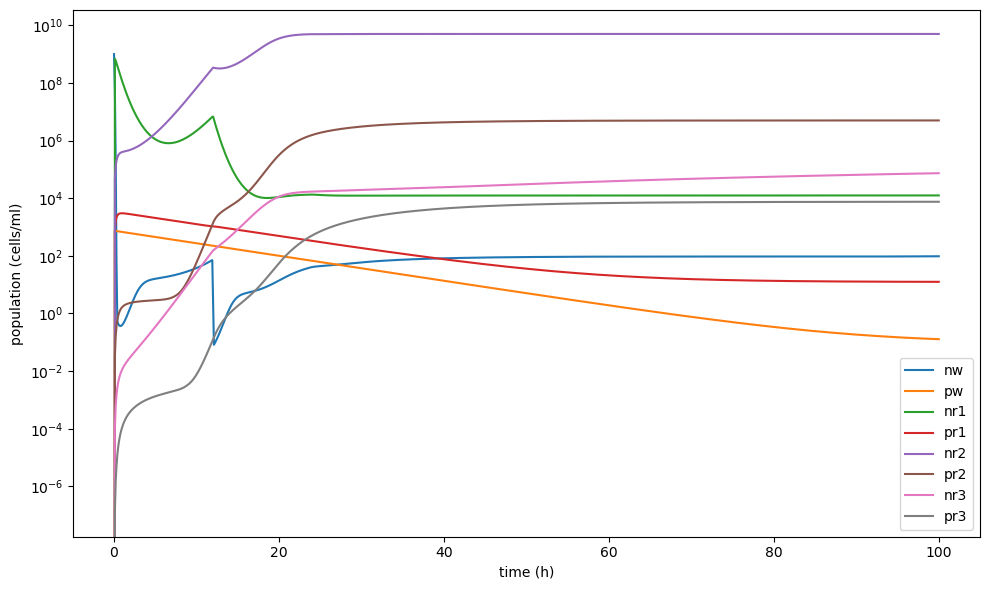

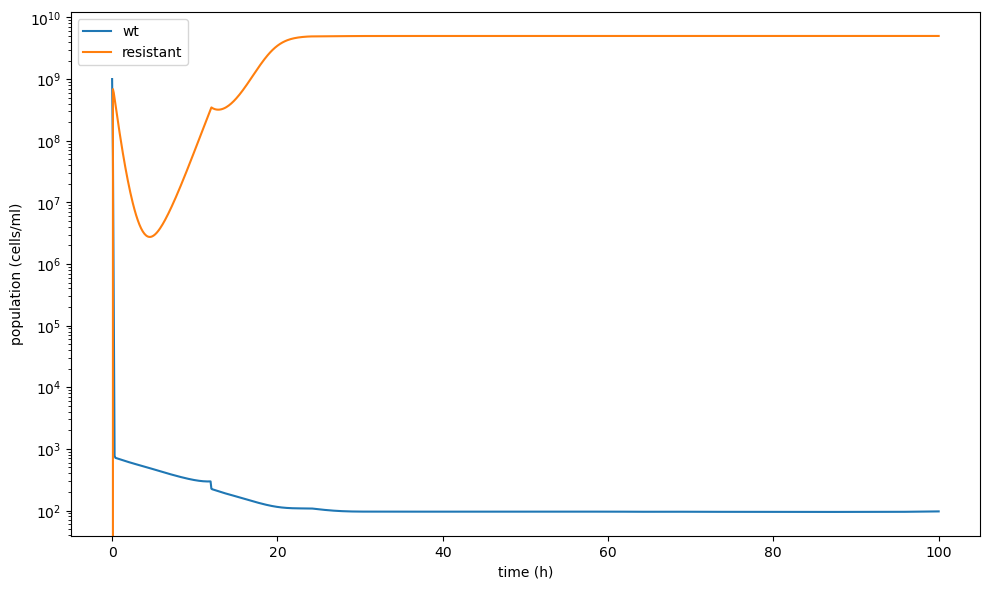

In [74]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt

params = {
    'mic': [1, 4, 20, 50],      # MIC values for wildtype and 3 resistant mutants
    'gMax': 1.0,                # Max growth rate of WT cells
    'gMin': -6.5,               # Minimum growth rate (when antibiotic is fully inhibitory)
    'gMaxR': 0.9,               # Max growth rate of Resister cells
    'kappa': 1,                 # Hill coefficient for drug effect
    'c': 5e9,                   # Carrying capacity
    'aMax': 1e-4,               # Rate of conversion from N to P under drug exposure
    'b': 0.1,                   # Rate of reversion from P to N
    'm': 1.5e-8,                # Basal mutation rate
    'tau': 2,                   # Coefficient for stress-induced mutagenesis
    'h': 5,                     # Exponent for stress response curve
    'muP': 1.5e-4,              # Mutation rate from persisters
    'immune': False,             # Whether immune response is enabled
    'mutation': True,           # Whether mutation is enabled
    'emax': 1e6,                # Max immune effector population
    'q': 3e-4,                  # Immune recruitment rate
    'l': 1e-3,                  # Immune inactivation rate
    'jN': 5e-6,                 # Immune killing of normal cells
    'jP': 5e-8,                 # Immune killing of persisters
    'aPeak': 25,                # Peak antibiotic concentration
    'doseInterval': 12,         # Antibiotic dosing interval (hours)
    'decayRate': np.log(2)/2.5  # Drug decay rate (half-life = 2.5h)
}

def drug(t, decayRate, doseInterval, aPeak):
    # Current drug concentration
    return aPeak * np.exp(-decayRate * (t % doseInterval))
        
def growthRate(a, mic, gMax, gMin, kappa):
    # Growth inhibition
    return gMax - ((gMax - gMin) * (a/mic)**kappa / ((a/mic)**kappa - (gMin/gMax)))

def mutationRate(g, m, tau, h):
    # Stress induced mutation rate 
    return m * g + tau * m * np.exp(-h * g)

def system(t, y, p):
    nw, pw, nr1, pr1, nr2, pr2, nr3, pr3, e = y
    mic = p['mic']
    gMax = p['gMax']
    gMaxR = p['gMaxR']
    gMin = p['gMin']
    total = nw + pw + nr1 + pr1 + nr2 + pr2 + nr3 + pr3
    a = drug(t, p['decayRate'], p['doseInterval'], p['aPeak']) # Drug concentration
    aRate = p['aMax'] * total / p['c'] # Drug induced switching to persisters
    b = p['b']

    gWt = growthRate(a, mic[0], gMax, gMin, p['kappa']) * (1 - total / p['c'])
    gR1 = growthRate(a, mic[1], gMaxR, gMin, p['kappa']) * (1 - total / p['c'])
    gR2 = growthRate(a, mic[2], gMaxR, gMin, p['kappa']) * (1 - total / p['c'])
    gR3 = growthRate(a, mic[3], gMaxR, gMin, p['kappa']) * (1 - total / p['c'])

    muW = mutationRate(gWt, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muR1 = mutationRate(gR1, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muR2 = mutationRate(gR2, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muP = p['muP'] if p['mutation'] else 0

    jN = p['jN'] if p['immune'] else 0
    jP = p['jP'] if p['immune'] else 0

    total_active = nw + nr1 + nr2 + nr3 
    
    dNw = gWt * nw - aRate * nw + b * pw - muW * nw - jN * nw * e
    dPw = aRate * nw - b * pw - muP * pw - jP * pw * e
    dNr1 = gR1 * nr1 - aRate * nr1 + b * pr1 + muW * nw - muR1 * nr1 - jN * nr1 * e
    dPr1 = aRate * nr1 - b * pr1 + muP * pw - muP * pr1 - jP * pr1 * e
    dNr2 = gR2 * nr2 - aRate * nr2 + b * pr2 + muR1 * nr1 - muR2 * nr2 - jN * nr2 * e
    dPr2 = aRate * nr2 - b * pr2 + muP * pr1 - muP * pr2 - jP * pr2 * e
    dNr3 = gR3 * nr3 - aRate * nr3 + b * pr3 + muR2 * nr2 - jN * nr3 * e
    dPr3 = aRate * nr3 - b * pr3 + muP * pr2 - jP * pr3 * e
    dE = p['q'] * total_active - p['l'] * e # immune cell increase in response to pathogen load

    return [dNw, dPw, dNr1, dPr1, dNr2, dPr2, dNr3, dPr3, dE]

y0 = [1e9, 0, 0, 0, 0, 0, 0, 0, 0]
tSpan = (0, 100)
tEval = np.linspace(*tSpan, 1000)

sol = solve_ivp(system, tSpan, y0, args=(params,), t_eval=tEval, method='RK45')

plt.figure(figsize=(10, 6))
labels = ['nw', 'pw', 'nr1', 'pr1', 'nr2', 'pr2', 'nr3', 'pr3']
for i in range(8):
    plt.plot(sol.t, sol.y[i], label=labels[i])
plt.yscale('log')
plt.xlabel('time (h)')
plt.ylabel('population (cells/ml)')
plt.legend()
plt.tight_layout()
plt.show()

wt_total = sol.y[0] + sol.y[1]
rs_total = sol.y[2] + sol.y[3] + sol.y[5] + sol.y[6] + sol.y[7] + sol.y[4]

plt.figure(figsize=(10, 6))
plt.plot(sol.t, wt_total, label='wt')
plt.plot(sol.t, rs_total, label='resistant')
plt.yscale('log')
plt.xlabel('time (h)')
plt.ylabel('population (cells/ml)')
plt.legend()
plt.tight_layout()
plt.show()

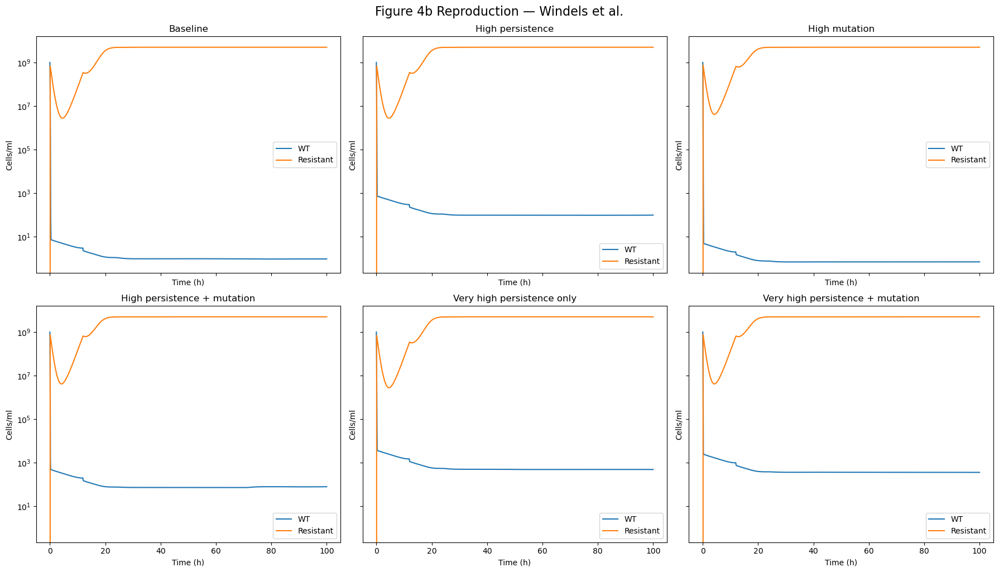

In [80]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt

# Define all label names
labels = ['nw', 'pw', 'nr1', 'pr1', 'nr2', 'pr2', 'nr3', 'pr3']

# Define baseline and altered parameter scenarios
scenarios = [
    {'label': 'Baseline', 'aMax': 1e-6, 'm': 1.5e-8, 'muP': 1.5e-4},
    {'label': 'High persistence', 'aMax': 1e-4, 'm': 1.5e-8, 'muP': 1.5e-4},
    {'label': 'High mutation', 'aMax': 1e-6, 'm': 3.0e-8, 'muP': 6.0e-4},
    {'label': 'High persistence + mutation', 'aMax': 1e-4, 'm': 3.0e-8, 'muP': 6.0e-4},
    {'label': 'Very high persistence only', 'aMax': 5e-4, 'm': 1.5e-8, 'muP': 1.5e-4},
    {'label': 'Very high persistence + mutation', 'aMax': 5e-4, 'm': 3.0e-8, 'muP': 6.0e-4}
]

# Time setup
tSpan = (0, 100)
tEval = np.linspace(*tSpan, 1000)
y0 = [1e9, 0, 0, 0, 0, 0, 0, 0, 0]

# Generate subplots
fig, axes = plt.subplots(2, 3, figsize=(18, 10), sharex=True, sharey=True)
axes = axes.ravel()

for i, scenario in enumerate(scenarios):
    # Modify base parameters
    localParams = params.copy()
    localParams['aMax'] = scenario['aMax']
    localParams['m'] = scenario['m']
    localParams['muP'] = scenario['muP']

    # Run simulation
    sol = solve_ivp(system, tSpan, y0, args=(localParams,), t_eval=tEval, method='RK45')

    # Compute totals
    wt_total = sol.y[0] + sol.y[1]
    rs_total = sol.y[2] + sol.y[3] + sol.y[4] + sol.y[5] + sol.y[6] + sol.y[7]

    # Plot
    ax = axes[i]
    ax.plot(sol.t, wt_total, label='WT')
    ax.plot(sol.t, rs_total, label='Resistant')
    ax.set_yscale('log')
    ax.set_title(scenario['label'])
    ax.set_xlabel('Time (h)')
    ax.set_ylabel('Cells/ml')
    ax.legend()

plt.tight_layout()
plt.suptitle('Figure 4b Reproduction — Windels et al.', y=1.02, fontsize=16)
plt.show()


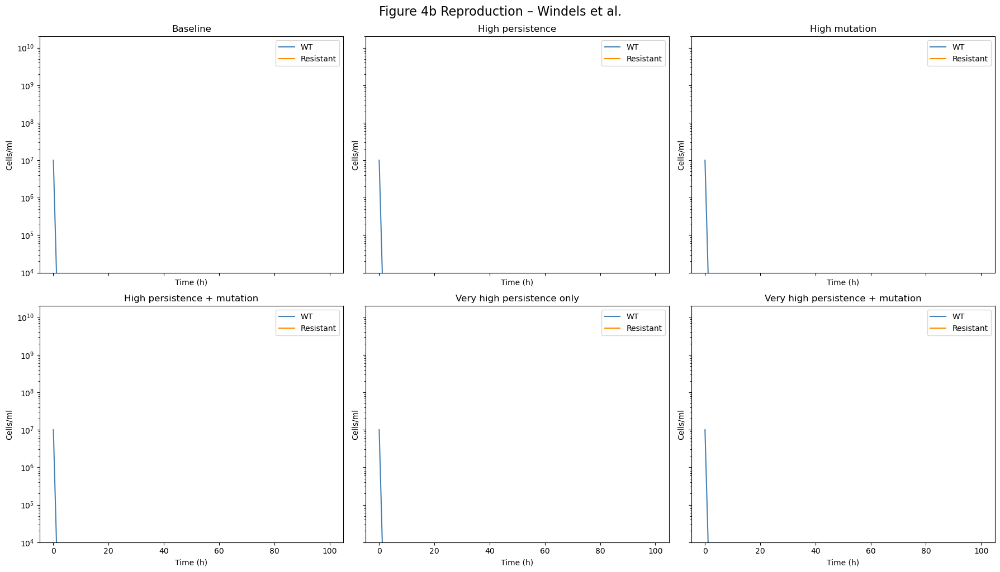

In [ ]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt

# Define baseline parameter dictionary
baseParams = {
    'mic': [1, 4, 20, 50],
    'gMax': 1.0,
    'gMin': -6.5,
    'gMaxR': 0.9,
    'kappa': 1,
    'c': 5e9,
    'aMax': 1e-7,
    'b': 0.1,
    'm': 1.5e-8,
    'tau': 2,
    'h': 5,
    'muP': 1.5e-4,
    'immune': True,
    'mutation': True,
    'emax': 1e6,
    'q': 3e-4,
    'l': 1e-3,
    'jN': 5e-6,
    'jP': 5e-8,
    'aPeak': 25,
    'doseInterval': 12,
    'decayRate': np.log(2) / 2.5
}

def drug(t, decayRate, doseInterval, aPeak):
    return aPeak * np.exp(-decayRate * (t % doseInterval))

def growthRate(a, mic, gMax, gMin, kappa):
    ratio = a / mic
    g = gMax - (gMax - gMin) * (ratio ** kappa / (ratio ** kappa + 1))
    return max(g, gMin)


def mutationRate(g, m, tau, h):
    return m * g + tau * m * np.exp(-h * g) if g > 0 else 0

def system(t, y, p):
    nw, pw, nr1, pr1, nr2, pr2, nr3, pr3, e = y
    total = nw + pw + nr1 + pr1 + nr2 + pr2 + nr3 + pr3
    a = drug(t, p['decayRate'], p['doseInterval'], p['aPeak'])
    aRate = p['aMax'] * total / p['c']
    b = p['b']

    gWt = growthRate(a, p['mic'][0], p['gMax'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR1 = growthRate(a, p['mic'][1], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR2 = growthRate(a, p['mic'][2], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR3 = growthRate(a, p['mic'][3], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])

    muW = mutationRate(gWt, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muR1 = mutationRate(gR1, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muR2 = mutationRate(gR2, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muP = p['muP'] if p['mutation'] else 0

    jN = p['jN'] if p['immune'] else 0
    jP = p['jP'] if p['immune'] else 0

    total_active = nw + nr1 + nr2 + nr3

    return [
        gWt * nw - aRate * nw + b * pw - muW * nw - jN * nw * e,
        aRate * nw - b * pw - muP * pw - jP * pw * e,
        gR1 * nr1 - aRate * nr1 + b * pr1 + muW * nw - muR1 * nr1 - jN * nr1 * e,
        aRate * nr1 - b * pr1 + muP * pw - muP * pr1 - jP * pr1 * e,
        gR2 * nr2 - aRate * nr2 + b * pr2 + muR1 * nr1 - muR2 * nr2 - jN * nr2 * e,
        aRate * nr2 - b * pr2 + muP * pr1 - muP * pr2 - jP * pr2 * e,
        gR3 * nr3 - aRate * nr3 + b * pr3 + muR2 * nr2 - jN * nr3 * e,
        aRate * nr3 - b * pr3 + muP * pr2 - jP * pr3 * e,
        p['q'] * total_active - p['l'] * e
    ]

# Define scenarios (as in Figure 4b)
scenarios = [
    ('Baseline', 1e-7, 1.5e-8, 1.5e-4),
    ('High persistence', 1e-4, 1.5e-8, 1.5e-4),
    ('High mutation', 1e-7, 3.0e-8, 6.0e-4),
    ('High persistence + mutation', 1e-4, 3.0e-8, 6.0e-4),
    ('Very high persistence only', 5e-4, 1.5e-8, 1.5e-4),
    ('Very high persistence + mutation', 5e-4, 3.0e-8, 6.0e-4)
]

# Set initial condition and time
y0 = [1e7, 0, 0, 0, 0, 0, 0, 0, 0]
tSpan = (0, 100)
tEval = np.linspace(*tSpan, 1000)

# Create figure
fig, axes = plt.subplots(2, 3, figsize=(18, 10), sharex=True, sharey=True)
axes = axes.ravel()

for idx, (label, aMax, m, muP) in enumerate(scenarios):
    p = baseParams.copy()
    p['aMax'] = aMax
    p['m'] = m
    p['muP'] = muP

    sol = solve_ivp(system, tSpan, y0, args=(p,), t_eval=tEval, method='RK45')

    wt_total = sol.y[0] + sol.y[1]
    rs_total = sol.y[2] + sol.y[3] + sol.y[4] + sol.y[5] + sol.y[6] + sol.y[7]

    ax = axes[idx]
    ax.plot(sol.t, wt_total, label='WT', color='steelblue')
    ax.plot(sol.t, rs_total, label='Resistant', color='darkorange')
    ax.set_yscale('log')
    ax.set_ylim(1e4, 2e10)
    ax.set_title(label)
    ax.set_xlabel('Time (h)')
    ax.set_ylabel('Cells/ml')
    ax.legend()

plt.tight_layout()
plt.suptitle('Figure 4b Reproduction – Windels et al.', y=1.02, fontsize=16)
plt.show()


trend works, plot doesn't

<>:131: SyntaxWarning: invalid escape sequence '\m'
<>:131: SyntaxWarning: invalid escape sequence '\m'
<>:133: SyntaxWarning: invalid escape sequence '\m'
<>:133: SyntaxWarning: invalid escape sequence '\m'
<>:131: SyntaxWarning: invalid escape sequence '\m'
<>:131: SyntaxWarning: invalid escape sequence '\m'
<>:133: SyntaxWarning: invalid escape sequence '\m'
<>:133: SyntaxWarning: invalid escape sequence '\m'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/3189878185.py:131: SyntaxWarning: invalid escape sequence '\m'
  label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nTakeover at {takeover_time:.0f}h'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/3189878185.py:131: SyntaxWarning: invalid escape sequence '\m'
  label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nTakeover at {takeover_time:.0f}h'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/3189878185.py:133: SyntaxWarning: invalid escape sequence '\m'
  l

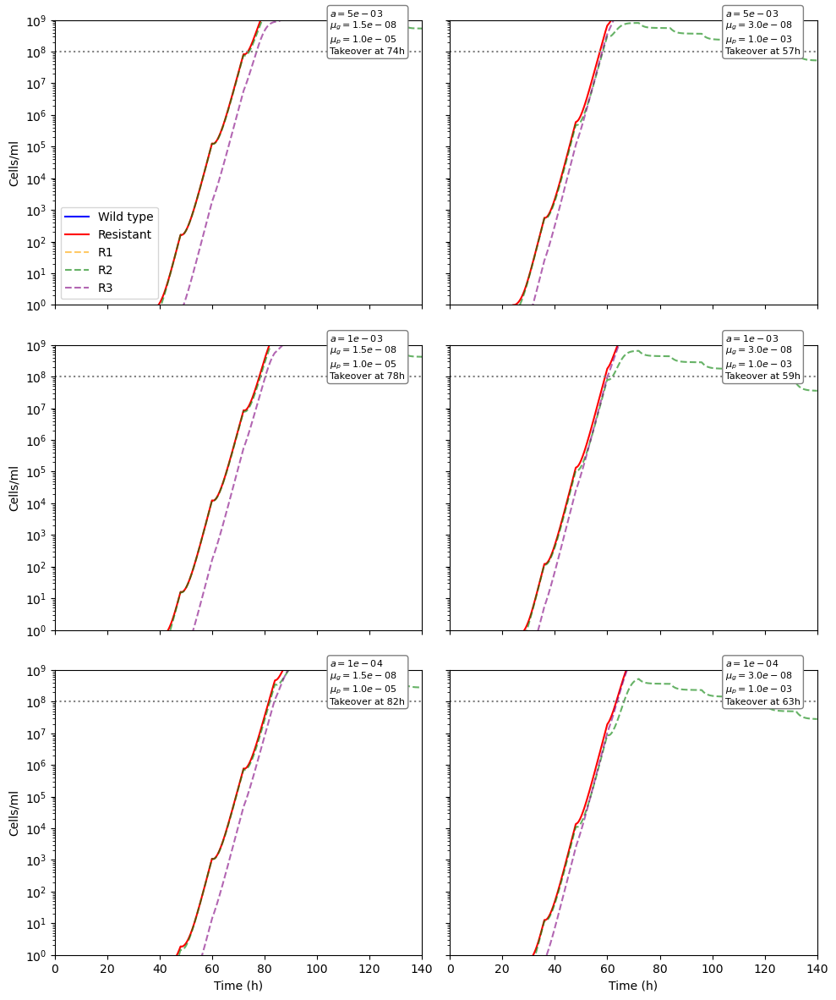

In [90]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt

def drug(t, decayRate, doseInterval, aPeak):
    dose_times = np.arange(0, t + 1, doseInterval)
    return np.sum([aPeak * np.exp(-decayRate * (t - d)) for d in dose_times if d <= t])

def growthRate(a, mic, gMax, gMin, kappa):
    ratio = a / mic
    return gMax - (gMax - gMin) * (ratio**kappa / (ratio**kappa + 1))

def mutationRate(g, m, tau, h):
    return m * g + tau * m * np.exp(-h * g) if g > 0 else 0

def system(t, y, p):
    nw, pw, nr1, pr1, nr2, pr2, nr3, pr3, e = y
    total = nw + pw + nr1 + pr1 + nr2 + pr2 + nr3 + pr3
    a = drug(t, p['decayRate'], p['doseInterval'], p['aPeak'])
    aRate = p['aMax']  # true per-cell rate
    # dPw = aRate * nw
    b = p['b']

    gWt = growthRate(a, p['mic'][0], p['gMax'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR1 = growthRate(a, p['mic'][1], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR2 = growthRate(a, p['mic'][2], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR3 = growthRate(a, p['mic'][3], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])

    muW = mutationRate(gWt, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muR1 = mutationRate(gR1, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muR2 = mutationRate(gR2, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muP = p['muP'] if p['mutation'] else 0

    dNw = gWt * nw - aRate * nw - muW * nw - p['jN'] * nw * e
    dPw = aRate * nw - b * pw - muP * pw - p['jP'] * pw * e

    dNr1 = gR1 * nr1 - aRate * nr1 - muR1 * nr1 - p['jN'] * nr1 * e
    dPr1 = aRate * nr1 - b * pr1 - p['jP'] * pr1 * e

    dNr2 = gR2 * nr2 - aRate * nr2 - muR2 * nr2 - p['jN'] * nr2 * e
    dPr2 = aRate * nr2 - b * pr2 - p['jP'] * pr2 * e

    dNr3 = gR3 * nr3 - aRate * nr3 - p['jN'] * nr3 * e
    dPr3 = aRate * nr3 - b * pr3 - p['jP'] * pr3 * e

    dPr1 += muP * pw
    dPr2 += muP * pr1
    dPr3 += muP * pr2

    dNr1 += muW * nw
    dNr2 += muR1 * nr1
    dNr3 += muR2 * nr2

    dNw += b * pw
    dNr1 += b * pr1
    dNr2 += b * pr2
    dNr3 += b * pr3

    dE = p['q'] * (p['emax'] - e) - p['l'] * e

    return [dNw, dPw, dNr1, dPr1, dNr2, dPr2, dNr3, dPr3, dE]

# Base parameters
baseParams = {
    'mic': [1, 10, 40, 100],
    'gMax': 1.0,
    'gMaxR': 0.95,
    'gMin': -6.5,
    'kappa': 1.5,
    'c': 5e9,
    'b': 0.1,
    'tau': 100,
    'h': 5,
    'mutation': True,
    'aPeak': 10,
    'doseInterval': 12,
    'decayRate': np.log(2) / 2.5,
    'emax': 1e6,
    'l': 1e-3,
    'q': 3e-4,
    'jN': 5e-6,
    'jP': 5e-8
}

aVals = [5e-3, 1e-3, 1e-4]
mutationVals = [(1.5e-8, 1e-5), (3e-8, 1e-3)]

# Timing
t_pre = (0, 100)
t_main = (0, 140)
tEval = np.linspace(*t_main, 1000)

# Initial conditions: WT + 1 R1 seed
y0_init = [1e7, 0, 1, 0, 0, 0, 0, 0, 0]

fig, axs = plt.subplots(3, 2, figsize=(10, 12), sharex=True, sharey=True)

for i, aMax in enumerate(aVals):
    for j, (muG, muP) in enumerate(mutationVals):
        p = baseParams.copy()
        p['aMax'] = aMax
        p['m'] = muG
        p['muP'] = muP

        # 1. Pre-equilibrate with mutation OFF
        p['mutation'] = False
        sol_pre = solve_ivp(system, t_pre, y0_init, args=(p,), method='BDF')
        y_ss = sol_pre.y[:, -1]

        # 2. Rerun with mutation ON
        p['mutation'] = True
        sol = solve_ivp(system, t_main, y_ss, args=(p,), t_eval=tEval, method='BDF', atol=1e-12, rtol=1e-9)
        y = np.clip(sol.y, 1e-1, None)

        wt = y[0] + y[1]
        r1 = y[2] + y[3]
        r2 = y[4] + y[5]
        r3 = y[6] + y[7]
        rs = r1 + r2 + r3

        ax = axs[i, j]
        ax.plot(sol.t, wt, label='Wild type', color='blue')
        ax.plot(sol.t, rs, label='Resistant', color='red')
        ax.plot(sol.t, r1, '--', color='orange', alpha=0.6, label='R1' if i == 0 and j == 0 else None)
        ax.plot(sol.t, r2, '--', color='green', alpha=0.6, label='R2' if i == 0 and j == 0 else None)
        ax.plot(sol.t, r3, '--', color='purple', alpha=0.6, label='R3' if i == 0 and j == 0 else None)
        ax.axhline(1e8, linestyle=':', color='gray')

        if np.any(rs > 1e8):
            takeover_time = sol.t[np.argmax(rs > 1e8)]
            label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nTakeover at {takeover_time:.0f}h'
        else:
            label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nNo takeover'

        ax.text(0.75, 0.88, label, transform=ax.transAxes,
                bbox=dict(facecolor='white', edgecolor='gray', boxstyle='round'), fontsize=8)

        ax.set_yscale('log')
        ax.set_xlim(*t_main)
        ax.set_ylim(1, 1e9)
        if i == 2:
            ax.set_xlabel('Time (h)')
        if j == 0:
            ax.set_ylabel('Cells/ml')
        if i == 0 and j == 0:
            ax.legend()

plt.tight_layout()
plt.show()


<>:133: SyntaxWarning: invalid escape sequence '\m'
<>:133: SyntaxWarning: invalid escape sequence '\m'
<>:135: SyntaxWarning: invalid escape sequence '\m'
<>:135: SyntaxWarning: invalid escape sequence '\m'
<>:133: SyntaxWarning: invalid escape sequence '\m'
<>:133: SyntaxWarning: invalid escape sequence '\m'
<>:135: SyntaxWarning: invalid escape sequence '\m'
<>:135: SyntaxWarning: invalid escape sequence '\m'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/3435494342.py:133: SyntaxWarning: invalid escape sequence '\m'
  label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nTakeover at {takeover_time:.0f}h'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/3435494342.py:133: SyntaxWarning: invalid escape sequence '\m'
  label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nTakeover at {takeover_time:.0f}h'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/3435494342.py:135: SyntaxWarning: invalid escape sequence '\m'
  l

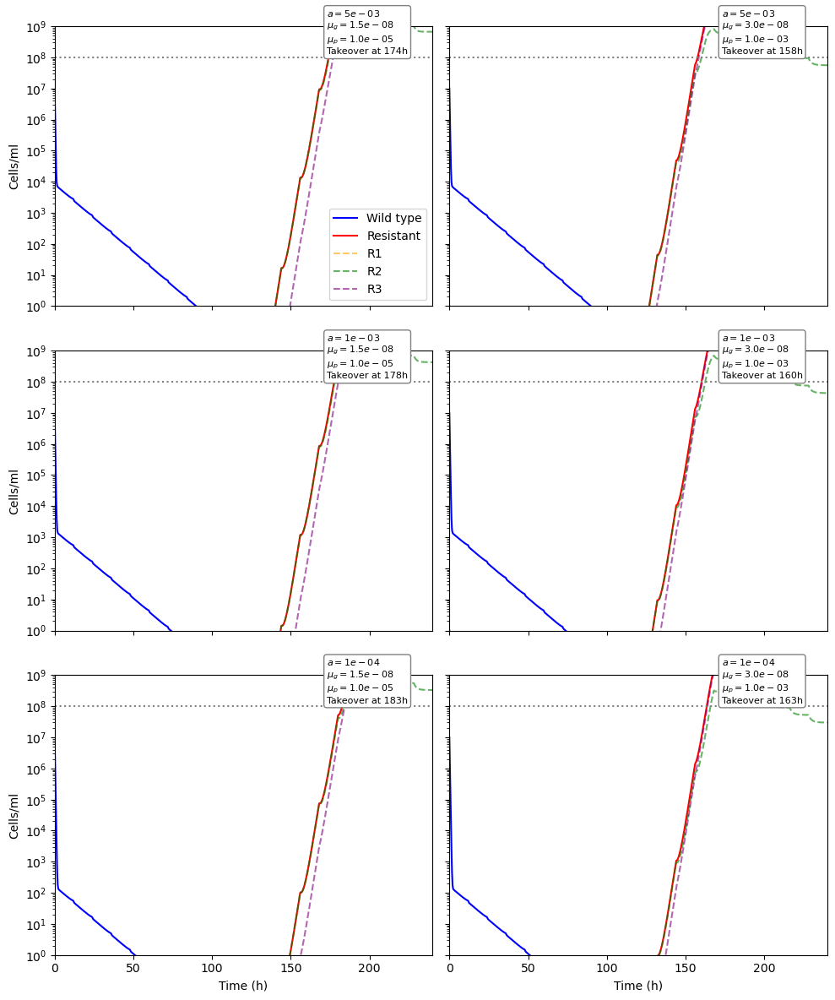

In [91]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt

def drug(t, decayRate, doseInterval, aPeak):
    dose_times = np.arange(0, t + 1, doseInterval)
    return np.sum([aPeak * np.exp(-decayRate * (t - d)) for d in dose_times if d <= t])

def growthRate(a, mic, gMax, gMin, kappa):
    ratio = a / mic
    return gMax - (gMax - gMin) * (ratio**kappa / (ratio**kappa + 1))

def mutationRate(g, m, tau, h):
    return m * g + tau * m * np.exp(-h * g) if g > 0 else 0

def system(t, y, p):
    nw, pw, nr1, pr1, nr2, pr2, nr3, pr3, e = y
    total = nw + pw + nr1 + pr1 + nr2 + pr2 + nr3 + pr3
    a = drug(t, p['decayRate'], p['doseInterval'], p['aPeak'])
    aRate = p['aMax']
    b = p['b']

    gWt = growthRate(a, p['mic'][0], p['gMax'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR1 = growthRate(a, p['mic'][1], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR2 = growthRate(a, p['mic'][2], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR3 = growthRate(a, p['mic'][3], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])

    muW = mutationRate(gWt, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muR1 = mutationRate(gR1, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muR2 = mutationRate(gR2, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muP = p['muP'] if p['mutation'] else 0

    dNw = gWt * nw - aRate * nw - muW * nw - p['jN'] * nw * e
    dPw = aRate * nw - b * pw - muP * pw - p['jP'] * pw * e

    dNr1 = gR1 * nr1 - aRate * nr1 - muR1 * nr1 - p['jN'] * nr1 * e
    dPr1 = aRate * nr1 - b * pr1 - p['jP'] * pr1 * e

    dNr2 = gR2 * nr2 - aRate * nr2 - muR2 * nr2 - p['jN'] * nr2 * e
    dPr2 = aRate * nr2 - b * pr2 - p['jP'] * pr2 * e

    dNr3 = gR3 * nr3 - aRate * nr3 - p['jN'] * nr3 * e
    dPr3 = aRate * nr3 - b * pr3 - p['jP'] * pr3 * e

    dPr1 += muP * pw
    dPr2 += muP * pr1
    dPr3 += muP * pr2

    dNr1 += muW * nw
    dNr2 += muR1 * nr1
    dNr3 += muR2 * nr2

    dNw += b * pw
    dNr1 += b * pr1
    dNr2 += b * pr2
    dNr3 += b * pr3

    dE = p['q'] * (p['emax'] - e) - p['l'] * e

    return [dNw, dPw, dNr1, dPr1, dNr2, dPr2, dNr3, dPr3, dE]

# Simulation parameters
baseParams = {
    'mic': [1, 10, 40, 100],
    'gMax': 1.0,
    'gMaxR': 0.95,
    'gMin': -6.5,
    'kappa': 1.5,
    'c': 5e9,
    'b': 0.1,
    'tau': 100,
    'h': 5,
    'mutation': True,
    'aPeak': 10,
    'doseInterval': 12,
    'decayRate': np.log(2) / 2.5,
    'emax': 1e6,
    'l': 1e-3,
    'q': 3e-4,
    'jN': 5e-6,
    'jP': 5e-8
}

aVals = [5e-3, 1e-3, 1e-4]
mutationVals = [(1.5e-8, 1e-5), (3e-8, 1e-3)]

t_pre = (0, 100)
t_main = (0, 140)

# Initial conditions: WT + 1 R1 seed
y0_init = [1e7, 0, 1, 0, 0, 0, 0, 0, 0]

fig, axs = plt.subplots(3, 2, figsize=(10, 12), sharex=True, sharey=True)

for i, aMax in enumerate(aVals):
    for j, (muG, muP) in enumerate(mutationVals):
        p = baseParams.copy()
        p['aMax'] = aMax
        p['m'] = muG
        p['muP'] = muP

        # Pre-phase (no mutation)
        p['mutation'] = False
        t_pre_eval = np.linspace(*t_pre, 300)
        sol_pre = solve_ivp(system, t_pre, y0_init, args=(p,), t_eval=t_pre_eval, method='BDF')

        # Main phase (mutation on)
        p['mutation'] = True
        t_main_eval = np.linspace(t_pre[1], t_pre[1] + t_main[1], 700)
        sol_main = solve_ivp(system, (t_pre[1], t_pre[1] + t_main[1]), sol_pre.y[:, -1],
                             args=(p,), t_eval=t_main_eval, method='BDF', atol=1e-12, rtol=1e-9)

        t_all = np.concatenate([sol_pre.t, sol_main.t])
        y_all = np.concatenate([sol_pre.y, sol_main.y], axis=1)
        y_all = np.clip(y_all, 1e-6, None)  # Lower threshold for visibility

        wt = y_all[0] + y_all[1]
        r1 = y_all[2] + y_all[3]
        r2 = y_all[4] + y_all[5]
        r3 = y_all[6] + y_all[7]
        rs = r1 + r2 + r3

        ax = axs[i, j]
        ax.plot(t_all, wt, label='Wild type', color='blue')
        ax.plot(t_all, rs, label='Resistant', color='red')
        ax.plot(t_all, r1, '--', color='orange', alpha=0.6, label='R1' if i == 0 and j == 0 else None)
        ax.plot(t_all, r2, '--', color='green', alpha=0.6, label='R2' if i == 0 and j == 0 else None)
        ax.plot(t_all, r3, '--', color='purple', alpha=0.6, label='R3' if i == 0 and j == 0 else None)
        ax.axhline(1e8, linestyle=':', color='gray')

        if np.any(rs > 1e8):
            takeover_time = t_all[np.argmax(rs > 1e8)]
            label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nTakeover at {takeover_time:.0f}h'
        else:
            label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nNo takeover'

        ax.text(0.72, 0.9, label, transform=ax.transAxes,
                bbox=dict(facecolor='white', edgecolor='gray', boxstyle='round'), fontsize=8)

        ax.set_yscale('log')
        ax.set_xlim(0, t_pre[1] + t_main[1])
        ax.set_ylim(1, 1e9)
        if i == 2:
            ax.set_xlabel('Time (h)')
        if j == 0:
            ax.set_ylabel('Cells/ml')
        if i == 0 and j == 0:
            ax.legend()

plt.tight_layout()
plt.show()


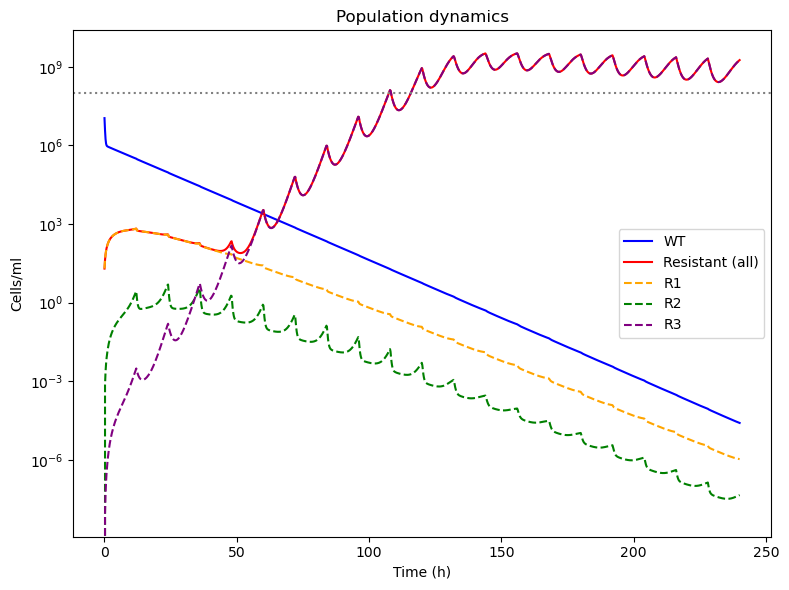

In [98]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt

def drug(t, decayRate, doseInterval, aPeak):
    dose_times = np.arange(0, t + 1, doseInterval)
    return np.sum([aPeak * np.exp(-decayRate * (t - d)) for d in dose_times if d <= t])

def growthRate(a, mic, gMax, gMin, kappa):
    return gMax - (gMax - gMin) * ((a / mic)**kappa / ((a / mic)**kappa + 1))

def mutationRate(g, m, tau, h):
    return m * g + tau * m * np.exp(-h * g) if g > 0 else 0

def system(t, y, p):
    nw, pw, nr1, pr1, nr2, pr2, nr3, pr3, e = y
    total = sum(y[:8])
    a = drug(t, p['decayRate'], p['doseInterval'], p['aPeak'])
    b = p['b']

    # Growth
    gW = growthRate(a, p['mic'][0], p['gMax'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    g1 = growthRate(a, p['mic'][1], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    g2 = growthRate(a, p['mic'][2], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    g3 = growthRate(a, p['mic'][3], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])

    muW = mutationRate(gW, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    mu1 = mutationRate(g1, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    mu2 = mutationRate(g2, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muP = p['muP'] if p['mutation'] else 0

    # Dynamics
    dNw = gW * nw - muW * nw - p['jN'] * nw * e
    dPw = - b * pw - muP * pw - p['jP'] * pw * e

    dNr1 = g1 * nr1 - mu1 * nr1 - p['jN'] * nr1 * e
    dPr1 = - b * pr1 - p['jP'] * pr1 * e

    dNr2 = g2 * nr2 - mu2 * nr2 - p['jN'] * nr2 * e
    dPr2 = - b * pr2 - p['jP'] * pr2 * e

    dNr3 = g3 * nr3 - p['jN'] * nr3 * e
    dPr3 = - b * pr3 - p['jP'] * pr3 * e

    # Mutation flows
    dPr1 += muP * pw
    dPr2 += muP * pr1
    dPr3 += muP * pr2
    dNr2 += mu1 * pr1
    dNr3 += mu2 * pr2

    dNr1 += muW * nw
    dNr2 += mu1 * nr1
    dNr3 += mu2 * nr2

    # Recovery from persister
    dNw += b * pw
    dNr1 += b * pr1
    dNr2 += b * pr2
    dNr3 += b * pr3

    dE = p['q'] * (p['emax'] - e) - p['l'] * e
    return [dNw, dPw, dNr1, dPr1, dNr2, dPr2, dNr3, dPr3, dE]

# === Simulation ===
params = {
    'mic': [1, 4, 20, 50],
    'gMax': 1.0,
    'gMaxR': 0.8,
    'gMin': -6.5,
    'kappa': 1.5,
    'c': 5e9,
    'b': 0.1,
    'tau': 10,
    'h': 5,
    'mutation': True,
    'aPeak': 25,
    'doseInterval': 12,
    'decayRate': np.log(2) / 2.5,
    'emax': 1e6,
    'l': 1e-3,
    'q': 3e-4,
    'jN': 5e-6,
    'jP': 5e-8,
    'm': 1.5e-8,
    'muP': 1.5e-4
}

# Time and initial state
tspan = (0, 240)
t_eval = np.linspace(*tspan, 1200)
y0 = [1e7, 1e6, 10, 10, 0, 0, 0, 0, 0]

sol = solve_ivp(system, tspan, y0, args=(params,), t_eval=t_eval, method='BDF', atol=1e-10, rtol=1e-8)
y = sol.y

# Plot
plt.figure(figsize=(8, 6))
plt.plot(sol.t, y[0]+y[1], label='WT', color='blue')
plt.plot(sol.t, y[2]+y[3]+y[4]+y[5]+y[6]+y[7], label='Resistant (all)', color='red')
plt.plot(sol.t, y[2]+y[3], '--', label='R1', color='orange')
plt.plot(sol.t, y[4]+y[5], '--', label='R2', color='green')
plt.plot(sol.t, y[6]+y[7], '--', label='R3', color='purple')
plt.axhline(1e8, linestyle=':', color='gray')
plt.yscale('log')
plt.xlabel('Time (h)')
plt.ylabel('Cells/ml')
plt.title('Population dynamics')
plt.legend()
plt.tight_layout()
plt.show()


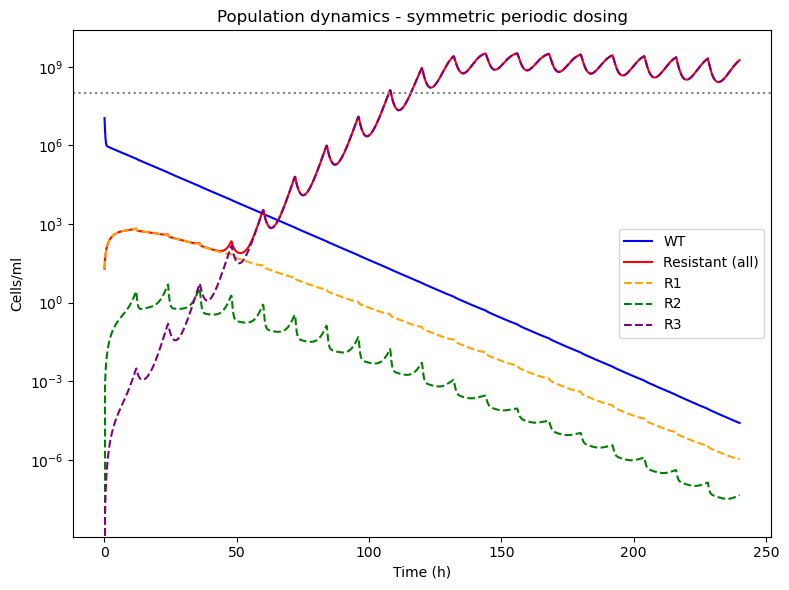

In [101]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt

def drug(t, decayRate, doseInterval, aPeak):
    dose_times = np.arange(0, t + 1, doseInterval)
    return np.sum([aPeak * np.exp(-decayRate * (t - d)) for d in dose_times if d <= t])

def growthRate(a, mic, gMax, gMin, kappa):
    return gMax - (gMax - gMin) * ((a / mic)**kappa / ((a / mic)**kappa + 1))

def mutationRate(g, m, tau, h):
    return m * g + tau * m * np.exp(-h * g) if g > 0 else 0

def system(t, y, p):
    nw, pw, nr1, pr1, nr2, pr2, nr3, pr3, e = y
    total = sum(y[:8])
    a = drug(t, p['decayRate'], p['doseInterval'], p['aPeak'])
    b = p['b']

    # Growth
    gW = growthRate(a, p['mic'][0], p['gMax'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    g1 = growthRate(a, p['mic'][1], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    g2 = growthRate(a, p['mic'][2], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    g3 = growthRate(a, p['mic'][3], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])

    muW = mutationRate(gW, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    mu1 = mutationRate(g1, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    mu2 = mutationRate(g2, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muP = p['muP'] if p['mutation'] else 0

    # Dynamics
    dNw = gW * nw - muW * nw - p['jN'] * nw * e
    dPw = - b * pw - muP * pw - p['jP'] * pw * e

    dNr1 = g1 * nr1 - mu1 * nr1 - p['jN'] * nr1 * e
    dPr1 = - b * pr1 - p['jP'] * pr1 * e

    dNr2 = g2 * nr2 - mu2 * nr2 - p['jN'] * nr2 * e
    dPr2 = - b * pr2 - p['jP'] * pr2 * e

    dNr3 = g3 * nr3 - p['jN'] * nr3 * e
    dPr3 = - b * pr3 - p['jP'] * pr3 * e

    # Mutation flows
    dPr1 += muP * pw
    dPr2 += muP * pr1
    dPr3 += muP * pr2
    dNr2 += mu1 * pr1
    dNr3 += mu2 * pr2

    dNr1 += muW * nw
    dNr2 += mu1 * nr1
    dNr3 += mu2 * nr2

    # Recovery from persister
    dNw += b * pw
    dNr1 += b * pr1
    dNr2 += b * pr2
    dNr3 += b * pr3

    dE = p['q'] * (p['emax'] - e) - p['l'] * e
    return [dNw, dPw, dNr1, dPr1, dNr2, dPr2, dNr3, dPr3, dE]

# === Simulation ===
params = {
    'mic': [1, 4, 20, 50],
    'gMax': 1.0,
    'gMaxR': 0.8,
    'gMin': -6.5,
    'kappa': 1.5,
    'c': 5e9,
    'b': 0.1,
    'tau': 10,
    'h': 5,
    'mutation': True,
    'aPeak': 25,
    'doseInterval': 12,
    'decayRate': np.log(2) / 2.5,
    'emax': 1e6,
    'l': 1e-3,
    'q': 3e-4,
    'jN': 5e-6,
    'jP': 5e-8,
    'm': 1.5e-8,
    'muP': 1.5e-4
}

# Time and initial state
tspan = (0, 240)
t_eval = np.linspace(*tspan, 1200)
y0 = [1e7, 1e6, 10, 10, 0, 0, 0, 0, 0]

sol = solve_ivp(system, tspan, y0, args=(params,), t_eval=t_eval, method='BDF', atol=1e-10, rtol=1e-8)
y = sol.y

# Plot
plt.figure(figsize=(8, 6))
plt.plot(sol.t, y[0]+y[1], label='WT', color='blue')
plt.plot(sol.t, y[2]+y[3]+y[4]+y[5]+y[6]+y[7], label='Resistant (all)', color='red')
plt.plot(sol.t, y[2]+y[3], '--', label='R1', color='orange')
plt.plot(sol.t, y[4]+y[5], '--', label='R2', color='green')
plt.plot(sol.t, y[6]+y[7], '--', label='R3', color='purple')
plt.axhline(1e8, linestyle=':', color='gray')
plt.yscale('log')
plt.xlabel('Time (h)')
plt.ylabel('Cells/ml')
plt.title('Population dynamics - symmetric periodic dosing')
plt.legend()
plt.tight_layout()
plt.show()


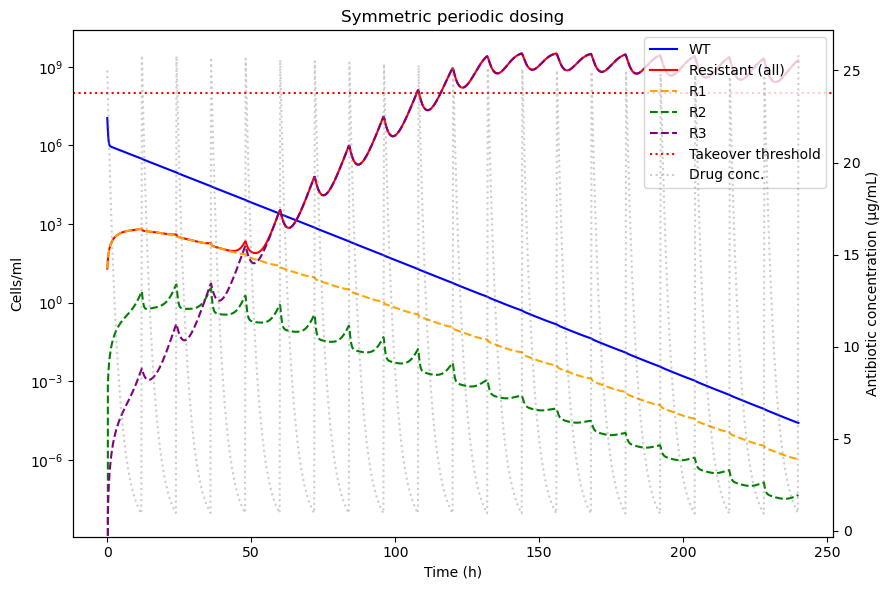

In [115]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt

def drug(t, decayRate, doseInterval, aPeak):
    dose_times = np.arange(0, t + 1, doseInterval)
    return np.sum([aPeak * np.exp(-decayRate * (t - d)) for d in dose_times if d <= t])

def growthRate(a, mic, gMax, gMin, kappa):
    return gMax - (gMax - gMin) * ((a / mic)**kappa / ((a / mic)**kappa + 1))

def mutationRate(g, m, tau, h):
    return m * g + tau * m * np.exp(-h * g) if g > 0 else 0

def system(t, y, p):
    nw, pw, nr1, pr1, nr2, pr2, nr3, pr3, e = y
    total = sum(y[:8])
    a = drug(t, p['decayRate'], p['doseInterval'], p['aPeak'])
    b = p['b']

    gW = growthRate(a, p['mic'][0], p['gMax'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    g1 = growthRate(a, p['mic'][1], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    g2 = growthRate(a, p['mic'][2], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    g3 = growthRate(a, p['mic'][3], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])

    muW = mutationRate(gW, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    mu1 = mutationRate(g1, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    mu2 = mutationRate(g2, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muP = p['muP'] if p['mutation'] else 0

    dNw = gW * nw - muW * nw - p['jN'] * nw * e
    dPw = - b * pw - muP * pw - p['jP'] * pw * e

    dNr1 = g1 * nr1 - mu1 * nr1 - p['jN'] * nr1 * e
    dPr1 = - b * pr1 - p['jP'] * pr1 * e

    dNr2 = g2 * nr2 - mu2 * nr2 - p['jN'] * nr2 * e
    dPr2 = - b * pr2 - p['jP'] * pr2 * e

    dNr3 = g3 * nr3 - p['jN'] * nr3 * e
    dPr3 = - b * pr3 - p['jP'] * pr3 * e

    dPr1 += muP * pw
    dPr2 += muP * pr1
    dPr3 += muP * pr2
    dNr2 += mu1 * pr1
    dNr3 += mu2 * pr2

    dNr1 += muW * nw
    dNr2 += mu1 * nr1
    dNr3 += mu2 * nr2

    dNw += b * pw
    dNr1 += b * pr1
    dNr2 += b * pr2
    dNr3 += b * pr3

    dE = p['q'] * (p['emax'] - e) - p['l'] * e
    return [dNw, dPw, dNr1, dPr1, dNr2, dPr2, dNr3, dPr3, dE]

# === Simulation Parameters ===
params = {
    'mic': [1, 4, 20, 50],
    'gMax': 1.0,
    'gMaxR': 0.8,
    'gMin': -6.5,
    'kappa': 1.5,
    'c': 5e9,
    'b': 0.1,
    'tau': 10,
    'h': 5,
    'mutation': True,
    'aPeak': 25,
    'doseInterval': 12,
    'decayRate': np.log(2) / 2.5,
    'emax': 1e6,
    'l': 1e-3,
    'q': 3e-4,
    'jN': 5e-6,
    'jP': 5e-8,
    'm': 1.5e-8,
    'muP': 1.5e-4
}

# === Simulation Time ===
tspan = (0, 240)
t_eval = np.linspace(*tspan, 1200)
y0 = [1e7, 1e6, 10, 10, 0, 0, 0, 0, 0]

# === Run ODE Solver ===
sol = solve_ivp(system, tspan, y0, args=(params,), t_eval=t_eval, method='BDF', atol=1e-10, rtol=1e-8)
y = sol.y

# === Calculate Drug Concentration Over Time ===
a_vals = [drug(t, params['decayRate'], params['doseInterval'], params['aPeak']) for t in sol.t]

# === Plot Population + Drug Concentration with Dual Y-Axes ===
fig, ax1 = plt.subplots(figsize=(9, 6))

# Left y-axis: Population
ax1.plot(sol.t, y[0]+y[1], label='WT', color='blue')
ax1.plot(sol.t, y[2]+y[3]+y[4]+y[5]+y[6]+y[7], label='Resistant (all)', color='red')
ax1.plot(sol.t, y[2]+y[3], '--', label='R1', color='orange')
ax1.plot(sol.t, y[4]+y[5], '--', label='R2', color='green')
ax1.plot(sol.t, y[6]+y[7], '--', label='R3', color='purple')
ax1.axhline(1e8, linestyle=':', color='red', label='Takeover threshold')
ax1.set_yscale('log')
ax1.set_xlabel('Time (h)')
ax1.set_ylabel('Cells/ml')
ax1.set_title('Symmetric periodic dosing')

# Right y-axis: Drug Concentration
ax2 = ax1.twinx()
ax2.plot(sol.t, a_vals, color='gray', linestyle=':', label='Drug conc.', alpha=0.4)
ax2.set_ylabel('Antibiotic concentration (µg/mL)')

# Combined Legend
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper right')

plt.tight_layout()
plt.show()


pop dynamics, single drug pulse

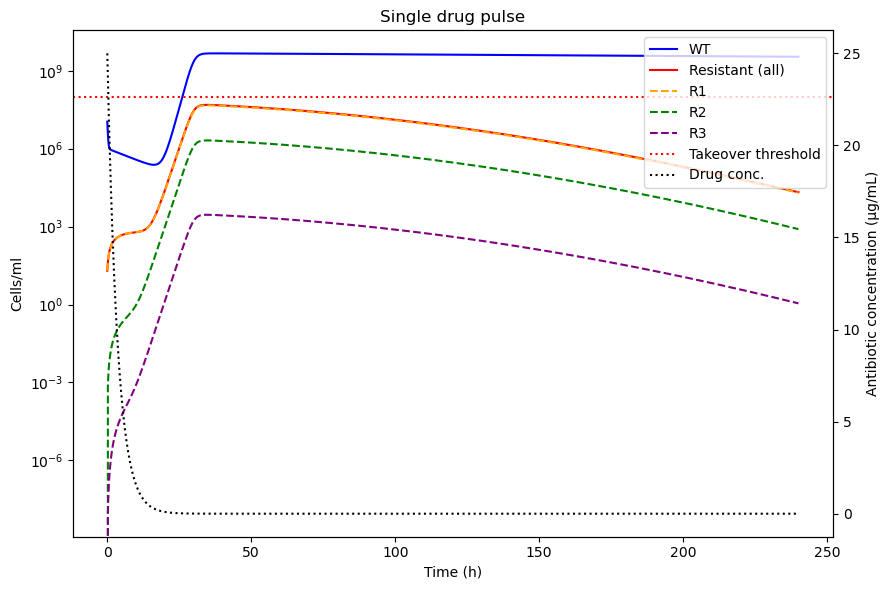

In [110]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt

# Single drug pulse model
def drug(t, decayRate, doseInterval, aPeak):
    return aPeak * np.exp(-decayRate * t) if t >= 0 else 0

def growthRate(a, mic, gMax, gMin, kappa):
    return gMax - (gMax - gMin) * ((a / mic)**kappa / ((a / mic)**kappa + 1))

def mutationRate(g, m, tau, h):
    return m * g + tau * m * np.exp(-h * g) if g > 0 else 0

def system(t, y, p):
    nw, pw, nr1, pr1, nr2, pr2, nr3, pr3, e = y
    total = sum(y[:8])
    a = drug(t, p['decayRate'], p['doseInterval'], p['aPeak'])
    b = p['b']

    gW = growthRate(a, p['mic'][0], p['gMax'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    g1 = growthRate(a, p['mic'][1], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    g2 = growthRate(a, p['mic'][2], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    g3 = growthRate(a, p['mic'][3], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])

    muW = mutationRate(gW, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    mu1 = mutationRate(g1, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    mu2 = mutationRate(g2, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muP = p['muP'] if p['mutation'] else 0

    dNw = gW * nw - muW * nw - p['jN'] * nw * e
    dPw = - b * pw - muP * pw - p['jP'] * pw * e

    dNr1 = g1 * nr1 - mu1 * nr1 - p['jN'] * nr1 * e
    dPr1 = - b * pr1 - p['jP'] * pr1 * e

    dNr2 = g2 * nr2 - mu2 * nr2 - p['jN'] * nr2 * e
    dPr2 = - b * pr2 - p['jP'] * pr2 * e

    dNr3 = g3 * nr3 - p['jN'] * nr3 * e
    dPr3 = - b * pr3 - p['jP'] * pr3 * e

    dPr1 += muP * pw
    dPr2 += muP * pr1
    dPr3 += muP * pr2
    dNr2 += mu1 * pr1
    dNr3 += mu2 * pr2

    dNr1 += muW * nw
    dNr2 += mu1 * nr1
    dNr3 += mu2 * nr2

    dNw += b * pw
    dNr1 += b * pr1
    dNr2 += b * pr2
    dNr3 += b * pr3

    dE = p['q'] * (p['emax'] - e) - p['l'] * e
    return [dNw, dPw, dNr1, dPr1, dNr2, dPr2, dNr3, dPr3, dE]

# Parameters
params = {
    'mic': [1, 4, 20, 50],
    'gMax': 1.0,
    'gMaxR': 0.8,
    'gMin': -6.5,
    'kappa': 1.5,
    'c': 5e9,
    'b': 0.1,
    'tau': 10,
    'h': 5,
    'mutation': True,
    'aPeak': 25,
    'doseInterval': 12,  # unused here but retained for API compatibility
    'decayRate': np.log(2) / 2.5,
    'emax': 1e6,
    'l': 1e-3,
    'q': 3e-4,
    'jN': 5e-6,
    'jP': 5e-8,
    'm': 1.5e-8,
    'muP': 1.5e-4
}

# Time and initial state
tspan = (0, 240)
t_eval = np.linspace(*tspan, 1200)
y0 = [1e7, 1e6, 10, 10, 0, 0, 0, 0, 0]

# Solve system
sol = solve_ivp(system, tspan, y0, args=(params,), t_eval=t_eval, method='BDF', atol=1e-10, rtol=1e-8)
y = sol.y

# Compute drug concentration over time
a_vals = [drug(t, params['decayRate'], params['doseInterval'], params['aPeak']) for t in sol.t]

# Plot population and drug concentration with dual y-axes
fig, ax1 = plt.subplots(figsize=(9, 6))

# Left axis: population dynamics
ax1.plot(sol.t, y[0]+y[1], label='WT', color='blue')
ax1.plot(sol.t, y[2]+y[3]+y[4]+y[5]+y[6]+y[7], label='Resistant (all)', color='red')
ax1.plot(sol.t, y[2]+y[3], '--', label='R1', color='orange')
ax1.plot(sol.t, y[4]+y[5], '--', label='R2', color='green')
ax1.plot(sol.t, y[6]+y[7], '--', label='R3', color='purple')
ax1.axhline(1e8, linestyle=':', color='red', label='Takeover threshold')
ax1.set_yscale('log')
ax1.set_xlabel('Time (h)')
ax1.set_ylabel('Cells/ml')
ax1.set_title('Single drug pulse')

# Right axis: drug concentration
ax2 = ax1.twinx()
ax2.plot(sol.t, a_vals, color='black', linestyle=':', label='Drug conc.')
ax2.set_ylabel('Antibiotic concentration (µg/mL)')

# Combine legends
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper right')

plt.tight_layout()
plt.show()


asymmetric dosing

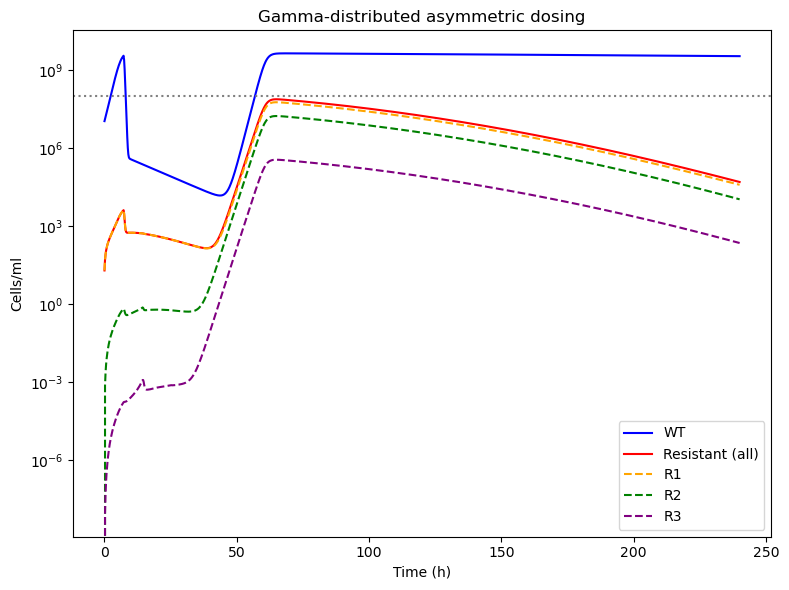

In [106]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt


from scipy.stats import gamma

# Parameters for gamma distribution: shape (k), scale (θ), where mean = kθ, var = kθ²
meanDoseTime = 30
stdDevDoseTime = 15
k = (meanDoseTime / stdDevDoseTime)**2
theta = (stdDevDoseTime**2) / meanDoseTime

# Sample doses
np.random.seed(1)  # for reproducibility
numDoses = 12
doseTimes = np.sort(gamma.rvs(a=k, scale=theta, size=numDoses))
doseTimes = doseTimes[doseTimes <= 240]  # clip to sim time range

# Optionally vary amplitude mildly to simulate inconsistent uptake
# doseAmts = np.random.normal(loc=25, scale=3, size=len(doseTimes)).clip(min=10, max=30)

def drug(t, decayRate, doseTimes, doseAmts):
    return sum(amt * np.exp(-decayRate * (t - tDose)) for tDose, amt in zip(doseTimes, doseAmts) if t >= tDose)

def growthRate(a, mic, gMax, gMin, kappa):
    return gMax - (gMax - gMin) * ((a / mic)**kappa / ((a / mic)**kappa + 1))

def mutationRate(g, m, tau, h):
    return m * g + tau * m * np.exp(-h * g) if g > 0 else 0

def system(t, y, p):
    nw, pw, nr1, pr1, nr2, pr2, nr3, pr3, e = y
    total = sum(y[:8])
    a = drug(t, p['decayRate'], p['doseTimes'], p['doseAmts'])
    b = p['b']

    # Growth
    gW = growthRate(a, p['mic'][0], p['gMax'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    g1 = growthRate(a, p['mic'][1], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    g2 = growthRate(a, p['mic'][2], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    g3 = growthRate(a, p['mic'][3], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])

    muW = mutationRate(gW, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    mu1 = mutationRate(g1, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    mu2 = mutationRate(g2, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muP = p['muP'] if p['mutation'] else 0

    # Dynamics
    dNw = gW * nw - muW * nw - p['jN'] * nw * e
    dPw = - b * pw - muP * pw - p['jP'] * pw * e

    dNr1 = g1 * nr1 - mu1 * nr1 - p['jN'] * nr1 * e
    dPr1 = - b * pr1 - p['jP'] * pr1 * e

    dNr2 = g2 * nr2 - mu2 * nr2 - p['jN'] * nr2 * e
    dPr2 = - b * pr2 - p['jP'] * pr2 * e

    dNr3 = g3 * nr3 - p['jN'] * nr3 * e
    dPr3 = - b * pr3 - p['jP'] * pr3 * e

    # Mutation flows
    dPr1 += muP * pw
    dPr2 += muP * pr1
    dPr3 += muP * pr2
    dNr2 += mu1 * pr1
    dNr3 += mu2 * pr2

    dNr1 += muW * nw
    dNr2 += mu1 * nr1
    dNr3 += mu2 * nr2

    # Recovery from persister
    dNw += b * pw
    dNr1 += b * pr1
    dNr2 += b * pr2
    dNr3 += b * pr3

    dE = p['q'] * (p['emax'] - e) - p['l'] * e
    return [dNw, dPw, dNr1, dPr1, dNr2, dPr2, dNr3, dPr3, dE]

# === Simulation ===
params = {
    'mic': [1, 4, 20, 50],
    'gMax': 1.0,
    'gMaxR': 0.8,
    'gMin': -6.5,
    'kappa': 1.5,
    'c': 5e9,
    'b': 0.1,
    'tau': 10,
    'h': 5,
    'mutation': True,
    'aPeak': 25,
    'doseInterval': 12,
    'decayRate': np.log(2) / 2.5,
    'emax': 1e6,
    'l': 1e-3,
    'q': 3e-4,
    'jN': 5e-6,
    'jP': 5e-8,
    'm': 1.5e-8,
    'muP': 1.5e-4
}

# Store in params
params['doseTimes'] = doseTimes
params['doseAmts'] = doseAmts

# Time and initial state
tspan = (0, 240)
t_eval = np.linspace(*tspan, 1200)
y0 = [1e7, 1e6, 10, 10, 0, 0, 0, 0, 0]

sol = solve_ivp(system, tspan, y0, args=(params,), t_eval=t_eval, method='BDF', atol=1e-10, rtol=1e-8)
y = sol.y

# Plot
plt.figure(figsize=(8, 6))
plt.plot(sol.t, y[0]+y[1], label='WT', color='blue')
plt.plot(sol.t, y[2]+y[3]+y[4]+y[5]+y[6]+y[7], label='Resistant (all)', color='red')
plt.plot(sol.t, y[2]+y[3], '--', label='R1', color='orange')
plt.plot(sol.t, y[4]+y[5], '--', label='R2', color='green')
plt.plot(sol.t, y[6]+y[7], '--', label='R3', color='purple')
plt.axhline(1e8, linestyle=':', color='gray')
plt.yscale('log')
plt.xlabel('Time (h)')
plt.ylabel('Cells/ml')
plt.title('Gamma-distributed asymmetric dosing')
plt.legend()
plt.tight_layout()
plt.show()


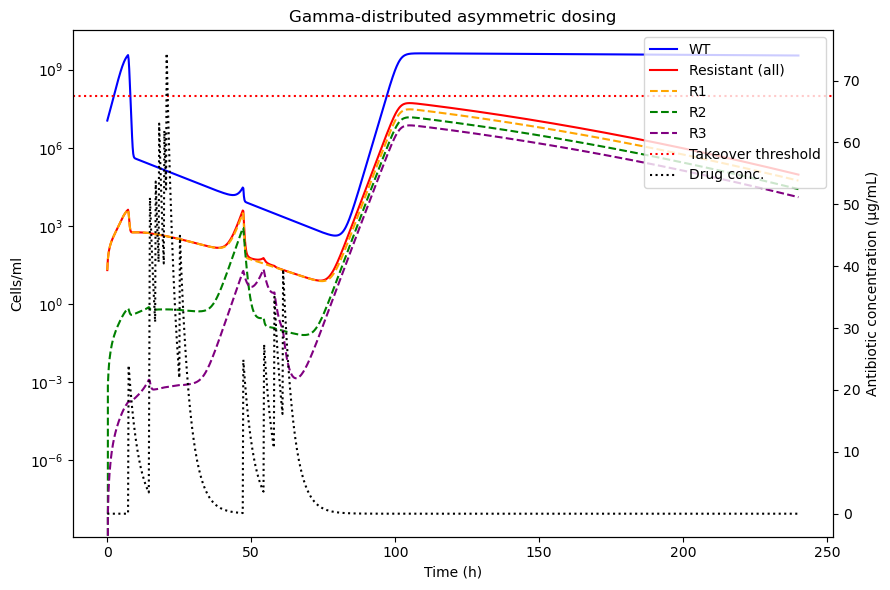

In [108]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt
from scipy.stats import gamma

# Sample asymmetric dose times
meanDoseTime = 30
stdDevDoseTime = 15
k = (meanDoseTime / stdDevDoseTime)**2
theta = (stdDevDoseTime**2) / meanDoseTime

np.random.seed(1)
numDoses = 12
doseTimes = np.sort(gamma.rvs(a=k, scale=theta, size=numDoses))
doseTimes = doseTimes[doseTimes <= 240]

# Fixed amplitudes or jittered, here fixed for clarity
doseAmts = np.full_like(doseTimes, 25.0)

def drug(t, decayRate, doseTimes, doseAmts):
    return sum(amt * np.exp(-decayRate * (t - tDose)) for tDose, amt in zip(doseTimes, doseAmts) if t >= tDose)

def growthRate(a, mic, gMax, gMin, kappa):
    return gMax - (gMax - gMin) * ((a / mic)**kappa / ((a / mic)**kappa + 1))

def mutationRate(g, m, tau, h):
    return m * g + tau * m * np.exp(-h * g) if g > 0 else 0

def system(t, y, p):
    nw, pw, nr1, pr1, nr2, pr2, nr3, pr3, e = y
    total = sum(y[:8])
    a = drug(t, p['decayRate'], p['doseTimes'], p['doseAmts'])
    b = p['b']

    gW = growthRate(a, p['mic'][0], p['gMax'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    g1 = growthRate(a, p['mic'][1], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    g2 = growthRate(a, p['mic'][2], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    g3 = growthRate(a, p['mic'][3], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])

    muW = mutationRate(gW, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    mu1 = mutationRate(g1, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    mu2 = mutationRate(g2, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muP = p['muP'] if p['mutation'] else 0

    dNw = gW * nw - muW * nw - p['jN'] * nw * e
    dPw = - b * pw - muP * pw - p['jP'] * pw * e

    dNr1 = g1 * nr1 - mu1 * nr1 - p['jN'] * nr1 * e
    dPr1 = - b * pr1 - p['jP'] * pr1 * e

    dNr2 = g2 * nr2 - mu2 * nr2 - p['jN'] * nr2 * e
    dPr2 = - b * pr2 - p['jP'] * pr2 * e

    dNr3 = g3 * nr3 - p['jN'] * nr3 * e
    dPr3 = - b * pr3 - p['jP'] * pr3 * e

    dPr1 += muP * pw
    dPr2 += muP * pr1
    dPr3 += muP * pr2
    dNr2 += mu1 * pr1
    dNr3 += mu2 * pr2

    dNr1 += muW * nw
    dNr2 += mu1 * nr1
    dNr3 += mu2 * nr2

    dNw += b * pw
    dNr1 += b * pr1
    dNr2 += b * pr2
    dNr3 += b * pr3

    dE = p['q'] * (p['emax'] - e) - p['l'] * e
    return [dNw, dPw, dNr1, dPr1, dNr2, dPr2, dNr3, dPr3, dE]

params = {
    'mic': [1, 4, 20, 50],
    'gMax': 1.0,
    'gMaxR': 0.8,
    'gMin': -6.5,
    'kappa': 1.5,
    'c': 5e9,
    'b': 0.1,
    'tau': 10,
    'h': 5,
    'mutation': True,
    'aPeak': 25,  # unused but retained for compatibility
    'decayRate': np.log(2) / 2.5,
    'emax': 1e6,
    'l': 1e-3,
    'q': 3e-4,
    'jN': 5e-6,
    'jP': 5e-8,
    'm': 1.5e-8,
    'muP': 1.5e-4,
    'doseTimes': doseTimes,
    'doseAmts': doseAmts
}

tspan = (0, 240)
t_eval = np.linspace(*tspan, 1200)
y0 = [1e7, 1e6, 10, 10, 0, 0, 0, 0, 0]

sol = solve_ivp(system, tspan, y0, args=(params,), t_eval=t_eval, method='BDF', atol=1e-10, rtol=1e-8)
y = sol.y

# Compute drug concentration over time
a_vals = [drug(t, params['decayRate'], params['doseTimes'], params['doseAmts']) for t in sol.t]

# Plot population and drug concentration with dual y-axes
fig, ax1 = plt.subplots(figsize=(9, 6))

# Left y-axis: Population dynamics
ax1.plot(sol.t, y[0]+y[1], label='WT', color='blue')
ax1.plot(sol.t, y[2]+y[3]+y[4]+y[5]+y[6]+y[7], label='Resistant (all)', color='red')
ax1.plot(sol.t, y[2]+y[3], '--', label='R1', color='orange')
ax1.plot(sol.t, y[4]+y[5], '--', label='R2', color='green')
ax1.plot(sol.t, y[6]+y[7], '--', label='R3', color='purple')
ax1.axhline(1e8, linestyle=':', color='red', label='Takeover threshold')
ax1.set_yscale('log')
ax1.set_xlabel('Time (h)')
ax1.set_ylabel('Cells/ml')
ax1.set_title('Gamma-distributed asymmetric dosing')

# Right y-axis: Drug concentration
ax2 = ax1.twinx()
ax2.plot(sol.t, a_vals, label='Drug conc.', color='black', linestyle=':')
ax2.set_ylabel('Antibiotic concentration (µg/mL)')

# Legends
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper right')

plt.tight_layout()
plt.show()


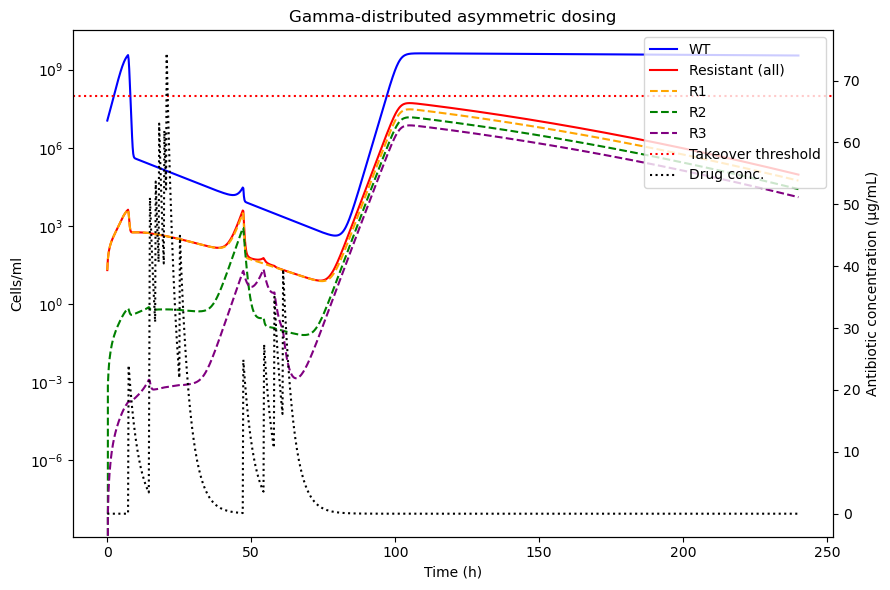

In [116]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt
from scipy.stats import gamma

# Sample asymmetric dose times
meanDoseTime = 30
stdDevDoseTime = 15
k = (meanDoseTime / stdDevDoseTime)**2
theta = (stdDevDoseTime**2) / meanDoseTime

np.random.seed(1)
numDoses = 12
doseTimes = np.sort(gamma.rvs(a=k, scale=theta, size=numDoses))
doseTimes = doseTimes[doseTimes <= 240]

# Fixed amplitudes or jittered, here fixed for clarity
doseAmts = np.full_like(doseTimes, 25.0)

def drug(t, decayRate, doseTimes, doseAmts):
    return sum(amt * np.exp(-decayRate * (t - tDose)) for tDose, amt in zip(doseTimes, doseAmts) if t >= tDose)

def growthRate(a, mic, gMax, gMin, kappa):
    return gMax - (gMax - gMin) * ((a / mic)**kappa / ((a / mic)**kappa + 1))

def mutationRate(g, m, tau, h):
    return m * g + tau * m * np.exp(-h * g) if g > 0 else 0

def system(t, y, p):
    nw, pw, nr1, pr1, nr2, pr2, nr3, pr3, e = y
    total = sum(y[:8])
    a = drug(t, p['decayRate'], p['doseTimes'], p['doseAmts'])
    b = p['b']

    gW = growthRate(a, p['mic'][0], p['gMax'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    g1 = growthRate(a, p['mic'][1], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    g2 = growthRate(a, p['mic'][2], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    g3 = growthRate(a, p['mic'][3], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])

    muW = mutationRate(gW, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    mu1 = mutationRate(g1, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    mu2 = mutationRate(g2, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muP = p['muP'] if p['mutation'] else 0

    dNw = gW * nw - muW * nw - p['jN'] * nw * e
    dPw = - b * pw - muP * pw - p['jP'] * pw * e

    dNr1 = g1 * nr1 - mu1 * nr1 - p['jN'] * nr1 * e
    dPr1 = - b * pr1 - p['jP'] * pr1 * e

    dNr2 = g2 * nr2 - mu2 * nr2 - p['jN'] * nr2 * e
    dPr2 = - b * pr2 - p['jP'] * pr2 * e

    dNr3 = g3 * nr3 - p['jN'] * nr3 * e
    dPr3 = - b * pr3 - p['jP'] * pr3 * e

    dPr1 += muP * pw
    dPr2 += muP * pr1
    dPr3 += muP * pr2
    dNr2 += mu1 * pr1
    dNr3 += mu2 * pr2

    dNr1 += muW * nw
    dNr2 += mu1 * nr1
    dNr3 += mu2 * nr2

    dNw += b * pw
    dNr1 += b * pr1
    dNr2 += b * pr2
    dNr3 += b * pr3

    dE = p['q'] * (p['emax'] - e) - p['l'] * e
    return [dNw, dPw, dNr1, dPr1, dNr2, dPr2, dNr3, dPr3, dE]

params = {
    'mic': [1, 4, 20, 50],
    'gMax': 1.0,
    'gMaxR': 0.8,
    'gMin': -6.5,
    'kappa': 1.5,
    'c': 5e9,
    'b': 0.1,
    'tau': 10,
    'h': 5,
    'mutation': True,
    'aPeak': 25,  # unused but retained for compatibility
    'decayRate': np.log(2) / 2.5,
    'emax': 1e6,
    'l': 1e-3,
    'q': 3e-4,
    'jN': 5e-6,
    'jP': 5e-8,
    'm': 1.5e-8,
    'muP': 1.5e-4,
    'doseTimes': doseTimes,
    'doseAmts': doseAmts
}

tspan = (0, 240)
t_eval = np.linspace(*tspan, 1200)
y0 = [1e7, 1e6, 10, 10, 0, 0, 0, 0, 0]

sol = solve_ivp(system, tspan, y0, args=(params,), t_eval=t_eval, method='BDF', atol=1e-10, rtol=1e-8)
y = sol.y

# Compute drug concentration over time
a_vals = [drug(t, params['decayRate'], params['doseTimes'], params['doseAmts']) for t in sol.t]

# Plot population and drug concentration with dual y-axes
fig, ax1 = plt.subplots(figsize=(9, 6))

# Left y-axis: Population dynamics
ax1.plot(sol.t, y[0]+y[1], label='WT', color='blue')
ax1.plot(sol.t, y[2]+y[3]+y[4]+y[5]+y[6]+y[7], label='Resistant (all)', color='red')
ax1.plot(sol.t, y[2]+y[3], '--', label='R1', color='orange')
ax1.plot(sol.t, y[4]+y[5], '--', label='R2', color='green')
ax1.plot(sol.t, y[6]+y[7], '--', label='R3', color='purple')
ax1.axhline(1e8, linestyle=':', color='red', label='Takeover threshold')
ax1.set_yscale('log')
ax1.set_xlabel('Time (h)')
ax1.set_ylabel('Cells/ml')
ax1.set_title('Gamma-distributed asymmetric dosing')

# Right y-axis: Drug concentration
ax2 = ax1.twinx()
ax2.plot(sol.t, a_vals, label='Drug conc.', color='black', linestyle=':')
ax2.set_ylabel('Antibiotic concentration (µg/mL)')

# Legends
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper right')

plt.tight_layout()
plt.show()


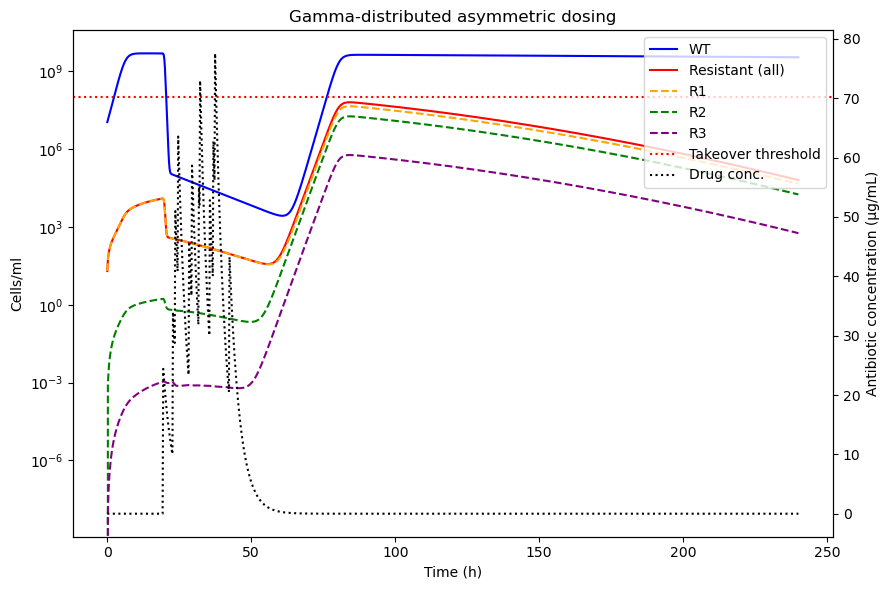

In [118]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt
from scipy.stats import gamma

# Sample asymmetric dose times
meanDoseTime = 30
stdDevDoseTime = 15
k = (meanDoseTime / stdDevDoseTime)**2
theta = (stdDevDoseTime**2) / meanDoseTime

numDoses = 12
doseTimes = np.sort(gamma.rvs(a=k, scale=theta, size=numDoses))
doseTimes = doseTimes[doseTimes <= 240]

# Fixed amplitudes or jittered, here fixed for clarity
doseAmts = np.full_like(doseTimes, 25.0)

def drug(t, decayRate, doseTimes, doseAmts):
    return sum(amt * np.exp(-decayRate * (t - tDose)) for tDose, amt in zip(doseTimes, doseAmts) if t >= tDose)

def growthRate(a, mic, gMax, gMin, kappa):
    return gMax - (gMax - gMin) * ((a / mic)**kappa / ((a / mic)**kappa + 1))

def mutationRate(g, m, tau, h):
    return m * g + tau * m * np.exp(-h * g) if g > 0 else 0

def system(t, y, p):
    nw, pw, nr1, pr1, nr2, pr2, nr3, pr3, e = y
    total = sum(y[:8])
    a = drug(t, p['decayRate'], p['doseTimes'], p['doseAmts'])
    b = p['b']

    gW = growthRate(a, p['mic'][0], p['gMax'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    g1 = growthRate(a, p['mic'][1], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    g2 = growthRate(a, p['mic'][2], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    g3 = growthRate(a, p['mic'][3], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])

    muW = mutationRate(gW, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    mu1 = mutationRate(g1, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    mu2 = mutationRate(g2, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muP = p['muP'] if p['mutation'] else 0

    dNw = gW * nw - muW * nw - p['jN'] * nw * e
    dPw = - b * pw - muP * pw - p['jP'] * pw * e

    dNr1 = g1 * nr1 - mu1 * nr1 - p['jN'] * nr1 * e
    dPr1 = - b * pr1 - p['jP'] * pr1 * e

    dNr2 = g2 * nr2 - mu2 * nr2 - p['jN'] * nr2 * e
    dPr2 = - b * pr2 - p['jP'] * pr2 * e

    dNr3 = g3 * nr3 - p['jN'] * nr3 * e
    dPr3 = - b * pr3 - p['jP'] * pr3 * e

    dPr1 += muP * pw
    dPr2 += muP * pr1
    dPr3 += muP * pr2
    dNr2 += mu1 * pr1
    dNr3 += mu2 * pr2

    dNr1 += muW * nw
    dNr2 += mu1 * nr1
    dNr3 += mu2 * nr2

    dNw += b * pw
    dNr1 += b * pr1
    dNr2 += b * pr2
    dNr3 += b * pr3

    dE = p['q'] * (p['emax'] - e) - p['l'] * e
    return [dNw, dPw, dNr1, dPr1, dNr2, dPr2, dNr3, dPr3, dE]

params = {
    'mic': [1, 4, 20, 50],
    'gMax': 1.0,
    'gMaxR': 0.8,
    'gMin': -6.5,
    'kappa': 1.5,
    'c': 5e9,
    'b': 0.1,
    'tau': 10,
    'h': 5,
    'mutation': True,
    'aPeak': 25,  # unused but retained for compatibility
    'decayRate': np.log(2) / 2.5,
    'emax': 1e6,
    'l': 1e-3,
    'q': 3e-4,
    'jN': 5e-6,
    'jP': 5e-8,
    'm': 1.5e-8,
    'muP': 1.5e-4,
    'doseTimes': doseTimes,
    'doseAmts': doseAmts
}

tspan = (0, 240)
t_eval = np.linspace(*tspan, 1200)
y0 = [1e7, 1e6, 10, 10, 0, 0, 0, 0, 0]

sol = solve_ivp(system, tspan, y0, args=(params,), t_eval=t_eval, method='BDF', atol=1e-10, rtol=1e-8)
y = sol.y

# Compute drug concentration over time
a_vals = [drug(t, params['decayRate'], params['doseTimes'], params['doseAmts']) for t in sol.t]

# Plot population and drug concentration with dual y-axes
fig, ax1 = plt.subplots(figsize=(9, 6))

# Left y-axis: Population dynamics
ax1.plot(sol.t, y[0]+y[1], label='WT', color='blue')
ax1.plot(sol.t, y[2]+y[3]+y[4]+y[5]+y[6]+y[7], label='Resistant (all)', color='red')
ax1.plot(sol.t, y[2]+y[3], '--', label='R1', color='orange')
ax1.plot(sol.t, y[4]+y[5], '--', label='R2', color='green')
ax1.plot(sol.t, y[6]+y[7], '--', label='R3', color='purple')
ax1.axhline(1e8, linestyle=':', color='red', label='Takeover threshold')
ax1.set_yscale('log')
ax1.set_xlabel('Time (h)')
ax1.set_ylabel('Cells/ml')
ax1.set_title('Gamma-distributed asymmetric dosing')

# Right y-axis: Drug concentration
ax2 = ax1.twinx()
ax2.plot(sol.t, a_vals, label='Drug conc.', color='black', linestyle=':')
ax2.set_ylabel('Antibiotic concentration (µg/mL)')

# Legends
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper right')

plt.tight_layout()
plt.show()


In [119]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt
from scipy.stats import gamma

def drug(t, decayRate, doseTimes, doseAmts):
    return sum(amt * np.exp(-decayRate * (t - tDose)) for tDose, amt in zip(doseTimes, doseAmts) if t >= tDose)

def growthRate(a, mic, gMax, gMin, kappa):
    return gMax - (gMax - gMin) * ((a / mic)**kappa / ((a / mic)**kappa + 1))

def mutationRate(g, m, tau, h):
    return m * g + tau * m * np.exp(-h * g) if g > 0 else 0

def system(t, y, p):
    nw, pw, nr1, pr1, nr2, pr2, nr3, pr3, e = y
    total = sum(y[:8])
    a = drug(t, p['decayRate'], p['doseTimes'], p['doseAmts'])
    b = p['b']

    gW = growthRate(a, p['mic'][0], p['gMax'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    g1 = growthRate(a, p['mic'][1], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    g2 = growthRate(a, p['mic'][2], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    g3 = growthRate(a, p['mic'][3], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])

    muW = mutationRate(gW, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    mu1 = mutationRate(g1, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    mu2 = mutationRate(g2, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muP = p['muP'] if p['mutation'] else 0

    dNw = gW * nw - muW * nw - p['jN'] * nw * e
    dPw = - b * pw - muP * pw - p['jP'] * pw * e

    dNr1 = g1 * nr1 - mu1 * nr1 - p['jN'] * nr1 * e
    dPr1 = - b * pr1 - p['jP'] * pr1 * e

    dNr2 = g2 * nr2 - mu2 * nr2 - p['jN'] * nr2 * e
    dPr2 = - b * pr2 - p['jP'] * pr2 * e

    dNr3 = g3 * nr3 - p['jN'] * nr3 * e
    dPr3 = - b * pr3 - p['jP'] * pr3 * e

    dPr1 += muP * pw
    dPr2 += muP * pr1
    dPr3 += muP * pr2
    dNr2 += mu1 * pr1
    dNr3 += mu2 * pr2

    dNr1 += muW * nw
    dNr2 += mu1 * nr1
    dNr3 += mu2 * nr2

    dNw += b * pw
    dNr1 += b * pr1
    dNr2 += b * pr2
    dNr3 += b * pr3

    dE = p['q'] * (p['emax'] - e) - p['l'] * e
    return [dNw, dPw, dNr1, dPr1, dNr2, dPr2, dNr3, dPr3, dE]

# Fixed simulation setup
base_params = {
    'mic': [1, 4, 20, 50],
    'gMax': 1.0,
    'gMaxR': 0.8,
    'gMin': -6.5,
    'kappa': 1.5,
    'c': 5e9,
    'b': 0.1,
    'tau': 10,
    'h': 5,
    'mutation': True,
    'aPeak': 25,
    'decayRate': np.log(2) / 2.5,
    'emax': 1e6,
    'l': 1e-3,
    'q': 3e-4,
    'jN': 5e-6,
    'jP': 5e-8,
    'm': 1.5e-8,
    'muP': 1.5e-4
}

tspan = (0, 240)
t_eval = np.linspace(*tspan, 1200)
y0 = [1e7, 1e6, 10, 10, 0, 0, 0, 0, 0]

# Run simulations
num_runs = 10
wt_wins = 0
r_wins = 0
threshold = 1e8

for i in range(num_runs):
    # Generate random dose times and amplitudes
    k = (30 / 15)**2
    theta = (15**2) / 30
    doseTimes = np.sort(gamma.rvs(a=k, scale=theta, size=12))
    doseTimes = doseTimes[doseTimes <= 240]
    doseAmts = np.random.normal(loc=25, scale=3, size=len(doseTimes)).clip(10, 30)

    params = base_params.copy()
    params['doseTimes'] = doseTimes
    params['doseAmts'] = doseAmts

    sol = solve_ivp(system, tspan, y0, args=(params,), t_eval=t_eval, method='BDF',
                    atol=1e-10, rtol=1e-8)

    wt = sol.y[0] + sol.y[1]
    resistant = sol.y[2] + sol.y[3] + sol.y[4] + sol.y[5] + sol.y[6] + sol.y[7]

    if np.max(wt) > threshold and np.max(resistant) < threshold:
        wt_wins += 1
    elif np.max(resistant) > threshold:
        r_wins += 1

print(f"WT wins: {wt_wins}/{num_runs}")
print(f"Resistant wins: {r_wins}/{num_runs}")


WT wins: 4/10
Resistant wins: 6/10


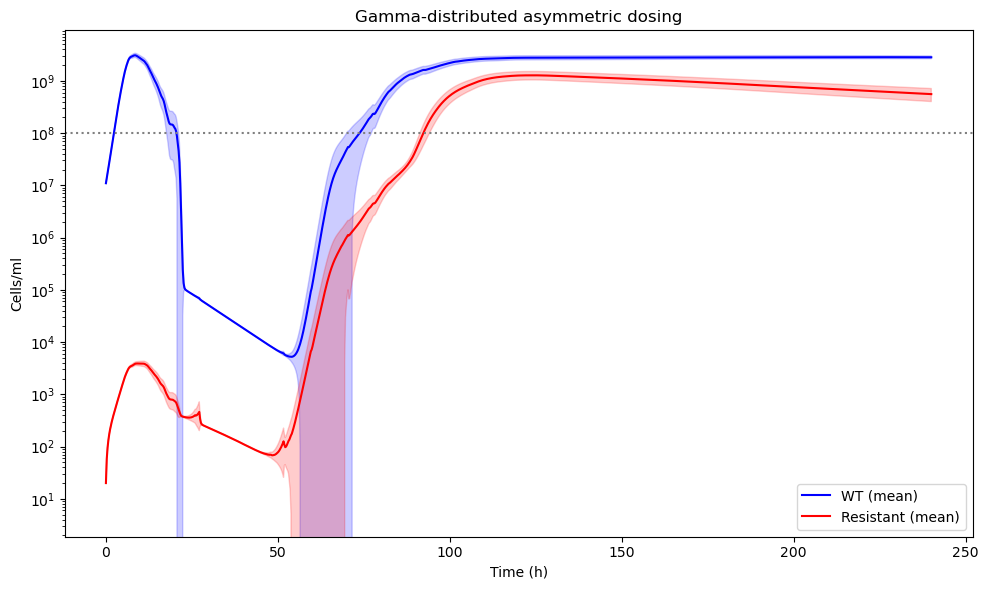

In [123]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt
from scipy.stats import gamma, sem, t

def run_single_sim(params, t_eval, y0):
    def drug(t, decayRate, doseTimes, doseAmts):
        return sum(amt * np.exp(-decayRate * (t - tDose)) for tDose, amt in zip(doseTimes, doseAmts) if t >= tDose)

    def growthRate(a, mic, gMax, gMin, kappa):
        return gMax - (gMax - gMin) * ((a / mic)**kappa / ((a / mic)**kappa + 1))

    def mutationRate(g, m, tau, h):
        return m * g + tau * m * np.exp(-h * g) if g > 0 else 0

    def system(t, y, p):
        nw, pw, nr1, pr1, nr2, pr2, nr3, pr3, e = y
        total = sum(y[:8])
        a = drug(t, p['decayRate'], p['doseTimes'], p['doseAmts'])
        b = p['b']

        gW = growthRate(a, p['mic'][0], p['gMax'], p['gMin'], p['kappa']) * (1 - total / p['c'])
        g1 = growthRate(a, p['mic'][1], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
        g2 = growthRate(a, p['mic'][2], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
        g3 = growthRate(a, p['mic'][3], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])

        muW = mutationRate(gW, p['m'], p['tau'], p['h']) if p['mutation'] else 0
        mu1 = mutationRate(g1, p['m'], p['tau'], p['h']) if p['mutation'] else 0
        mu2 = mutationRate(g2, p['m'], p['tau'], p['h']) if p['mutation'] else 0
        muP = p['muP'] if p['mutation'] else 0

        dNw = gW * nw - muW * nw - p['jN'] * nw * e
        dPw = - b * pw - muP * pw - p['jP'] * pw * e

        dNr1 = g1 * nr1 - mu1 * nr1 - p['jN'] * nr1 * e
        dPr1 = - b * pr1 - p['jP'] * pr1 * e

        dNr2 = g2 * nr2 - mu2 * nr2 - p['jN'] * nr2 * e
        dPr2 = - b * pr2 - p['jP'] * pr2 * e

        dNr3 = g3 * nr3 - p['jN'] * nr3 * e
        dPr3 = - b * pr3 - p['jP'] * pr3 * e

        dPr1 += muP * pw
        dPr2 += muP * pr1
        dPr3 += muP * pr2
        dNr2 += mu1 * pr1
        dNr3 += mu2 * pr2

        dNr1 += muW * nw
        dNr2 += mu1 * nr1
        dNr3 += mu2 * nr2

        dNw += b * pw
        dNr1 += b * pr1
        dNr2 += b * pr2
        dNr3 += b * pr3

        dE = p['q'] * (p['emax'] - e) - p['l'] * e
        return [dNw, dPw, dNr1, dPr1, dNr2, dPr2, dNr3, dPr3, dE]

    sol = solve_ivp(system, (t_eval[0], t_eval[-1]), y0, args=(params,), t_eval=t_eval, method='BDF', atol=1e-10, rtol=1e-8)
    wt = sol.y[0] + sol.y[1]
    resistant = sol.y[2] + sol.y[3] + sol.y[4] + sol.y[5] + sol.y[6] + sol.y[7]
    return wt, resistant

# Simulation settings
num_runs = 200
t_eval = np.linspace(0, 240, 1000)
y0 = [1e7, 1e6, 10, 10, 0, 0, 0, 0, 0]

wt_all = []
res_all = []

for _ in range(num_runs):
    k = (30 / 15)**2
    theta = (15**2) / 30
    doseTimes = np.sort(gamma.rvs(a=k, scale=theta, size=12))
    doseTimes = doseTimes[doseTimes <= 240]
    doseAmts = np.random.normal(loc=25, scale=3, size=len(doseTimes)).clip(10, 30)

    params = {
        'mic': [1, 4, 20, 50],
        'gMax': 1.0,
        'gMaxR': 0.8,
        'gMin': -6.5,
        'kappa': 1.5,
        'c': 5e9,
        'b': 0.1,
        'tau': 10,
        'h': 5,
        'mutation': True,
        'aPeak': 25,
        'decayRate': np.log(2) / 2.5,
        'emax': 1e6,
        'l': 1e-3,
        'q': 3e-4,
        'jN': 5e-6,
        'jP': 5e-8,
        'm': 1.5e-8,
        'muP': 1.5e-4,
        'doseTimes': doseTimes,
        'doseAmts': doseAmts
    }

    wt, res = run_single_sim(params, t_eval, y0)
    wt_all.append(wt)
    res_all.append(res)

# Convert to arrays
wt_all = np.array(wt_all)
res_all = np.array(res_all)

# Mean and 95% CI
wt_mean = wt_all.mean(axis=0)
res_mean = res_all.mean(axis=0)

conf95 = lambda data: 1.96 * sem(data, axis=0)  # 95% CI for large N
wt_ci = conf95(wt_all)
res_ci = conf95(res_all)

# Plot
plt.figure(figsize=(10, 6))
plt.fill_between(t_eval, wt_mean - wt_ci, wt_mean + wt_ci, color='blue', alpha=0.2)
plt.plot(t_eval, wt_mean, label='WT (mean)', color='blue')
plt.fill_between(t_eval, res_mean - res_ci, res_mean + res_ci, color='red', alpha=0.2)
plt.plot(t_eval, res_mean, label='Resistant (mean)', color='red')
plt.axhline(1e8, linestyle=':', color='gray')
plt.yscale('log')
plt.xlabel('Time (h)')
plt.ylabel('Cells/ml')
plt.title('Gamma-distributed asymmetric dosing')
plt.legend()
plt.tight_layout()
plt.show()


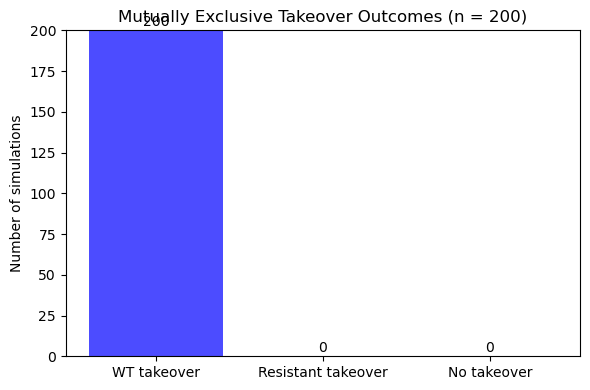

In [127]:
# Define threshold and storage
threshold = 1e8
wt_wins = 0
res_wins = 0
no_takeover = 0

for i in range(num_runs):
    wt = wt_all[i]
    res = res_all[i]

    # Find first time index when each exceeds threshold
    wt_cross_idx = np.argmax(wt > threshold) if np.any(wt > threshold) else np.inf
    res_cross_idx = np.argmax(res > threshold) if np.any(res > threshold) else np.inf

    if wt_cross_idx < res_cross_idx:
        wt_wins += 1
    elif res_cross_idx < wt_cross_idx:
        res_wins += 1
    else:
        no_takeover += 1

# Bar plot
labels = ['WT takeover', 'Resistant takeover', 'No takeover']
counts = [wt_wins, res_wins, no_takeover]

plt.figure(figsize=(6, 4))
colors = ['blue', 'red', 'gray']
bars = plt.bar(labels, counts, color=colors, alpha=0.7)
plt.ylabel('Number of simulations')
plt.title(f'Mutually Exclusive Takeover Outcomes (n = {num_runs})')
plt.ylim(0, num_runs)

for bar, count in zip(bars, counts):
    plt.text(bar.get_x() + bar.get_width() / 2, count + 1, str(count),
             ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()


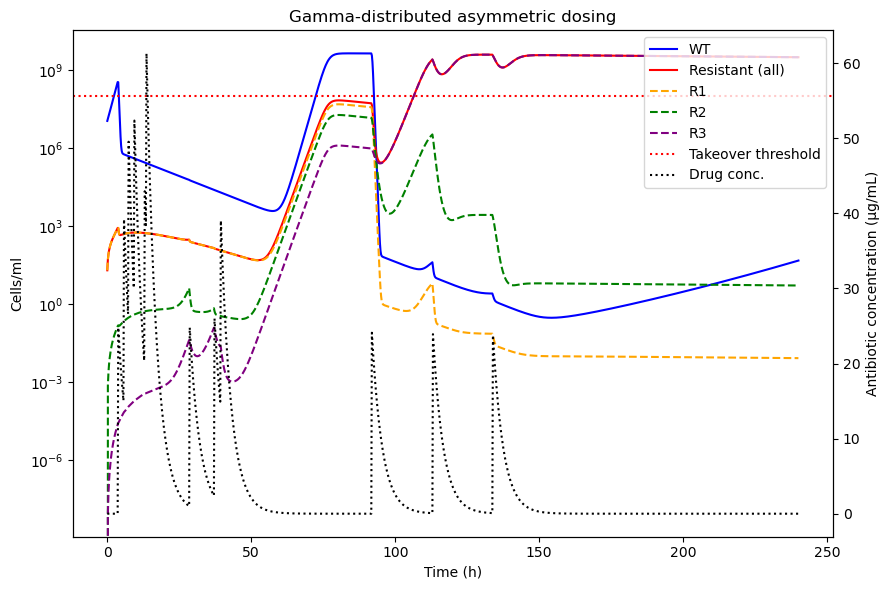

In [6]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt
from scipy.stats import gamma

# Sample asymmetric dose times
meanDoseTime = 30
stdDevDoseTime = 30
k = (meanDoseTime / stdDevDoseTime)**2
theta = (stdDevDoseTime**2) / meanDoseTime

numDoses = 12
doseTimes = np.sort(gamma.rvs(a=k, scale=theta, size=numDoses))
doseTimes = doseTimes[doseTimes <= 240]

# Fixed amplitudes or jittered, here fixed for clarity
doseAmts = np.full_like(doseTimes, 25.0)

def drug(t, decayRate, doseTimes, doseAmts):
    return sum(amt * np.exp(-decayRate * (t - tDose)) for tDose, amt in zip(doseTimes, doseAmts) if t >= tDose)

def growthRate(a, mic, gMax, gMin, kappa):
    return gMax - (gMax - gMin) * ((a / mic)**kappa / ((a / mic)**kappa + 1))

def mutationRate(g, m, tau, h):
    return m * g + tau * m * np.exp(-h * g) if g > 0 else 0

def system(t, y, p):
    nw, pw, nr1, pr1, nr2, pr2, nr3, pr3, e = y
    total = sum(y[:8])
    a = drug(t, p['decayRate'], p['doseTimes'], p['doseAmts'])
    b = p['b']

    gW = growthRate(a, p['mic'][0], p['gMax'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    g1 = growthRate(a, p['mic'][1], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    g2 = growthRate(a, p['mic'][2], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    g3 = growthRate(a, p['mic'][3], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])

    muW = mutationRate(gW, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    mu1 = mutationRate(g1, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    mu2 = mutationRate(g2, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muP = p['muP'] if p['mutation'] else 0

    dNw = gW * nw - muW * nw - p['jN'] * nw * e
    dPw = - b * pw - muP * pw - p['jP'] * pw * e

    dNr1 = g1 * nr1 - mu1 * nr1 - p['jN'] * nr1 * e
    dPr1 = - b * pr1 - p['jP'] * pr1 * e

    dNr2 = g2 * nr2 - mu2 * nr2 - p['jN'] * nr2 * e
    dPr2 = - b * pr2 - p['jP'] * pr2 * e

    dNr3 = g3 * nr3 - p['jN'] * nr3 * e
    dPr3 = - b * pr3 - p['jP'] * pr3 * e

    dPr1 += muP * pw
    dPr2 += muP * pr1
    dPr3 += muP * pr2
    dNr2 += mu1 * pr1
    dNr3 += mu2 * pr2

    dNr1 += muW * nw
    dNr2 += mu1 * nr1
    dNr3 += mu2 * nr2

    dNw += b * pw
    dNr1 += b * pr1
    dNr2 += b * pr2
    dNr3 += b * pr3

    dE = p['q'] * (p['emax'] - e) - p['l'] * e
    return [dNw, dPw, dNr1, dPr1, dNr2, dPr2, dNr3, dPr3, dE]

params = {
    'mic': [1, 4, 20, 50],
    'gMax': 1.0,
    'gMaxR': 0.8,
    'gMin': -6.5,
    'kappa': 1.5,
    'c': 5e9,
    'b': 0.1,
    'tau': 10,
    'h': 5,
    'mutation': True,
    'aPeak': 25,  # unused but retained for compatibility
    'decayRate': np.log(2) / 2.5,
    'emax': 1e6,
    'l': 1e-3,
    'q': 3e-4,
    'jN': 5e-6,
    'jP': 5e-8,
    'm': 1.5e-8,
    'muP': 1.5e-4,
    'doseTimes': doseTimes,
    'doseAmts': doseAmts
}

tspan = (0, 240)
t_eval = np.linspace(*tspan, 1200)
y0 = [1e7, 1e6, 10, 10, 0, 0, 0, 0, 0]

sol = solve_ivp(system, tspan, y0, args=(params,), t_eval=t_eval, method='BDF', atol=1e-10, rtol=1e-8)
y = sol.y

# Compute drug concentration over time
a_vals = [drug(t, params['decayRate'], params['doseTimes'], params['doseAmts']) for t in sol.t]

# Plot population and drug concentration with dual y-axes
fig, ax1 = plt.subplots(figsize=(9, 6))

# Left y-axis: Population dynamics
ax1.plot(sol.t, y[0]+y[1], label='WT', color='blue')
ax1.plot(sol.t, y[2]+y[3]+y[4]+y[5]+y[6]+y[7], label='Resistant (all)', color='red')
ax1.plot(sol.t, y[2]+y[3], '--', label='R1', color='orange')
ax1.plot(sol.t, y[4]+y[5], '--', label='R2', color='green')
ax1.plot(sol.t, y[6]+y[7], '--', label='R3', color='purple')
ax1.axhline(1e8, linestyle=':', color='red', label='Takeover threshold')
ax1.set_yscale('log')
ax1.set_xlabel('Time (h)')
ax1.set_ylabel('Cells/ml')
ax1.set_title('Gamma-distributed asymmetric dosing')

# Right y-axis: Drug concentration
ax2 = ax1.twinx()
ax2.plot(sol.t, a_vals, label='Drug conc.', color='black', linestyle=':')
ax2.set_ylabel('Antibiotic concentration (µg/mL)')

# Legends
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper right')

plt.tight_layout()
plt.show()


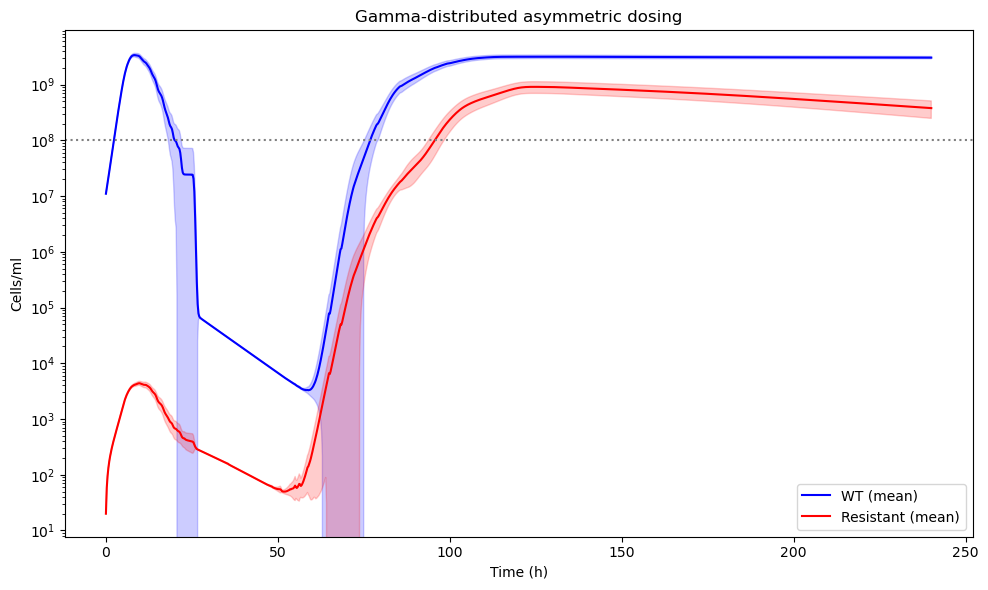

In [2]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt
from scipy.stats import gamma, sem, t

def run_single_sim(params, t_eval, y0):
    def drug(t, decayRate, doseTimes, doseAmts):
        return sum(amt * np.exp(-decayRate * (t - tDose)) for tDose, amt in zip(doseTimes, doseAmts) if t >= tDose)

    def growthRate(a, mic, gMax, gMin, kappa):
        return gMax - (gMax - gMin) * ((a / mic)**kappa / ((a / mic)**kappa + 1))

    def mutationRate(g, m, tau, h):
        return m * g + tau * m * np.exp(-h * g) if g > 0 else 0

    def system(t, y, p):
        nw, pw, nr1, pr1, nr2, pr2, nr3, pr3, e = y
        total = sum(y[:8])
        a = drug(t, p['decayRate'], p['doseTimes'], p['doseAmts'])
        b = p['b']

        gW = growthRate(a, p['mic'][0], p['gMax'], p['gMin'], p['kappa']) * (1 - total / p['c'])
        g1 = growthRate(a, p['mic'][1], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
        g2 = growthRate(a, p['mic'][2], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
        g3 = growthRate(a, p['mic'][3], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])

        muW = mutationRate(gW, p['m'], p['tau'], p['h']) if p['mutation'] else 0
        mu1 = mutationRate(g1, p['m'], p['tau'], p['h']) if p['mutation'] else 0
        mu2 = mutationRate(g2, p['m'], p['tau'], p['h']) if p['mutation'] else 0
        muP = p['muP'] if p['mutation'] else 0

        dNw = gW * nw - muW * nw - p['jN'] * nw * e
        dPw = - b * pw - muP * pw - p['jP'] * pw * e

        dNr1 = g1 * nr1 - mu1 * nr1 - p['jN'] * nr1 * e
        dPr1 = - b * pr1 - p['jP'] * pr1 * e

        dNr2 = g2 * nr2 - mu2 * nr2 - p['jN'] * nr2 * e
        dPr2 = - b * pr2 - p['jP'] * pr2 * e

        dNr3 = g3 * nr3 - p['jN'] * nr3 * e
        dPr3 = - b * pr3 - p['jP'] * pr3 * e

        dPr1 += muP * pw
        dPr2 += muP * pr1
        dPr3 += muP * pr2
        dNr2 += mu1 * pr1
        dNr3 += mu2 * pr2

        dNr1 += muW * nw
        dNr2 += mu1 * nr1
        dNr3 += mu2 * nr2

        dNw += b * pw
        dNr1 += b * pr1
        dNr2 += b * pr2
        dNr3 += b * pr3

        dE = p['q'] * (p['emax'] - e) - p['l'] * e
        return [dNw, dPw, dNr1, dPr1, dNr2, dPr2, dNr3, dPr3, dE]

    sol = solve_ivp(system, (t_eval[0], t_eval[-1]), y0, args=(params,), t_eval=t_eval, method='BDF', atol=1e-10, rtol=1e-8)
    wt = sol.y[0] + sol.y[1]
    resistant = sol.y[2] + sol.y[3] + sol.y[4] + sol.y[5] + sol.y[6] + sol.y[7]
    return wt, resistant

# Simulation settings
num_runs = 200
t_eval = np.linspace(0, 240, 1000)
y0 = [1e7, 1e6, 10, 10, 0, 0, 0, 0, 0]

wt_all = []
res_all = []

for _ in range(num_runs):
    k = (30 / 15)**2
    theta = (15**2) / 30
    doseTimes = np.sort(gamma.rvs(a=k, scale=theta, size=12))
    doseTimes = doseTimes[doseTimes <= 240]
    doseAmts = np.random.normal(loc=25, scale=3, size=len(doseTimes)).clip(10, 30)

    params = {
        'mic': [1, 4, 20, 50],
        'gMax': 1.0,
        'gMaxR': 0.8,
        'gMin': -6.5,
        'kappa': 1.5,
        'c': 5e9,
        'b': 0.1,
        'tau': 10,
        'h': 5,
        'mutation': True,
        'aPeak': 25,
        'decayRate': np.log(2) / 2.5,
        'emax': 1e6,
        'l': 1e-3,
        'q': 3e-4,
        'jN': 5e-6,
        'jP': 5e-8,
        'm': 1.5e-8,
        'muP': 1.5e-4,
        'doseTimes': doseTimes,
        'doseAmts': doseAmts
    }

    wt, res = run_single_sim(params, t_eval, y0)
    wt_all.append(wt)
    res_all.append(res)

# Convert to arrays
wt_all = np.array(wt_all)
res_all = np.array(res_all)

# Mean and 95% CI
wt_mean = wt_all.mean(axis=0)
res_mean = res_all.mean(axis=0)

conf95 = lambda data: 1.96 * sem(data, axis=0)  # 95% CI for large N
wt_ci = conf95(wt_all)
res_ci = conf95(res_all)

# Plot
plt.figure(figsize=(10, 6))
plt.fill_between(t_eval, wt_mean - wt_ci, wt_mean + wt_ci, color='blue', alpha=0.2)
plt.plot(t_eval, wt_mean, label='WT (mean)', color='blue')
plt.fill_between(t_eval, res_mean - res_ci, res_mean + res_ci, color='red', alpha=0.2)
plt.plot(t_eval, res_mean, label='Resistant (mean)', color='red')
plt.axhline(1e8, linestyle=':', color='gray')
plt.yscale('log')
plt.xlabel('Time (h)')
plt.ylabel('Cells/ml')
plt.title('Gamma-distributed asymmetric dosing')
plt.legend()
plt.tight_layout()
plt.show()


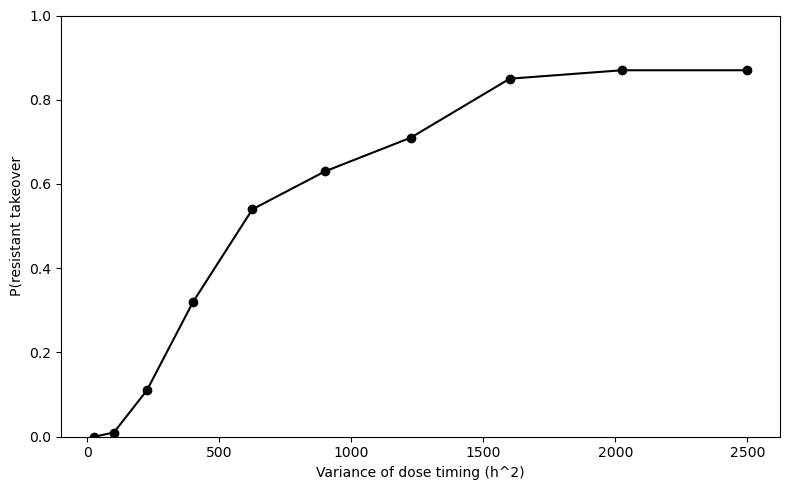

In [ ]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt
from scipy.stats import gamma

def run_sim_and_get_final_winner(std, mean_time=30, num_doses=12, t_eval=None, y0=None, threshold=1e8):
    k = (mean_time / std)**2
    theta = (std**2) / mean_time

    doseTimes = np.sort(gamma.rvs(a=k, scale=theta, size=num_doses))
    doseTimes = doseTimes[doseTimes <= t_eval[-1]]
    doseAmts = np.random.normal(loc=25, scale=3, size=len(doseTimes)).clip(10, 30)

    params = {
        'mic': [1, 4, 20, 50],
        'gMax': 1.0,
        'gMaxR': 0.8,
        'gMin': -6.5,
        'kappa': 1.5,
        'c': 5e9,
        'b': 0.1,
        'tau': 10,
        'h': 5,
        'mutation': True,
        'aPeak': 25,
        'decayRate': np.log(2) / 2.5,
        'emax': 1e6,
        'l': 1e-3,
        'q': 3e-4,
        'jN': 5e-6,
        'jP': 5e-8,
        'm': 1.5e-8,
        'muP': 1.5e-4,
        'doseTimes': doseTimes,
        'doseAmts': doseAmts
    }

    def drug(t, decayRate, doseTimes, doseAmts):
        return sum(amt * np.exp(-decayRate * (t - tDose)) for tDose, amt in zip(doseTimes, doseAmts) if t >= tDose)

    def growthRate(a, mic, gMax, gMin, kappa):
        return gMax - (gMax - gMin) * ((a / mic)**kappa / ((a / mic)**kappa + 1))

    def mutationRate(g, m, tau, h):
        return m * g + tau * m * np.exp(-h * g) if g > 0 else 0

    def system(t, y, p):
        nw, pw, nr1, pr1, nr2, pr2, nr3, pr3, e = y
        total = sum(y[:8])
        a = drug(t, p['decayRate'], p['doseTimes'], p['doseAmts'])
        b = p['b']

        gW = growthRate(a, p['mic'][0], p['gMax'], p['gMin'], p['kappa']) * (1 - total / p['c'])
        g1 = growthRate(a, p['mic'][1], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
        g2 = growthRate(a, p['mic'][2], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
        g3 = growthRate(a, p['mic'][3], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])

        muW = mutationRate(gW, p['m'], p['tau'], p['h']) if p['mutation'] else 0
        mu1 = mutationRate(g1, p['m'], p['tau'], p['h']) if p['mutation'] else 0
        mu2 = mutationRate(g2, p['m'], p['tau'], p['h']) if p['mutation'] else 0
        muP = p['muP'] if p['mutation'] else 0

        dNw = gW * nw - muW * nw - p['jN'] * nw * e
        dPw = - b * pw - muP * pw - p['jP'] * pw * e

        dNr1 = g1 * nr1 - mu1 * nr1 - p['jN'] * nr1 * e
        dPr1 = - b * pr1 - p['jP'] * pr1 * e

        dNr2 = g2 * nr2 - mu2 * nr2 - p['jN'] * nr2 * e
        dPr2 = - b * pr2 - p['jP'] * pr2 * e

        dNr3 = g3 * nr3 - p['jN'] * nr3 * e
        dPr3 = - b * pr3 - p['jP'] * pr3 * e

        dPr1 += muP * pw
        dPr2 += muP * pr1
        dPr3 += muP * pr2
        dNr2 += mu1 * pr1
        dNr3 += mu2 * pr2

        dNr1 += muW * nw
        dNr2 += mu1 * nr1
        dNr3 += mu2 * nr2

        dNw += b * pw
        dNr1 += b * pr1
        dNr2 += b * pr2
        dNr3 += b * pr3

        dE = p['q'] * (p['emax'] - e) - p['l'] * e
        return [dNw, dPw, dNr1, dPr1, dNr2, dPr2, dNr3, dPr3, dE]

    sol = solve_ivp(system, (t_eval[0], t_eval[-1]), y0, args=(params,), t_eval=t_eval, method='BDF',
                    atol=1e-10, rtol=1e-8)

    # Final populations
    wt_final = sol.y[0, -1] + sol.y[1, -1]
    res_final = np.sum(sol.y[2:8, -1])

    if wt_final < threshold and res_final < threshold:
        return 'no takeover'
    elif res_final > wt_final:
        return 'resistant'
    else:
        return 'wt'

# === Sweep and Plot ===
std_devs = np.linspace(5, 50, 10)
num_trials = 100
t_eval = np.linspace(0, 240, 1000)
y0 = [1e7, 1e6, 10, 10, 0, 0, 0, 0, 0]

res_frac = []

for std in std_devs:
    outcomes = [run_sim_and_get_final_winner(std, t_eval=t_eval, y0=y0) for _ in range(num_trials)]
    resistant_wins = outcomes.count('resistant')
    res_frac.append(resistant_wins / num_trials)

# === Plot ===
plt.figure(figsize=(8, 5))
plt.plot(std_devs**2, res_frac, marker='o', color='black')
plt.xlabel('Variance of dose timing (h^2)')
plt.ylabel('P(resistant takeover')
plt.ylim(0, 1)
plt.tight_layout()
plt.show()


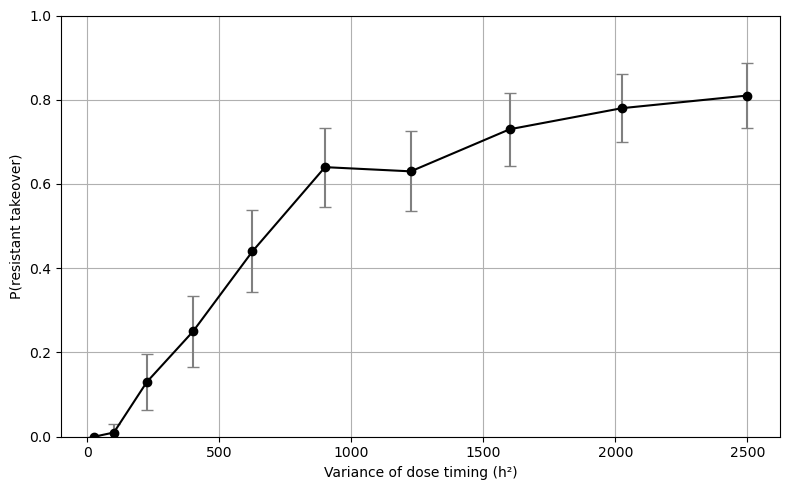

In [14]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt
from scipy.stats import gamma

def run_sim_and_get_final_winner(std, mean_time=30, num_doses=12, t_eval=None, y0=None, threshold=1e8):
    k = (mean_time / std)**2
    theta = (std**2) / mean_time

    doseTimes = np.sort(gamma.rvs(a=k, scale=theta, size=num_doses))
    doseTimes = doseTimes[doseTimes <= t_eval[-1]]
    doseAmts = np.random.normal(loc=25, scale=3, size=len(doseTimes)).clip(10, 30)

    params = {
        'mic': [1, 4, 20, 50],
        'gMax': 1.0,
        'gMaxR': 0.8,
        'gMin': -6.5,
        'kappa': 1.5,
        'c': 5e9,
        'b': 0.1,
        'tau': 10,
        'h': 5,
        'mutation': True,
        'aPeak': 25,
        'decayRate': np.log(2) / 2.5,
        'emax': 1e6,
        'l': 1e-3,
        'q': 3e-4,
        'jN': 5e-6,
        'jP': 5e-8,
        'm': 1.5e-8,
        'muP': 1.5e-4,
        'doseTimes': doseTimes,
        'doseAmts': doseAmts
    }

    def drug(t, decayRate, doseTimes, doseAmts):
        return sum(amt * np.exp(-decayRate * (t - tDose)) for tDose, amt in zip(doseTimes, doseAmts) if t >= tDose)

    def growthRate(a, mic, gMax, gMin, kappa):
        return gMax - (gMax - gMin) * ((a / mic)**kappa / ((a / mic)**kappa + 1))

    def mutationRate(g, m, tau, h):
        return m * g + tau * m * np.exp(-h * g) if g > 0 else 0

    def system(t, y, p):
        nw, pw, nr1, pr1, nr2, pr2, nr3, pr3, e = y
        total = sum(y[:8])
        a = drug(t, p['decayRate'], p['doseTimes'], p['doseAmts'])
        b = p['b']

        gW = growthRate(a, p['mic'][0], p['gMax'], p['gMin'], p['kappa']) * (1 - total / p['c'])
        g1 = growthRate(a, p['mic'][1], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
        g2 = growthRate(a, p['mic'][2], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
        g3 = growthRate(a, p['mic'][3], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])

        muW = mutationRate(gW, p['m'], p['tau'], p['h']) if p['mutation'] else 0
        mu1 = mutationRate(g1, p['m'], p['tau'], p['h']) if p['mutation'] else 0
        mu2 = mutationRate(g2, p['m'], p['tau'], p['h']) if p['mutation'] else 0
        muP = p['muP'] if p['mutation'] else 0

        dNw = gW * nw - muW * nw - p['jN'] * nw * e
        dPw = - b * pw - muP * pw - p['jP'] * pw * e

        dNr1 = g1 * nr1 - mu1 * nr1 - p['jN'] * nr1 * e
        dPr1 = - b * pr1 - p['jP'] * pr1 * e

        dNr2 = g2 * nr2 - mu2 * nr2 - p['jN'] * nr2 * e
        dPr2 = - b * pr2 - p['jP'] * pr2 * e

        dNr3 = g3 * nr3 - p['jN'] * nr3 * e
        dPr3 = - b * pr3 - p['jP'] * pr3 * e

        dPr1 += muP * pw
        dPr2 += muP * pr1
        dPr3 += muP * pr2
        dNr2 += mu1 * pr1
        dNr3 += mu2 * pr2

        dNr1 += muW * nw
        dNr2 += mu1 * nr1
        dNr3 += mu2 * nr2

        dNw += b * pw
        dNr1 += b * pr1
        dNr2 += b * pr2
        dNr3 += b * pr3

        dE = p['q'] * (p['emax'] - e) - p['l'] * e
        return [dNw, dPw, dNr1, dPr1, dNr2, dPr2, dNr3, dPr3, dE]

    sol = solve_ivp(system, (t_eval[0], t_eval[-1]), y0, args=(params,), t_eval=t_eval, method='BDF',
                    atol=1e-10, rtol=1e-8)

    # Final populations
    wt_final = sol.y[0, -1] + sol.y[1, -1]
    res_final = np.sum(sol.y[2:8, -1])
    
    if wt_final < threshold and res_final < threshold:
        return 'no takeover'
    elif res_final > wt_final:
        return 'resistant'
    else:
        return 'wt'


# === Sweep and Plot ===
std_devs = np.linspace(5, 50, 10)
num_trials = 100
t_eval = np.linspace(0, 240, 1000)
y0 = [1e7, 1e6, 10, 10, 0, 0, 0, 0, 0]

# Store confidence intervals
res_frac = []
res_ci95 = []

for std in std_devs:
    outcomes = [run_sim_and_get_final_winner(std, t_eval=t_eval, y0=y0) for _ in range(num_trials)]
    resistant_wins = outcomes.count('resistant')
    p_hat = resistant_wins / num_trials
    se = np.sqrt(p_hat * (1 - p_hat) / num_trials)
    ci95 = 1.96 * se

    res_frac.append(p_hat)
    res_ci95.append(ci95)

    
# === Plot ===
# === Plot ===
plt.figure(figsize=(8, 5))
plt.errorbar(std_devs**2, res_frac, yerr=res_ci95, fmt='o-', color='black', capsize=4, ecolor='gray')
plt.xlabel('Variance of dose timing (h²)')
plt.ylabel('P(resistant takeover)')
plt.ylim(0, 1)
plt.grid(True)
plt.tight_layout()
plt.show()


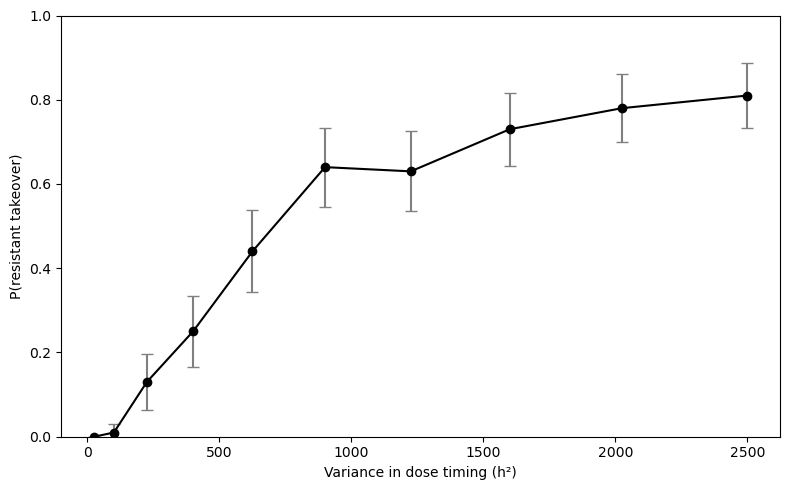

In [15]:
plt.figure(figsize=(8, 5))
plt.errorbar(std_devs**2, res_frac, yerr=res_ci95, fmt='o-', color='black', capsize=4, ecolor='gray')
plt.xlabel('Variance in dose timing (h²)')
plt.ylabel('P(resistant takeover)')
plt.ylim(0, 1)
plt.tight_layout()
plt.show()


<>:145: SyntaxWarning: invalid escape sequence '\m'
<>:145: SyntaxWarning: invalid escape sequence '\m'
<>:147: SyntaxWarning: invalid escape sequence '\m'
<>:147: SyntaxWarning: invalid escape sequence '\m'
<>:145: SyntaxWarning: invalid escape sequence '\m'
<>:145: SyntaxWarning: invalid escape sequence '\m'
<>:147: SyntaxWarning: invalid escape sequence '\m'
<>:147: SyntaxWarning: invalid escape sequence '\m'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/3827473516.py:145: SyntaxWarning: invalid escape sequence '\m'
  label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nTakeover at {takeover_time:.0f}h'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/3827473516.py:145: SyntaxWarning: invalid escape sequence '\m'
  label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nTakeover at {takeover_time:.0f}h'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/3827473516.py:147: SyntaxWarning: invalid escape sequence '\m'
  l

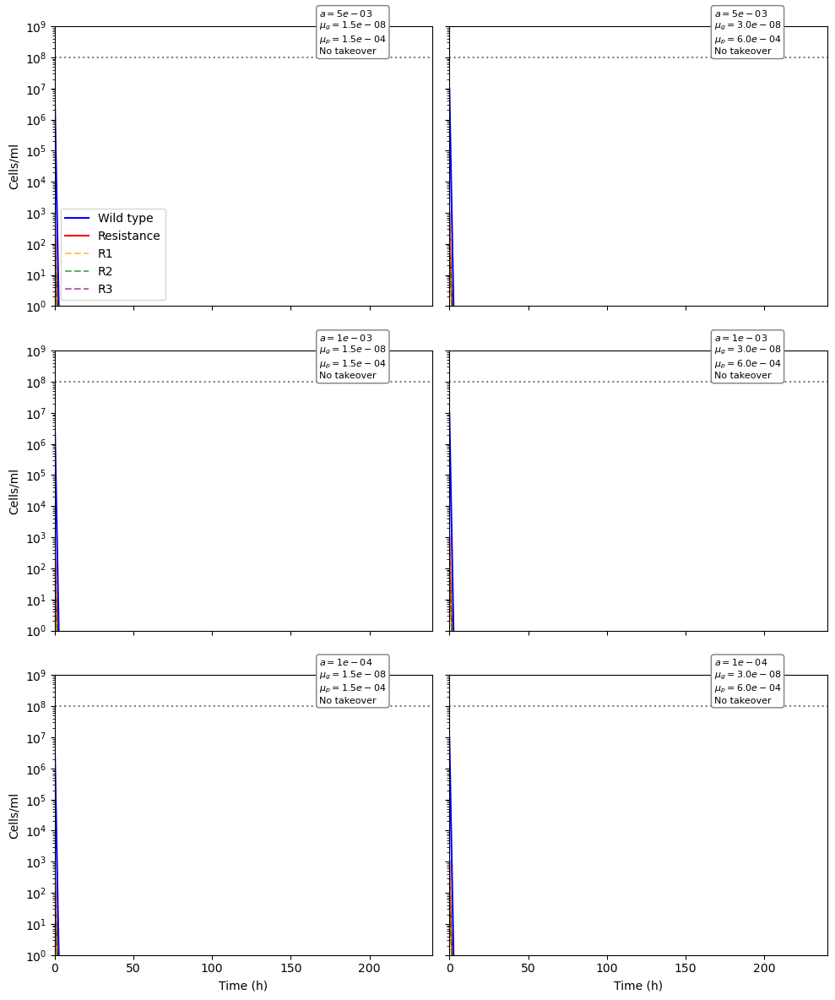

In [89]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt

# Drug concentration over time with decay
def drug(t, decayRate, doseInterval, aPeak):
    dose_times = np.arange(0, t + 1, doseInterval)
    return np.sum([aPeak * np.exp(-decayRate * (t - d)) for d in dose_times if d <= t])

# Hill-like growth rate suppression function
def growth_rate(a, mic, gMax, gMin, kappa):
    return gMax - (gMax - gMin) * ((a / mic) ** kappa / ((a / mic) ** kappa + 1))

# Mutation rate from normal growth or stressed condition
def mutation_rate(g, m, tau, h):
    return m * g + tau * m * np.exp(-h * g) if g > 0 else 0

# Core ODE system
def system(t, y, p):
    nw, pw, nr1, pr1, nr2, pr2, nr3, pr3, e = y
    total = nw + pw + nr1 + pr1 + nr2 + pr2 + nr3 + pr3
    a = drug(t, p['decayRate'], p['doseInterval'], p['aPeak'])
    b = p['b']

    # Growth terms
    gWt = growth_rate(a, p['mic'][0], p['gMax'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR1 = growth_rate(a, p['mic'][1], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR2 = growth_rate(a, p['mic'][2], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR3 = growth_rate(a, p['mic'][3], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])

    # Mutation terms
    muW = mutation_rate(gWt, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muR1 = mutation_rate(gR1, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muR2 = mutation_rate(gR2, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muP = p['muP'] if p['mutation'] else 0

    # ODEs
    dNw = gWt * nw - muW * nw - p['jN'] * nw * e
    dPw = -b * pw - muP * pw - p['jP'] * pw * e

    dNr1 = gR1 * nr1 - muR1 * nr1 - p['jN'] * nr1 * e
    dPr1 = -b * pr1 - p['jP'] * pr1 * e

    dNr2 = gR2 * nr2 - muR2 * nr2 - p['jN'] * nr2 * e
    dPr2 = -b * pr2 - p['jP'] * pr2 * e

    dNr3 = gR3 * nr3 - p['jN'] * nr3 * e
    dPr3 = -b * pr3 - p['jP'] * pr3 * e

    # Mutation flows
    dPr1 += muP * pw
    dPr2 += muP * pr1
    dPr3 += muP * pr2
    dNr2 += muR1 * pr1
    dNr3 += muR2 * pr2

    dNr1 += muW * nw
    dNr2 += muR1 * nr1
    dNr3 += muR2 * nr2

    # Back conversion from persisters
    dNw += b * pw
    dNr1 += b * pr1
    dNr2 += b * pr2
    dNr3 += b * pr3

    # Immune effector
    dE = p['q'] * (p['emax'] - e) - p['l'] * e

    return [dNw, dPw, dNr1, dPr1, dNr2, dPr2, dNr3, dPr3, dE]

# --- Parameters ---
baseParams = {
    'mic': [1, 4, 20, 50],
    'gMax': 1.0,
    'gMaxR': 0.95,
    'gMin': -6.5,
    'kappa': 1.0,
    'c': 5e9,
    'b': 0.1,
    'tau': 2,
    'h': 5,
    'aPeak': 25,
    'doseInterval': 12,
    'decayRate': np.log(2) / 2.5,
    'emax': 1e6,
    'l': 1e-3,
    'q': 3e-4,
    'jN': 5e-6,
    'jP': 5e-8
}

aVals = [5e-3, 1e-3, 1e-4]
mutationVals = [(1.5e-8, 1.5e-4), (3e-8, 6e-4)]

t_pre_span = (0, 100)
t_main_span = (0, 140)

# --- Plotting setup ---
fig, axs = plt.subplots(3, 2, figsize=(10, 12), sharex=True, sharey=True)

# Initial condition: seed WT and small R1, R2
y0_init = [1e7, 0, 1e3, 0, 1e2, 0, 0, 0, 0]

for i, aMax in enumerate(aVals):
    for j, (muG, muP) in enumerate(mutationVals):
        p = baseParams.copy()
        p['aMax'] = aMax
        p['m'] = muG
        p['muP'] = muP
        p['mutation'] = False

        t_pre_eval = np.linspace(*t_pre_span, 300)
        sol_pre = solve_ivp(system, t_pre_span, y0_init, t_eval=t_pre_eval, args=(p,), method='BDF')
        y_pre, t_pre = sol_pre.y, sol_pre.t

        p['mutation'] = True
        main_start = t_pre_span[1]
        t_main_eval = np.linspace(main_start, main_start + t_main_span[1], 700)
        sol_main = solve_ivp(system, (main_start, main_start + t_main_span[1]), y_pre[:, -1],
                             t_eval=t_main_eval, args=(p,), method='BDF', atol=1e-12, rtol=1e-9)
        y_main, t_main = sol_main.y, sol_main.t

        y_all = np.concatenate([y_pre, y_main], axis=1)
        t_all = np.concatenate([t_pre, t_main])
        y_all = np.maximum(y_all, 1e-3)

        # Plotting
        wt = y_all[0] + y_all[1]
        r1 = y_all[2] + y_all[3]
        r2 = y_all[4] + y_all[5]
        r3 = y_all[6] + y_all[7]
        rs = r1 + r2 + r3

        ax = axs[i, j]
        ax.plot(t_all, wt, color='blue', label='Wild type')
        ax.plot(t_all, rs, color='red', label='Resistance')
        ax.plot(t_all, r1, '--', color='orange', alpha=0.6, label='R1' if i == 0 and j == 0 else None)
        ax.plot(t_all, r2, '--', color='green', alpha=0.6, label='R2' if i == 0 and j == 0 else None)
        ax.plot(t_all, r3, '--', color='purple', alpha=0.6, label='R3' if i == 0 and j == 0 else None)

        ax.axhline(1e8, linestyle=':', color='gray')
        if np.any(rs > 1e8):
            takeover_time = t_all[np.argmax(rs > 1e8)]
            label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nTakeover at {takeover_time:.0f}h'
        else:
            label = f'$a={aMax:.0e}$\n$\mu_g={muG:.1e}$\n$\mu_p={muP:.1e}$\nNo takeover'

        ax.text(0.70, 0.9, label, transform=ax.transAxes,
                bbox=dict(facecolor='white', edgecolor='gray', boxstyle='round'), fontsize=8)

        ax.set_yscale('log')
        ax.set_xlim(0, 240)
        ax.set_ylim(1, 1e9)
        if i == 2: ax.set_xlabel('Time (h)')
        if j == 0: ax.set_ylabel('Cells/ml')
        if i == 0 and j == 0: ax.legend()

plt.tight_layout()
plt.show()


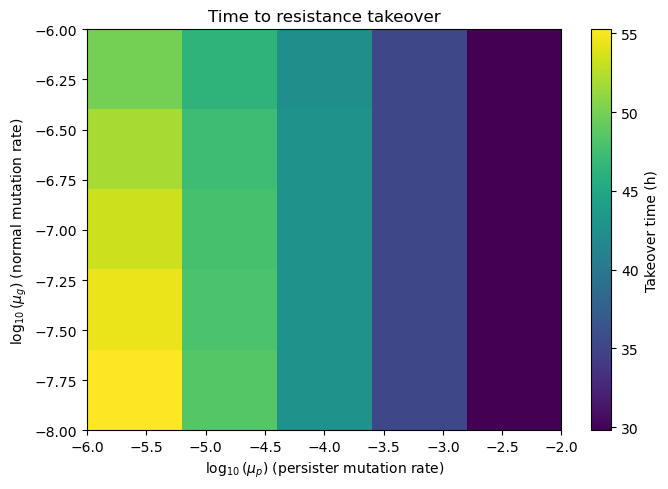

In [96]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

# --- Functions: drug kinetics, growth, mutation ---
def drug(t, decayRate, doseInterval, aPeak):
    dose_times = np.arange(0, t + 1, doseInterval)
    return np.sum([aPeak * np.exp(-decayRate * (t - d)) for d in dose_times if d <= t])

def growthRate(a, mic, gMax, gMin, kappa):
    r = a / mic
    return gMax - (gMax - gMin) * (r**kappa / (r**kappa + 1))

def mutationRate(g, m, tau, h):
    return m * g + tau * m * np.exp(-h * g) if g > 0 else 0

# --- ODE system ---
def system(t, y, p):
    nw, pw, nr1, pr1, nr2, pr2, nr3, pr3, e = y
    total = nw + pw + nr1 + pr1 + nr2 + pr2 + nr3 + pr3
    a = drug(t, p['decayRate'], p['doseInterval'], p['aPeak'])
    aRate = p['aMax']
    b = p['b']

    gWt = growthRate(a, p['mic'][0], p['gMax'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR1 = growthRate(a, p['mic'][1], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR2 = growthRate(a, p['mic'][2], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])
    gR3 = growthRate(a, p['mic'][3], p['gMaxR'], p['gMin'], p['kappa']) * (1 - total / p['c'])

    muW = mutationRate(gWt, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muR1 = mutationRate(gR1, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muR2 = mutationRate(gR2, p['m'], p['tau'], p['h']) if p['mutation'] else 0
    muP = p['muP'] if p['mutation'] else 0

    dNw = gWt * nw - aRate * nw - muW * nw - p['jN'] * nw * e
    dPw = aRate * nw - b * pw - muP * pw - p['jP'] * pw * e

    dNr1 = gR1 * nr1 - aRate * nr1 - muR1 * nr1 - p['jN'] * nr1 * e
    dPr1 = aRate * nr1 - b * pr1 - p['jP'] * pr1 * e

    dNr2 = gR2 * nr2 - aRate * nr2 - muR2 * nr2 - p['jN'] * nr2 * e
    dPr2 = aRate * nr2 - b * pr2 - p['jP'] * pr2 * e

    dNr3 = gR3 * nr3 - aRate * nr3 - p['jN'] * nr3 * e
    dPr3 = aRate * nr3 - b * pr3 - p['jP'] * pr3 * e

    dPr1 += muP * pw
    dPr2 += muP * pr1
    dPr3 += muP * pr2
    dNr1 += muW * nw
    dNr2 += muR1 * nr1 + muR1 * pr1
    dNr3 += muR2 * nr2 + muR2 * pr2
    dNw += b * pw
    dNr1 += b * pr1
    dNr2 += b * pr2
    dNr3 += b * pr3
    dE = p['q'] * (p['emax'] - e) - p['l'] * e

    return [dNw, dPw, dNr1, dPr1, dNr2, dPr2, dNr3, dPr3, dE]

# --- Simulation base parameters ---
baseParams = {
    'mic': [1, 10, 40, 100],
    'gMax': 1.0,
    'gMaxR': 0.95,
    'gMin': -6.5,
    'kappa': 1.5,
    'c': 5e9,
    'b': 0.1,
    'tau': 100,
    'h': 5,
    'mutation': True,
    'aPeak': 10,
    'aMax': 1e-3,   # ✅ <-- Add this!
    'doseInterval': 12,
    'decayRate': np.log(2) / 2.5,
    'emax': 1e6,
    'l': 1e-3,
    'q': 3e-4,
    'jN': 5e-6,
    'jP': 5e-8
}

# --- Sweep ranges ---
muG_vals = [1e-8, 3e-8, 1e-7, 3e-7, 1e-6]
muP_vals = [1e-6, 1e-5, 1e-4, 1e-3, 1e-2]

# --- Simulate and collect takeover times ---
takeover_times = np.full((len(muG_vals), len(muP_vals)), np.nan)
t_span = (0, 240)
t_eval = np.linspace(*t_span, 1000)
y0 = [1e7, 0, 1, 0, 0, 0, 0, 0, 0]

for i, muG in enumerate(muG_vals):
    for j, muP in enumerate(muP_vals):
        p = baseParams.copy()
        p['m'] = muG
        p['muP'] = muP
        sol = solve_ivp(system, t_span, y0, args=(p,), t_eval=t_eval, method='BDF', atol=1e-9, rtol=1e-6)
        r_total = sol.y[2] + sol.y[3] + sol.y[4] + sol.y[5] + sol.y[6] + sol.y[7]
        if np.any(r_total > 1e8):
            takeover_times[i, j] = sol.t[np.argmax(r_total > 1e8)]

# --- Plot heatmap ---
plt.figure(figsize=(7, 5))
im = plt.imshow(takeover_times, origin='lower', cmap='viridis', aspect='auto',
                extent=[np.log10(muP_vals[0]), np.log10(muP_vals[-1]),
                        np.log10(muG_vals[0]), np.log10(muG_vals[-1])])
plt.colorbar(label='Takeover time (h)')
plt.xlabel(r'$\log_{10}(\mu_p)$ (persister mutation rate)')
plt.ylabel(r'$\log_{10}(\mu_g)$ (normal mutation rate)')
plt.title('Time to resistance takeover')
plt.tight_layout()
plt.show()


<>:16: SyntaxWarning: invalid escape sequence '\m'
<>:19: SyntaxWarning: invalid escape sequence '\m'
<>:21: SyntaxWarning: invalid escape sequence '\m'
<>:16: SyntaxWarning: invalid escape sequence '\m'
<>:19: SyntaxWarning: invalid escape sequence '\m'
<>:21: SyntaxWarning: invalid escape sequence '\m'
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/3210896717.py:16: SyntaxWarning: invalid escape sequence '\m'
  plt.plot(muG_vals, times, label=f'$\mu_p$={muP:.0e}')
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/3210896717.py:19: SyntaxWarning: invalid escape sequence '\m'
  plt.xlabel('$\mu_g$ (normal mutation rate)')
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/3210896717.py:21: SyntaxWarning: invalid escape sequence '\m'
  plt.title('Takeover time vs. $\mu_g$ for different $\mu_p$')
/var/folders/y8/tkwp24594js1pmrbn1t9h9tr0000gn/T/ipykernel_4851/3210896717.py:23: UserWarning: First parameter to grid() is false, but line properties

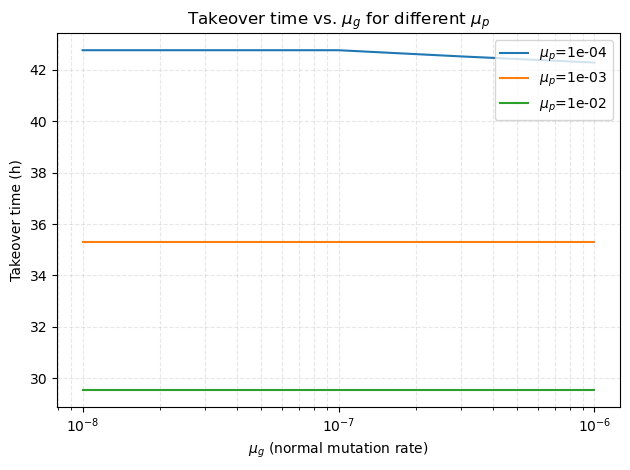

In [97]:
# --- Line plot: Fix muP, sweep muG ---
plt.figure()
for muP in [1e-4, 1e-3, 1e-2]:
    times = []
    for muG in muG_vals:
        p = baseParams.copy()
        p['m'] = muG
        p['muP'] = muP
        sol = solve_ivp(system, t_span, y0, args=(p,), t_eval=t_eval, method='BDF')
        r_total = sol.y[2] + sol.y[3] + sol.y[4] + sol.y[5] + sol.y[6] + sol.y[7]
        if np.any(r_total > 1e8):
            tko = sol.t[np.argmax(r_total > 1e8)]
        else:
            tko = np.nan
        times.append(tko)
    plt.plot(muG_vals, times, label=f'$\mu_p$={muP:.0e}')

plt.xscale('log')
plt.xlabel('$\mu_g$ (normal mutation rate)')
plt.ylabel('Takeover time (h)')
plt.title('Takeover time vs. $\mu_g$ for different $\mu_p$')
plt.legend()
plt.grid(False, which='both', ls='--', alpha=0.3)
plt.tight_layout()
plt.show()
